# Problem Statement:

## Introduction#
``` Given the codon usage bias level data of any organism, the aim is to devise a method to correctly predict the DNA type and Kingdom of the organism.```

## Business Problem: 
Each organism in the universe has 64 codons. But the usage of these codons may differ from organism to organism. In all the eukaryotic and prokaryotic organisms, It has been seen that some organisms use some codons more than the others i.e the organisms are biased on using some of the codons more than others. So the level of use of codons can be very helpful in predicting the other features of the organism (such as type of DNA or kingdom to which organism belongs.)
Since the DNAtype and Kingdom of the organisms decide most of its biological properties. So we can use this codon usage information for predicting DNAtype and Kingdom of organisms which can be very helpful in the study of the organisms.

## ML Formulation : 
Given codon usage data, we can train machine learning models which could classify the organism into different classes of Kingdom and DNAtype, if the codon usage data is known.
## Business Constraints:
* No low latency required.
* Interpretability is required..
* Probability score of organisms belonging to particular class is required.


# Download the data

In [1]:
import zipfile
with zipfile.ZipFile(filename, 'r') as zip_ref:
    zip_ref.extractall()

NameError: name 'filename' is not defined

# Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import tqdm
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost 
import lightgbm as lgb
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import lightgbm

try:
    import optuna
except:
    !pip install optuna 
    import optuna

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [2]:
# load the data
data = pd.read_csv('codon_usage.csv', low_memory=False)
data.head(4)

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus,0.01654,0.01203,0.00050,0.00351,0.01203,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,vrl,0,100220,1474,Bohle iridovirus,0.02714,0.01357,0.00068,0.00678,0.00407,...,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,vrl,0,100755,4862,Sweet potato leaf curl virus,0.01974,0.0218,0.01357,0.01543,0.00782,...,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144
3,vrl,0,100880,1915,Northern cereal mosaic virus,0.01775,0.02245,0.01619,0.00992,0.01567,...,0.00366,0.01410,0.01671,0.03760,0.01932,0.03029,0.03446,0.00261,0.00157,0.00000


# 1. Checking shape and dtypes of columns

In [3]:

print("The shape of data :", data.shape)
print("The Columns of the dataset are:", data.columns)

D_type = data.dtypes
for t in range(len(D_type)):
    if D_type.iloc[t]=='object':
        print(f"The dtype of {D_type.index[t]} is ", D_type.iloc[t])

The shape of data : (13028, 69)
The Columns of the dataset are: Index(['Kingdom', 'DNAtype', 'SpeciesID', 'Ncodons', 'SpeciesName', 'UUU',
       'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA',
       'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
       'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC',
       'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
       'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG',
       'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
       'UAA', 'UAG', 'UGA'],
      dtype='object')
The dtype of Kingdom is  object
The dtype of SpeciesName is  object
The dtype of UUU is  object
The dtype of UUC is  object


Here all the dtype of all the codons was ```float32``` but only two codons ```( UUU, UUC)``` has dtype ```object```, But the values inside UUU and UUC are the float value. So let's check weather all the values inside these columns are float or not.

In [4]:
bad_idx = []
for idx, val in enumerate(data['UUU']):
    try:
        float(val)
    except:
        bad_idx.append(idx)
        print(f'The value of UUU column at index({idx}) is ', data['UUU'].iloc[idx])


for idx, val in enumerate(data['UUC']):
    try:
        float(val)
    except:
        print(f'The value of UUU column at index({idx}) is ', data['UUC'].iloc[idx])

# removing the row with garbage values 
good_idx = [idx for idx in data.index if idx not in bad_idx]
data = data.iloc[good_idx]

# changing the datatypes to float

data['UUU'] = data['UUU'].apply(lambda x:float(x))
                        
data['UUC'] = data['UUU'].apply(lambda x:float(x))


The value of UUU column at index(486) is  non-B hepatitis virus
The value of UUU column at index(5063) is  12;I
The value of UUU column at index(5063) is  -


So we can drop two rows and change the dtype of column UU and UUC to float

# 2. Checking general statistics of data

In [5]:

print("The Number of NA values in the Data:", data.isna().sum().sum())
data.describe()

The Number of NA values in the Data: 0


,DNAtype,SpeciesID,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
count,13026.000000,13026.000000,1.302600e+04,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,...,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000
mean,0.367265,130443.036926,7.961776e+04,0.024818,0.024818,0.020637,0.014104,0.017821,0.018287,0.019045,...,0.005453,0.009930,0.006423,0.024181,0.021164,0.028291,0.021683,0.001640,0.000590,0.006179
std,0.688764,124777.067741,7.197556e+05,0.017628,0.017628,0.020710,0.009280,0.010587,0.014573,0.024252,...,0.006601,0.008574,0.006388,0.013826,0.013039,0.014343,0.015019,0.001785,0.000882,0.010345
min,0.000000,7.000000,1.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,28851.250000,1.602000e+03,0.013910,0.013910,0.005610,0.007103,0.010890,0.007830,0.005302,...,0.001220,0.001690,0.001170,0.012390,0.011860,0.017360,0.009710,0.000560,0.000000,0.000410
50%,0.000000,81971.500000,2.929000e+03,0.021750,0.021750,0.015260,0.013360,0.016130,0.014560,0.009680,...,0.003530,0.009270,0.004545,0.025425,0.019070,0.026085,0.020540,0.001380,0.000420,0.001130
75%,1.000000,222890.500000,9.120000e+03,0.031308,0.031308,0.029495,0.019808,0.022730,0.025110,0.017255,...,0.007150,0.015928,0.010250,0.034190,0.027690,0.036800,0.031128,0.002370,0.000830,0.002890
max,12.000000,465364.000000,4.066258e+07,0.217300,0.217300,0.151330,0.101190,0.089780,0.100350,0.163920,...,0.055540,0.098830,0.058430,0.185660,0.113840,0.144890,0.158550,0.045200,0.025610,0.106700


# 3 Tasks data Division

Since we have two tasks
* Kingdom classification
* DNAtype Classification

So let's first seperate the data for both of the tasks

In [6]:
data = data.drop(['SpeciesID', 'SpeciesName'], axis = 1)

data_kingdom = data.drop(['DNAtype'], axis = 1)
data_dnatype = data.drop(['Kingdom'], axis = 1)

print("The shape of data for Kingdom classification", data_dnatype.shape)
print("The shape of data for DNAtype classification", data_dnatype.shape)



The shape of data for Kingdom classification (13026, 66)
The shape of data for DNAtype classification (13026, 66)


## 1 Task 1 Kingdom Classification

### 1.1  Exploratory data analysis

#### 1.1.1 Analysis of target variable

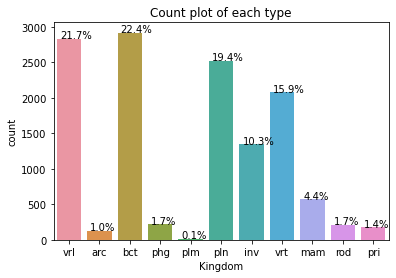

In [8]:
# plot countplot of Kingdom
ax = sns.countplot(data = data, x = 'Kingdom')

# label the patches by percentage
patches = ax.patches
total = len(data_kingdom)
for patch in patches:
    height = patch.get_height()
    percent = (height/total)*100
    ax.annotate('{:.1f}%'.format(percent), (patch.get_x()+0.1, patch.get_height()+5))


plt.title('Count plot of each type')
plt.show()

* So from the above plot its very clear that data is highly imbalanced for classification.
* The occurance of the class is as low as 0.1% and as high as 22% for different classes.

Since our task is to classify th codon usage data into three classes (archea, bacteria and eukaryots) So we will try to map the given classes into these 3 classes.

* bct = {bct, phg, plm}

* arc = {arc}

* euk = {pln, inv, vrt, mam, rod, pri}


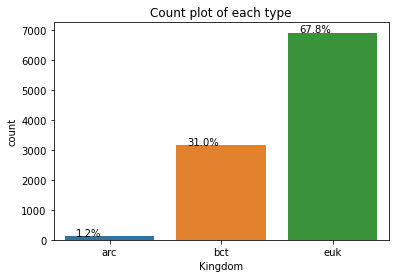

In [9]:
d1 = dict(zip(['pln', 'inv','vrt', 'mam', 'rod', 'pri'], ['euk' for i in range(6)]))
d2 = dict(zip(['bct', 'phg', 'plm'], ['bct' for i in range(6)]))

data_kingdom['Kingdom'] = data_kingdom['Kingdom'].replace(d1)
data_kingdom['Kingdom'] = data_kingdom['Kingdom'].replace(d2)

data_kingdom = data_kingdom[data_kingdom['Kingdom']!='vrl']

# plot countplot of Kingdom
ax = sns.countplot(data = data_kingdom, x = 'Kingdom')

# label the patches by percentage
patches = ax.patches
total = len(data_kingdom)
for patch in patches:
    height = patch.get_height()
    percent = (height/total)*100
    ax.annotate('{:.1f}%'.format(percent), (patch.get_x()+0.1, patch.get_height()+5))


plt.title('Count plot of each type')
plt.show()

 **Conclusion** : Since it a problem of imbalance classification, so accuracy as a evaluation matrix is no longer available for us since it favours the majority class.
So I am selecting F1-score and AUC score as a evelution matrix of my model.

####  1.1.1 **Univariate analysis**

**A) Ncodons**

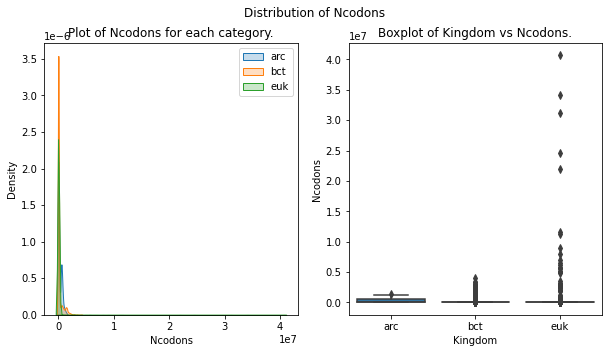

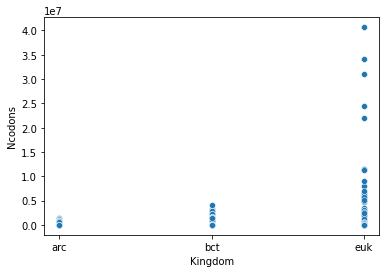

In [10]:
# plotting boxplot of Ncodons

def plot_kde_and_box(data, query_col, category_col):
    # make subplot and  give title
    fig, ax = plt.subplots(1, 2, figsize=(10,5))
    fig.suptitle(f'Distribution of {query_col}')

    # get unique categories and generate colors
    cat = data[category_col].unique()
    num_cat = cat.shape[0]
    colors = sns.color_palette(n_colors = num_cat)

    plt.subplot(1, 2, 1)
    # prepare data and plot for each class
    for i in range(num_cat):
        s = data[data[category_col]==cat[i]][query_col]
        p1 = sns.kdeplot(s, color= colors[i], shade=True, label='Yes')
    plt.legend(cat.tolist())
    plt.title(f'Plot of {query_col} for each category.')

    plt.subplot(1, 2, 2)
    #  Boxplot Ncodons wrt kingdom
    sns.boxplot(data = data, x = category_col, y = query_col)
    plt.title(f'Boxplot of {category_col} vs {query_col}.')
    plt.show()

plot_kde_and_box(data_kingdom, 'Ncodons', 'Kingdom')
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'Ncodons')
plt.show()

* Its clear from the plot that most of the Ncodons values are near to 1*10^7.
* There are also some higher values of Ncodons which may be outliers especially in eukaryot class.
* Also,  even if archaea  has too less number of datapoints, than also the distribution of archaea  is more dispersed than all other Kingdom, So it could be useful feature for classification
 Also from the scatterplot of Ncodons, its clear that **if the ```Ncodons>0.3*10^7```, than it can't be from archea class.**

**Now let's plot all the codons at once to get idea of which plot are need to be anlysed further.**

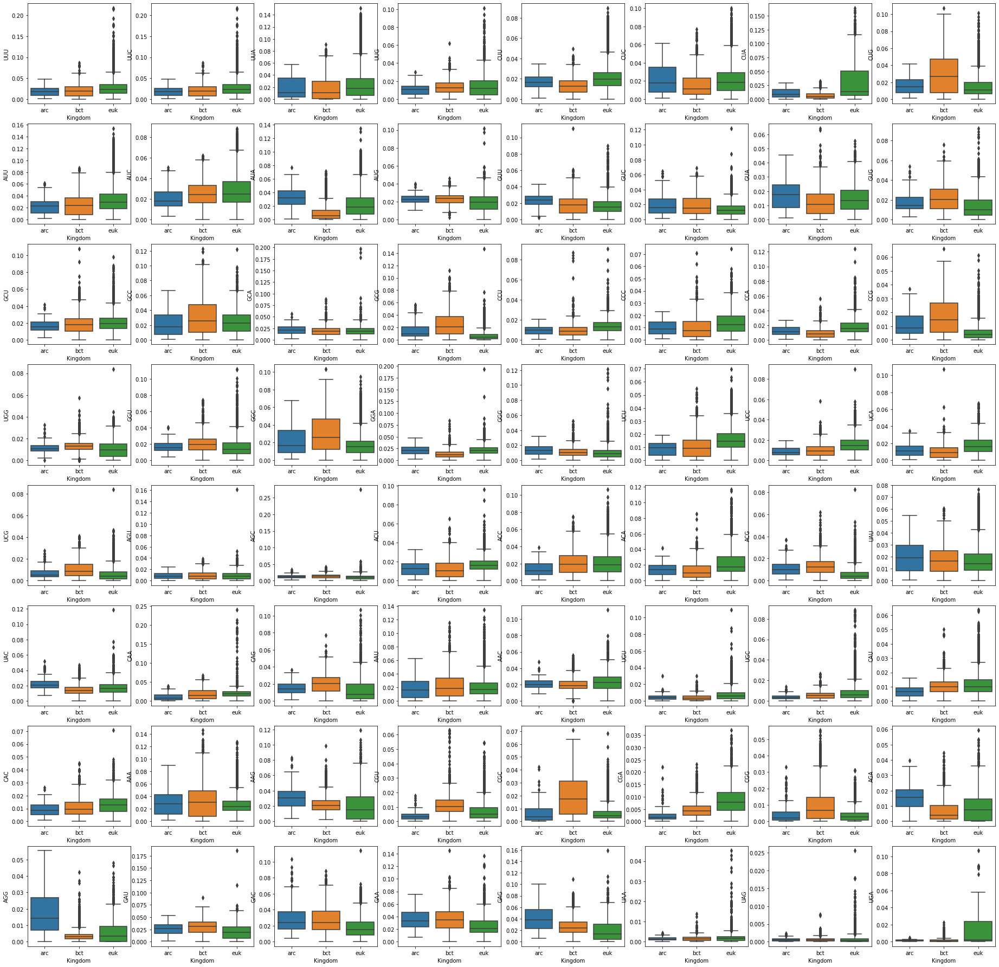

In [11]:
codons_col = ['UUU','UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA','AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
                'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC','UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
                'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG','CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
                'UAA', 'UAG', 'UGA']
fig, axes = plt.subplots(8, 8, figsize = (32, 32))

temp = 0
for i in range(8):
    for j in range(8):
        sns.boxplot(data = data_kingdom, x= 'Kingdom' , y=codons_col[temp] , ax = axes[i][j])
        temp+=1
plt.show()

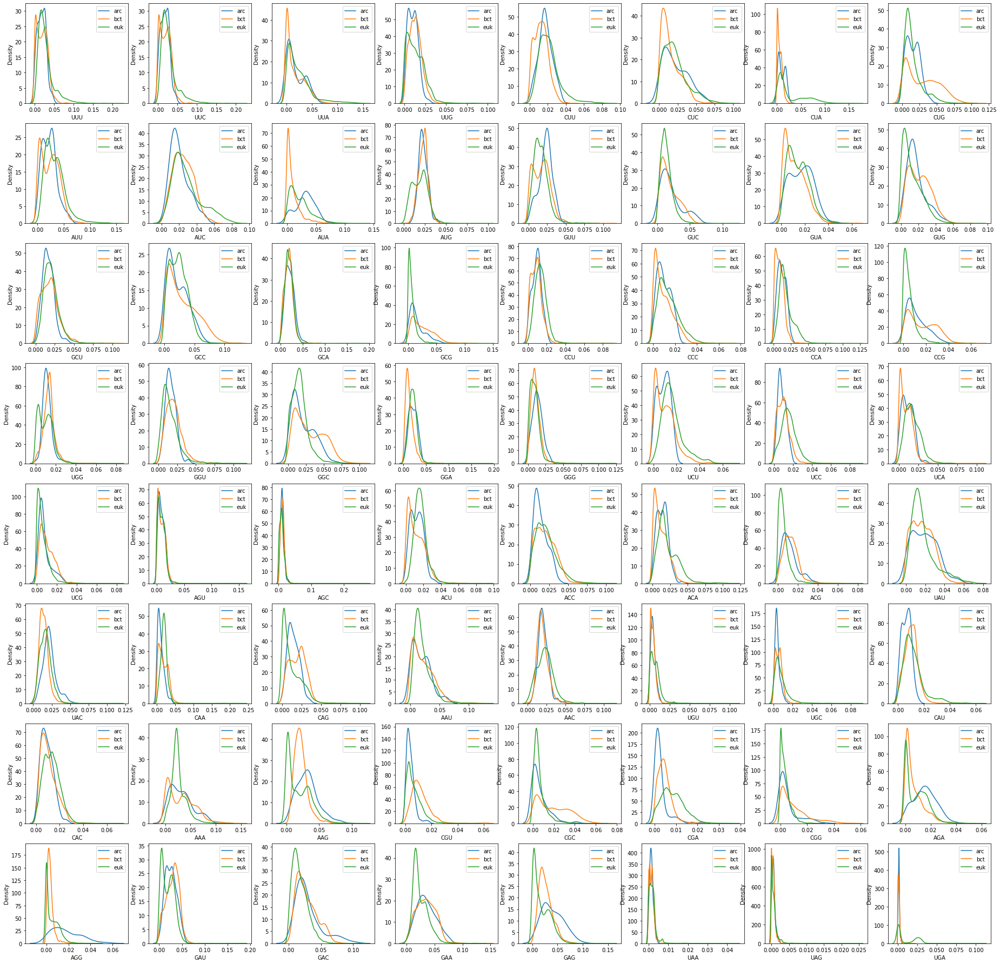

In [12]:
codons_col = ['UUU','UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA','AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
                'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC','UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
                'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG','CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
                'UAA', 'UAG', 'UGA']
fig, axes = plt.subplots(8, 8, figsize = (32, 32))

temp = 0
for i in range(8):
    for j in range(8):
        cat = data_kingdom['Kingdom'].unique().tolist()
        for idx in range(len(cat)):
            d = data_kingdom[data_kingdom['Kingdom']==cat[idx]][codons_col[temp]]
            sns.kdeplot(data = d , ax = axes[i][j])
        axes[i][j].legend(['arc', 'bct', 'euk'])
        temp+=1
plt.show()

Seeing the above two subplots:
* Fetaures like CUG, UGA, AGG, AAA, CGA, UGA, GGC, AUA, UCU, CUG, CUA.

**2. CUG**

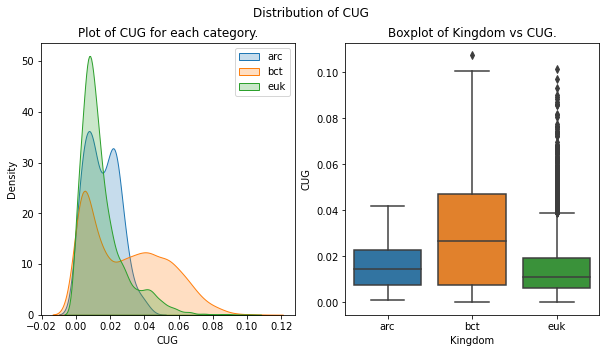

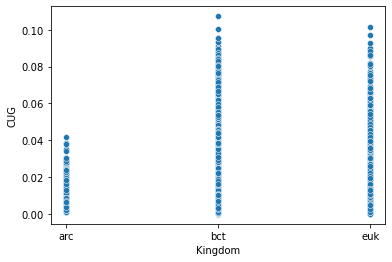

In [13]:
plot_kde_and_box(data_kingdom, 'CUG', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'CUG')
plt.show()

**3. UGA**

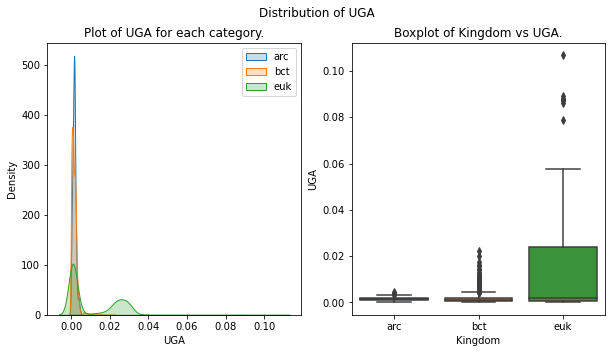

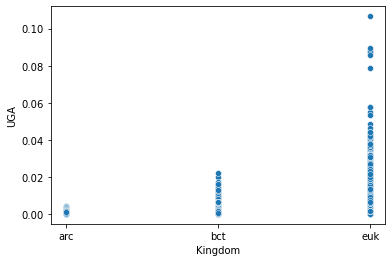

In [14]:
plot_kde_and_box(data_kingdom, 'UGA', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'UGA')
plt.show()

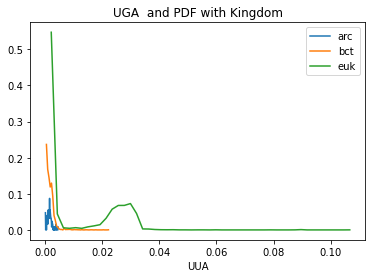

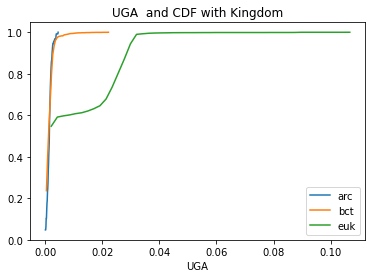

In [15]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['UGA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UGA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UGA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UUA')
plt.title('UGA  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UGA')
plt.title('UGA  and CDF with Kingdom')
plt.show()

* if UGA>0.01; than datapoint belong to euk with 90% accuracy.
* if UGA>0.025; Than datapoint belong to euk class.
* if UGA>0.1; than datapoint can't belong to arc.

**4 AGG**

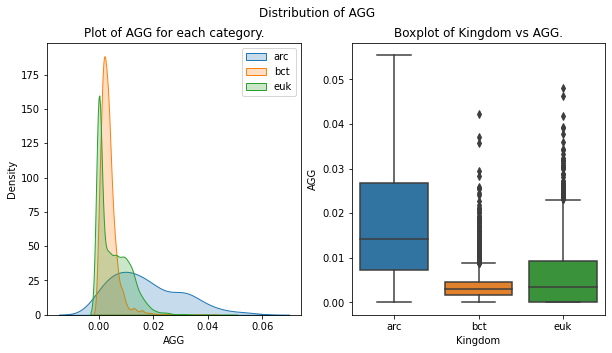

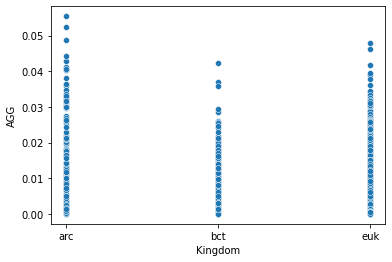

In [16]:
plot_kde_and_box(data_kingdom, 'AGG', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'AGG')
plt.show()

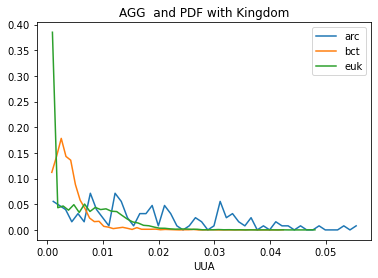

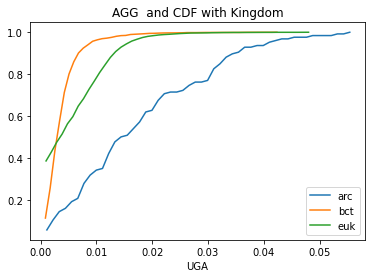

In [17]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['AGG'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AGG'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AGG'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UUA')
plt.title('AGG  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UGA')
plt.title('AGG  and CDF with Kingdom')
plt.show()

* From the boxplot of AGG, it seems to seperate the data points well.
* PDF of AGG feature:    
    * UGA>0.02 ; datapoint belong to arc with more than 90% accuracy.
* The PDF seems to seperate the ditribution of all three class

**5 AAA**

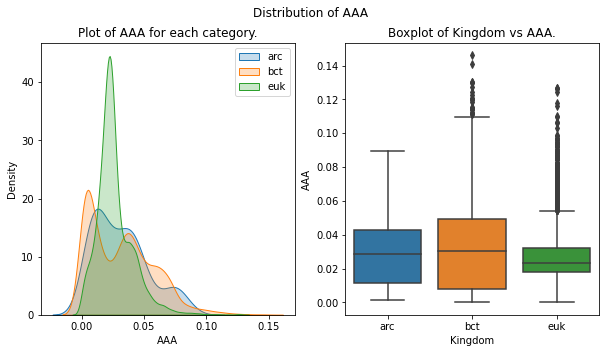

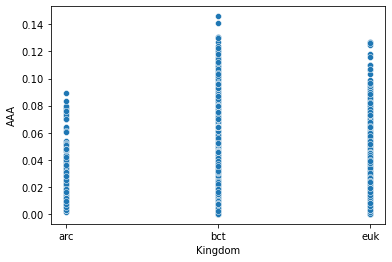

In [18]:
plot_kde_and_box(data_kingdom, 'AAA', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'AAA')
plt.show()

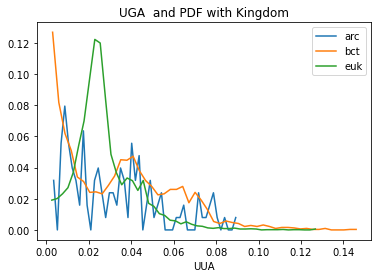

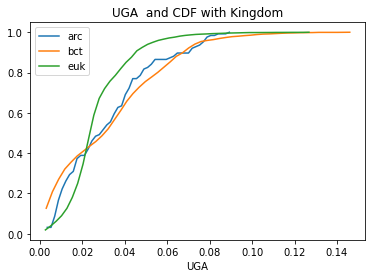

In [19]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['AAA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AAA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AAA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UUA')
plt.title('UGA  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UGA')
plt.title('UGA  and CDF with Kingdom')
plt.show()

**6 CGA**

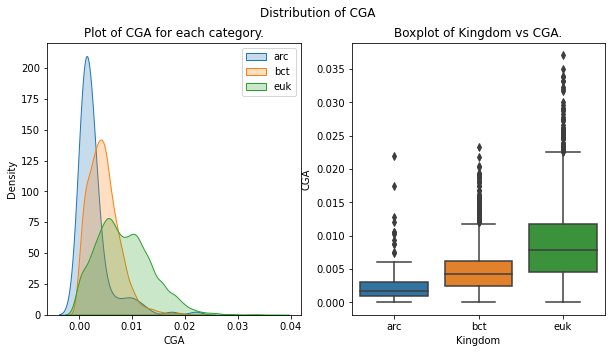

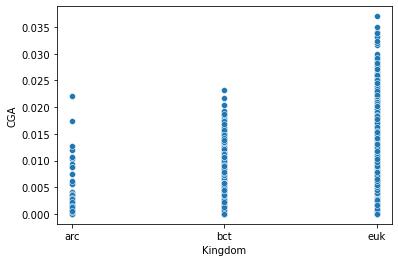

In [20]:
plot_kde_and_box(data_kingdom, 'CGA', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'CGA')
plt.show()

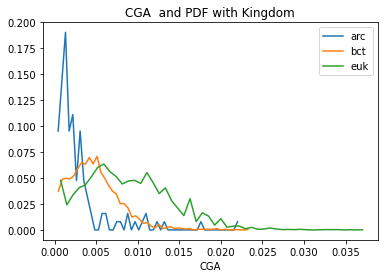

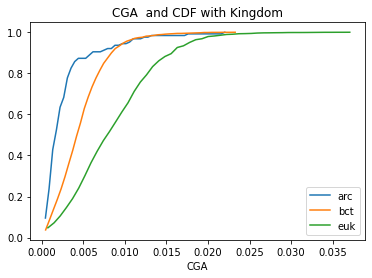

In [21]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['CGA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CGA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CGA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CGA')
plt.title('CGA  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CGA')
plt.title('CGA  and CDF with Kingdom')
plt.show()

**7 GGC**

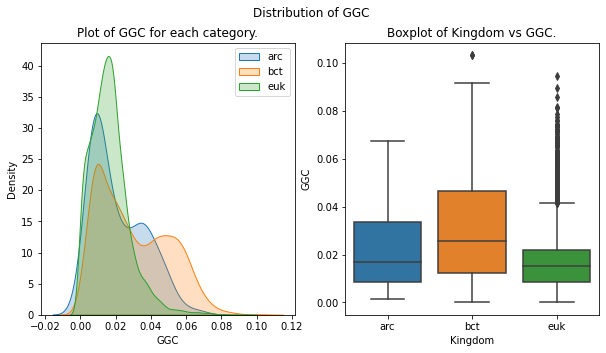

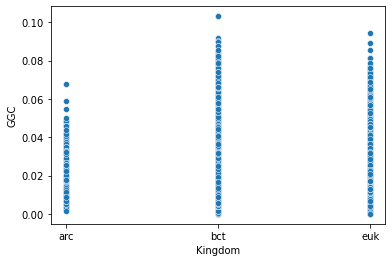

In [22]:
plot_kde_and_box(data_kingdom, 'GGC', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'GGC')
plt.show()

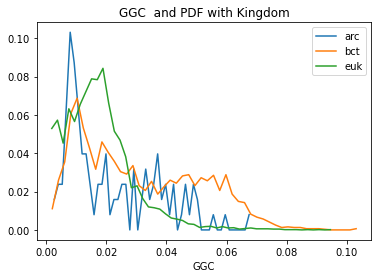

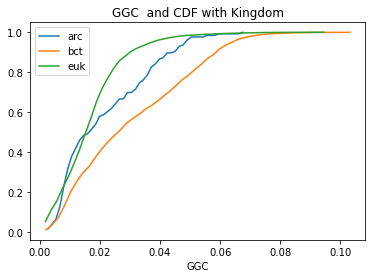

In [23]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['GGC'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['GGC'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['GGC'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('GGC')
plt.title('GGC  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('GGC')
plt.title('GGC  and CDF with Kingdom')
plt.show()

**8 AUA**

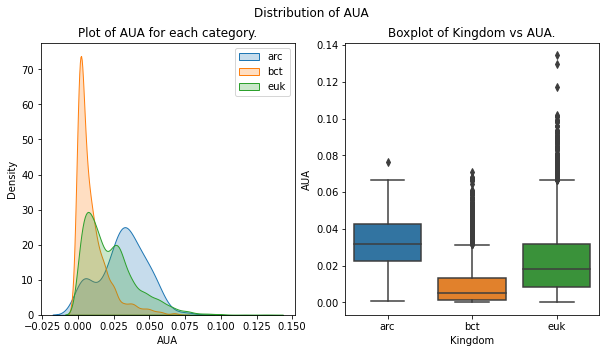

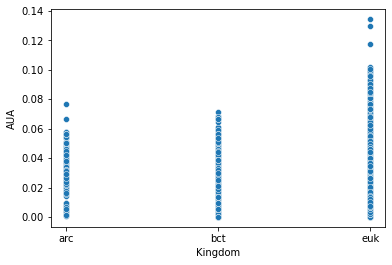

In [24]:
plot_kde_and_box(data_kingdom, 'AUA', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'AUA')
plt.show()

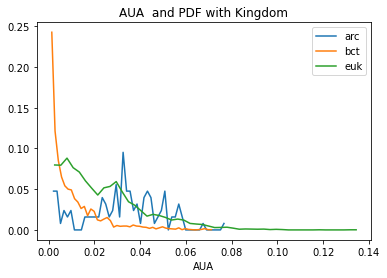

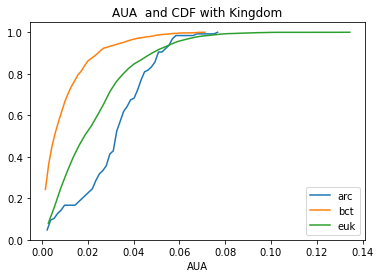

In [25]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['AUA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AUA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AUA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('AUA')
plt.title('AUA  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('AUA')
plt.title('AUA  and CDF with Kingdom')
plt.show()

**9 UCU**

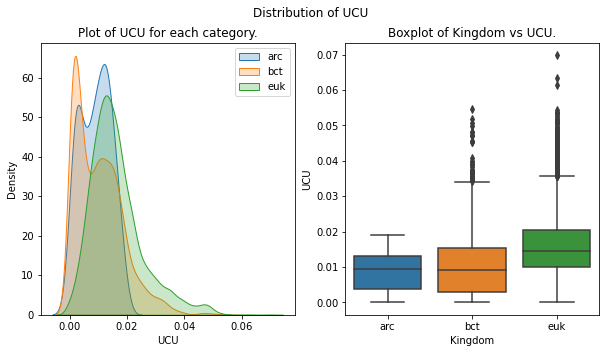

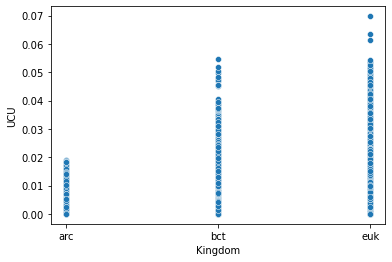

In [26]:
plot_kde_and_box(data_kingdom, 'UCU', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'UCU')
plt.show()

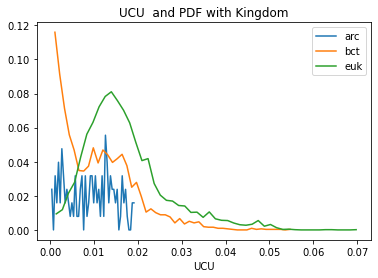

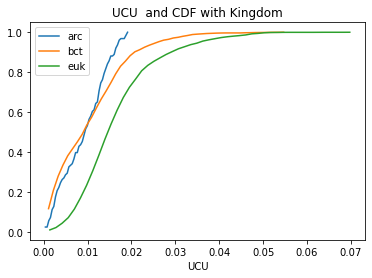

In [27]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['UCU'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UCU'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UCU'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UCU')
plt.title('UCU  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UCU')
plt.title('UCU  and CDF with Kingdom')
plt.show()

**10 CUG**

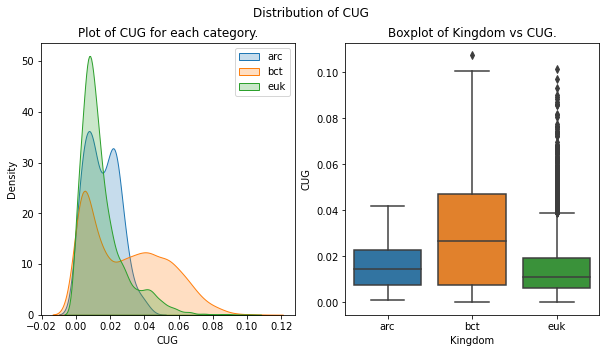

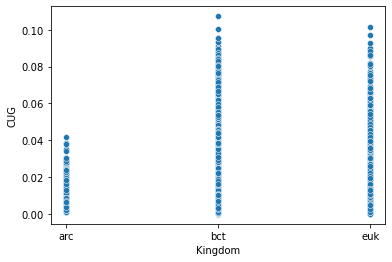

In [28]:
plot_kde_and_box(data_kingdom, 'CUG', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'CUG')
plt.show()

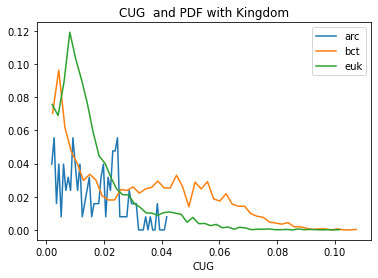

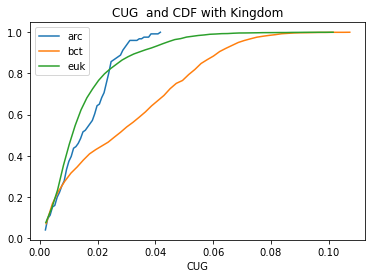

In [29]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['CUG'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CUG'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CUG'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CUG')
plt.title('CUG  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CUG')
plt.title('CUG  and CDF with Kingdom')
plt.show()

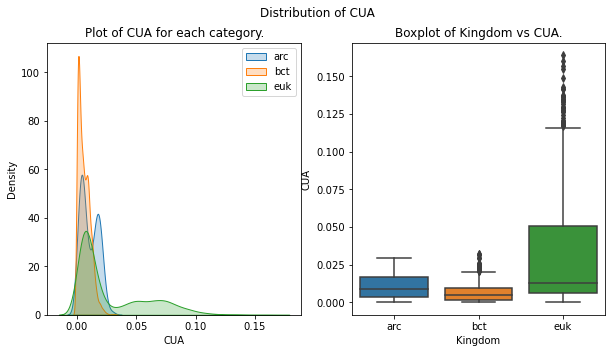

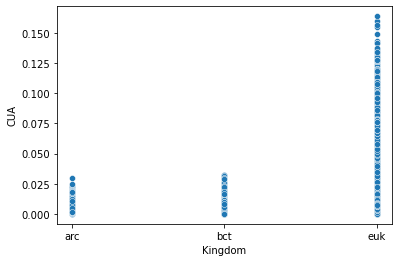

In [30]:
plot_kde_and_box(data_kingdom, 'CUA', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'CUA')
plt.show()

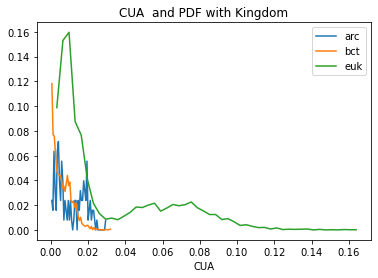

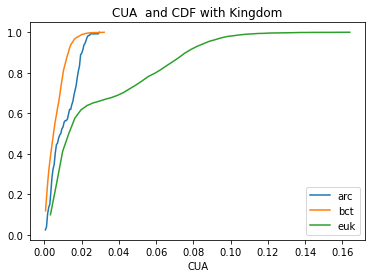

In [31]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['CUA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CUA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CUA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CUA')
plt.title('CUA  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('CUA')
plt.title('CUA  and CDF with Kingdom')
plt.show()

Conclusions:    
* if CUA>0.4 ; datapoint belong to euk class.

This feature is very important in seperating euk class with bct and arc class

**Feature Engineering**

Now let's do soe feature engineering stuff to come up with the important features whihc couuld be useful in classification. For this i followed two approch
* Stats based features
* Occurance of Neucleobases based features.

Let's Now engineer some of the features
* kurtosis
* mean
* mode
* median
* min
* max
* variance
* standard deviation
* first quantile 
* 1st quantile 
* 2nd quantile
* 3rd quantile


**1. Kurtosis**

In [32]:
data_kingdom_copy = data_kingdom.copy()

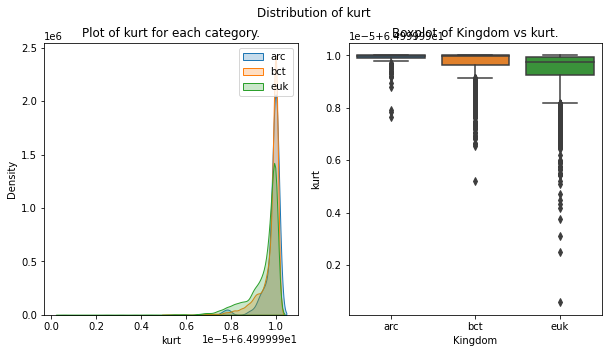

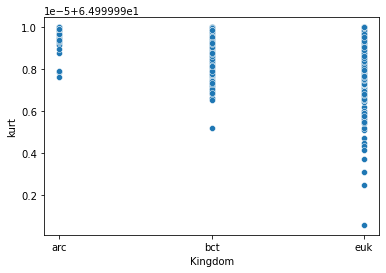

In [33]:
# Add a feature kurtosis
data_kingdom['kurt'] = data_kingdom_copy.kurtosis(axis = 1).values

# plot kde and boxplot 
plot_kde_and_box(data_kingdom, 'kurt', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'kurt')
plt.show()

Since the boxplot and scatter plot both show that it can be useful in classification of kingdom. So let's keep feature

**2. Median**

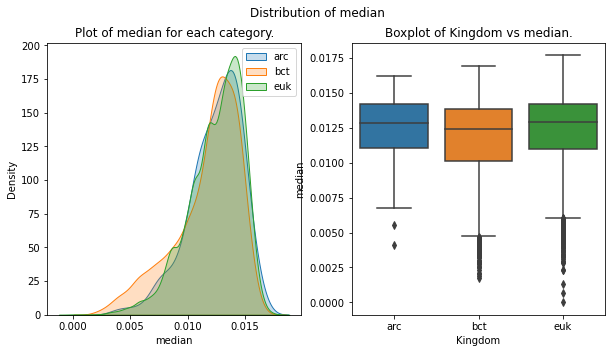

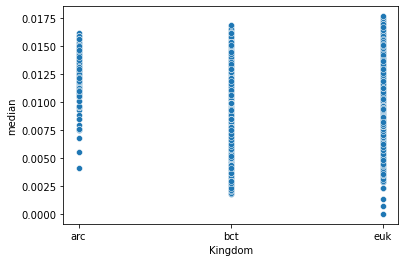

In [34]:
# Add a feature median to data_kingdom
data_kingdom['median'] = data_kingdom_copy.median(axis = 1).values

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'median', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'median')
plt.show()


**3. Mode**

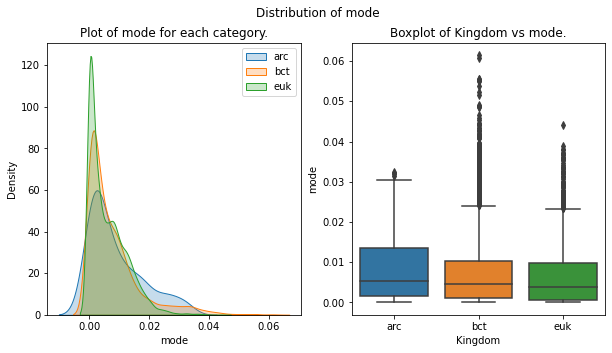

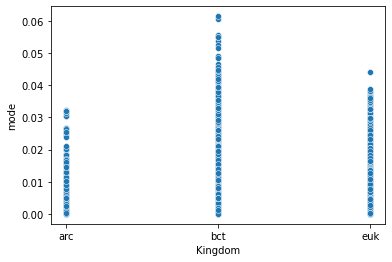

In [35]:
# Add a feature mode
data_kingdom['mode'] = data_kingdom_copy.mode(axis = 1).values[0:, 0]

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'mode', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'mode')
plt.show()


There is high overlapping in the mode across all the three classses. Let's keep the feature as of now and remove it by checking Feature importances is it is not relevent to model

**4. Variance**

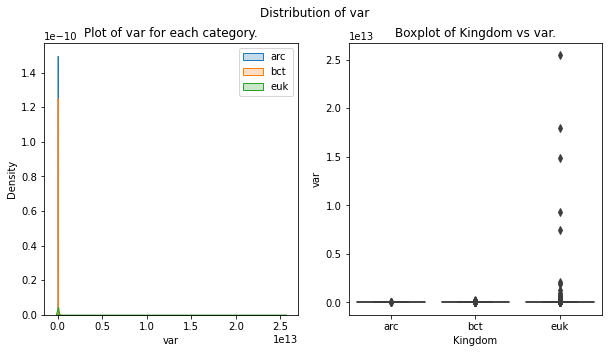

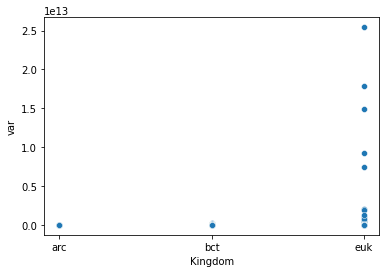

In [36]:
# Add a feature var
data_kingdom['var'] = data_kingdom_copy.var(axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'var', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'var')
plt.show()


There is not more variation in the variance of codons cross the classes but it can be still useful for classifying the euk class fro other two

**5. max**

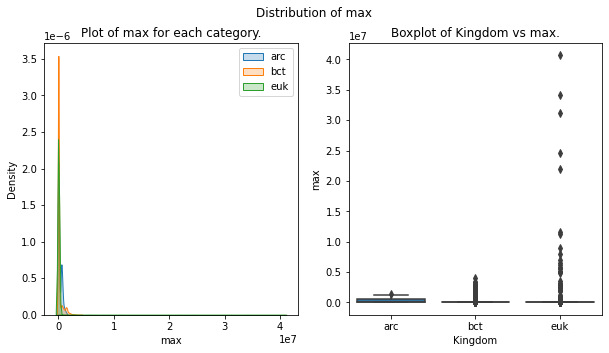

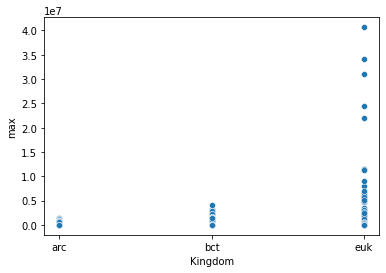

In [37]:
# Add a feature max
data_kingdom['max'] = data_kingdom_copy.max(axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'max', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'max')
plt.show()


**6 Min**

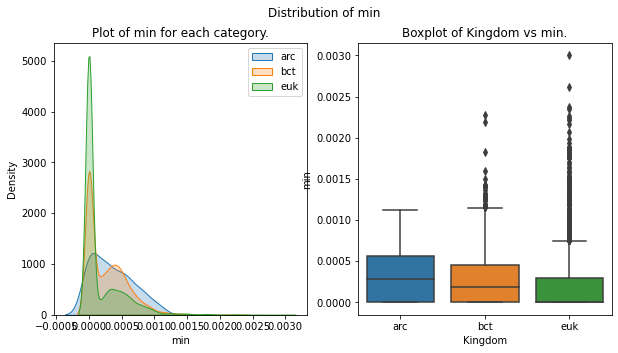

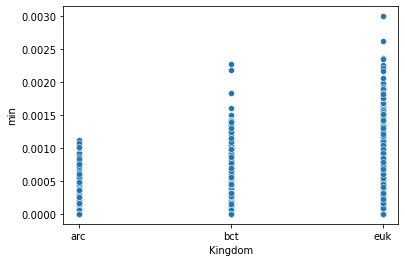

In [38]:
# Add a feature min
data_kingdom['min'] = data_kingdom_copy.min(axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'min', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'min')
plt.show()


**7 First Quantile**

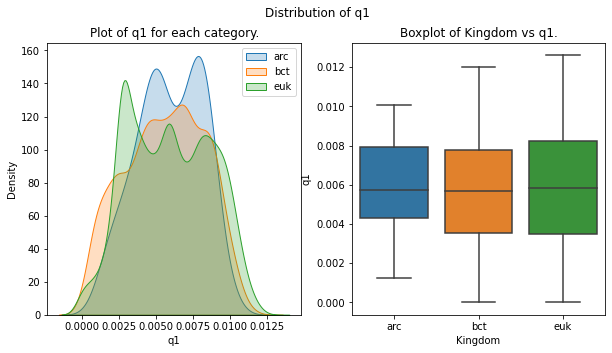

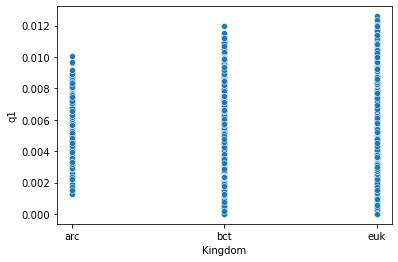

In [39]:
# Add a feature q1
data_kingdom['q1'] = data_kingdom_copy.quantile(0.25, axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'q1', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'q1')
plt.show()


**8 Second Quantile**

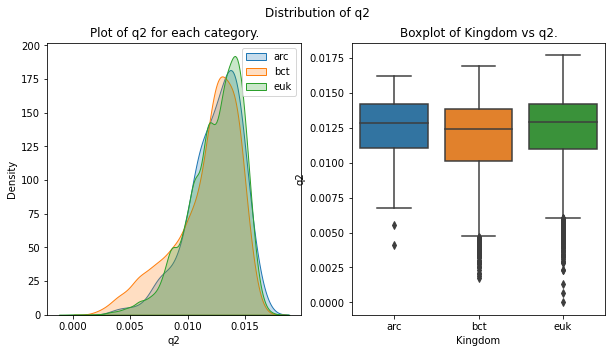

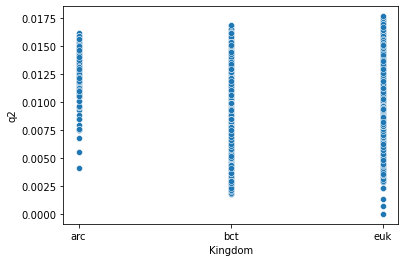

In [40]:
# Add a feature q2
data_kingdom['q2'] = data_kingdom_copy.quantile(0.50, axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'q2', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'q2')
plt.show()


**9 Third Quantile**

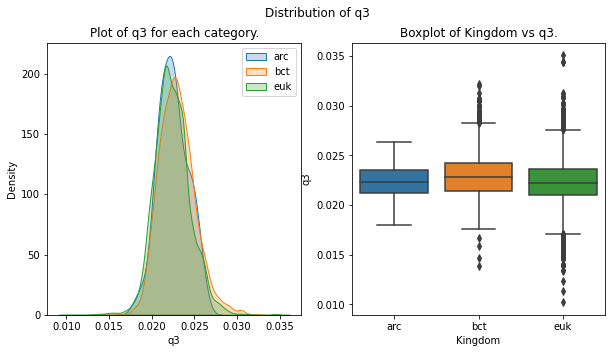

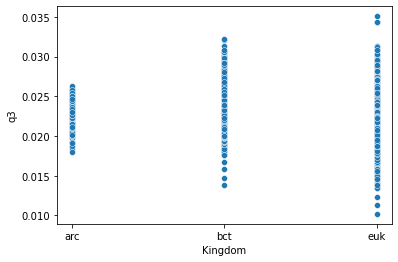

In [41]:
# Add a feature q3
data_kingdom['q3'] = data_kingdom_copy.quantile(0.75, axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'q3', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'q3')
plt.show()


**10 std**

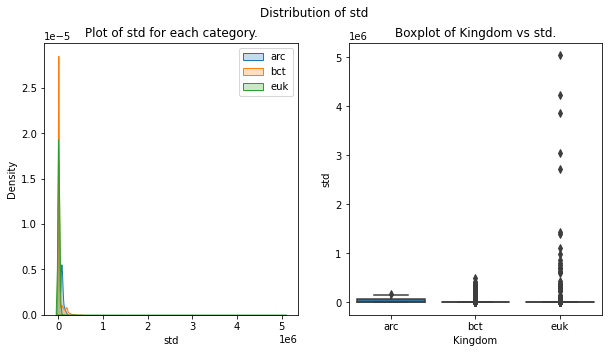

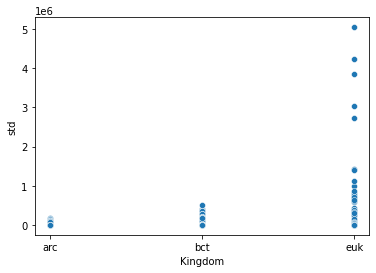

In [42]:
# Add a feature std
data_kingdom['std'] = data_kingdom_copy.std(axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'std', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'std')
plt.show()


**11 sum**

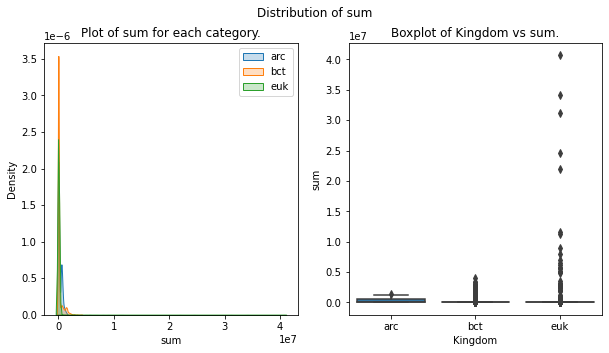

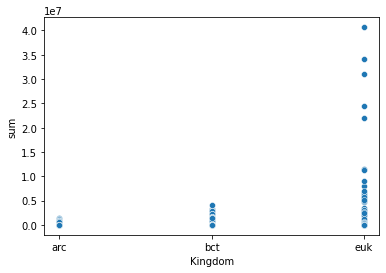

In [43]:
# Add a feature sum
data_kingdom['sum'] = data_kingdom_copy.sum(axis = 1)

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'sum', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'sum')
plt.show()


After analysis of all the statics based features, it has been seen that max, min, q3 and std  are not very useful. We are keeping these features as of now and later remove it after seeing feature importance of the model.

* **Generating features by using occurance of bases on DNA**

**Some Domain Knowledge:**

Since RNA containes the sequence of ```adenine (A), cytosine (C), guanine (G) and uracil (U)```. Thus if we see the structure of any RNA i will be the sequence of A G C U. Also in biology each amino acid is encoded by three set of bases known as codon.
Since we have 4 Nucleobases (i.e A G C U), so after applying permutation we have 64 codons(i.e 4*4*4 = 64) . So basically in the dataset we are given the probability of occurannce of each of codons (i.e AAA means in RNA representation AAA the number of times AAA occurs together divided by total number of codons in organism).

Now by using this information, we can also calculate the number of times UU occurs by summing up probability of all the features which containes UU.

Same approch I will be also applying for all Nucleobases.



**1 Generating feature UU**

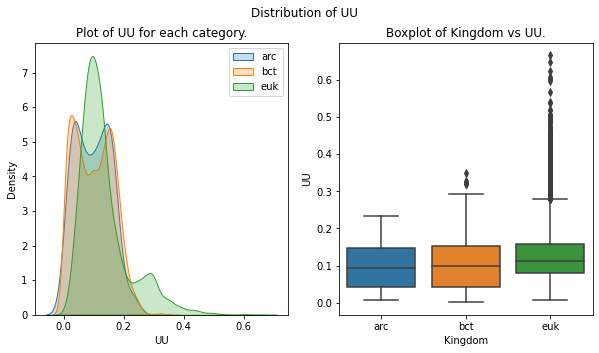

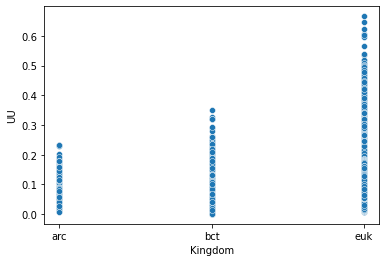

In [44]:
# Add all the codons having two consecutive U in name
U = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if col[0:2]=='UU' or col[-1:-3]=='UU' or (col[0]=='U' and col[-1]=='U'):
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    U.append(temp)

# Add a feature UU
data_kingdom['UU'] = U

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'UU', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'UU')
plt.show()


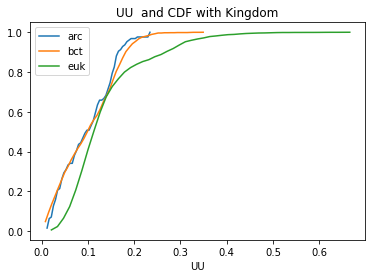

In [45]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['UU'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UU'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UU'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('UU')
plt.title('UU  and CDF with Kingdom')
plt.show()

**2 Generating feature AA**

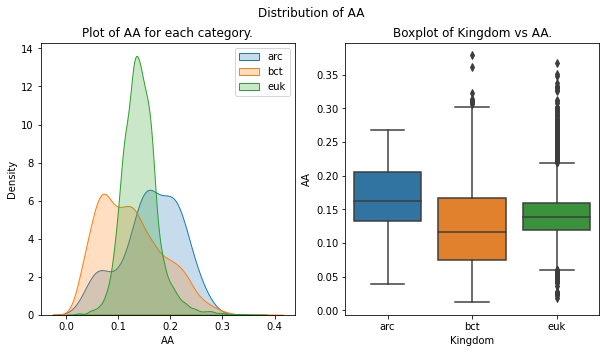

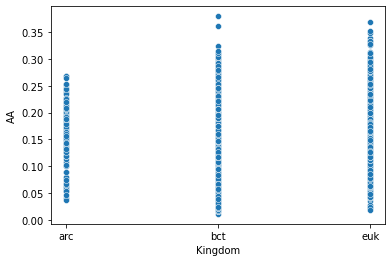

In [46]:
# Add all the codons having two consecutive A in name
    
A = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if col[0:2]=='AA' or col[-1:-3]=='AA' or (col[0]=='A' and col[-1]=='A'):
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    A.append(temp)

# Add a feature AA
data_kingdom['AA'] = A

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'AA', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'AA')
plt.show()



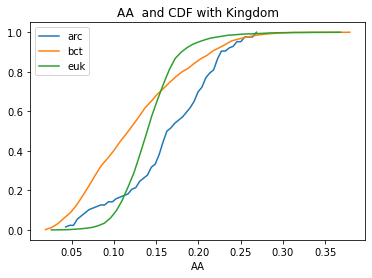

In [47]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['AA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('AA')
plt.title('AA  and CDF with Kingdom')
plt.show()

**3 Generating feature CC**

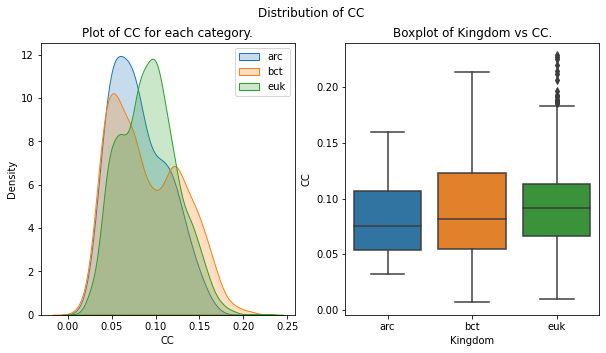

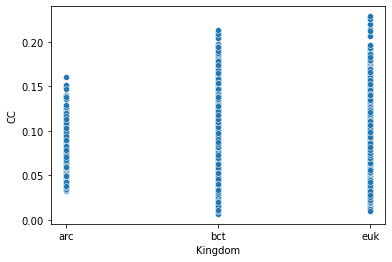

In [48]:
# Add all the codons having two consecutive C in name
C = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if col[0:2]=='CC' or col[-1:-3]=='CC' or (col[0]=='C' and col[-1]=='C'):
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    C.append(temp)

# Add a feature UU
data_kingdom['CC'] = C

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'CC', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'CC')
plt.show()



**4 Generating feature GG**

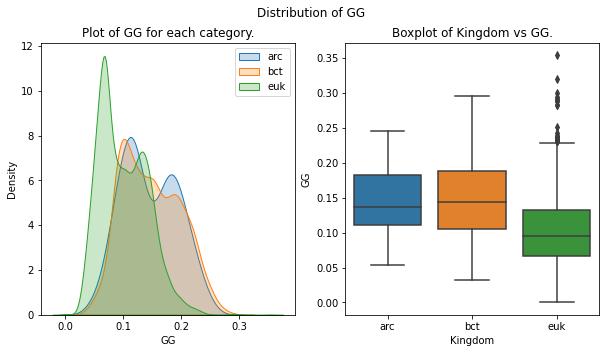

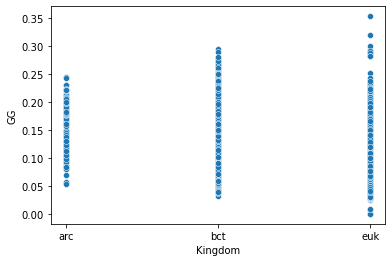

In [49]:
# Add all the codons having two consecutive G in name
G = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if col[0:2]=='GG' or col[-1:-3]=='GG' or (col[0]=='G' and col[-1]=='G'):
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    G.append(temp)

# Add a feature UU
data_kingdom['GG'] = G

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'GG', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'GG')
plt.show()



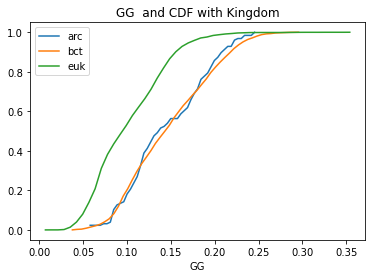

In [50]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['GG'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['GG'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['GG'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of GG
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('GG')
plt.title('GG  and CDF with Kingdom')
plt.show()

**5 Generating feature sum_g**

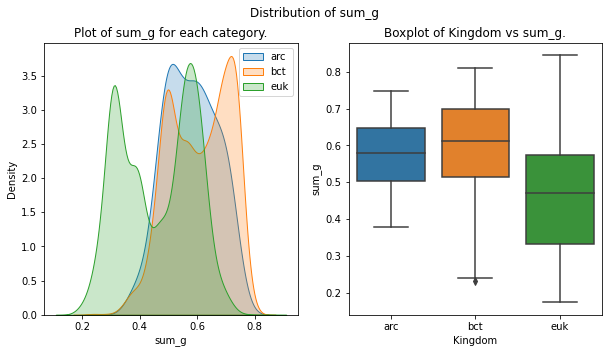

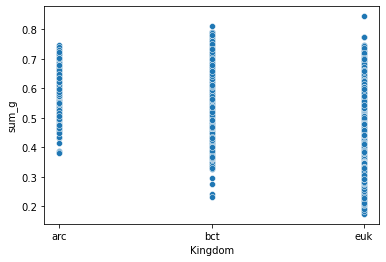

In [51]:
with_g = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if 'G' in col and len(col)==3:
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    with_g.append(temp)

data_kingdom['sum_g'] = with_g


plot_kde_and_box(data_kingdom, 'sum_g', 'Kingdom')

sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'sum_g')
plt.show()

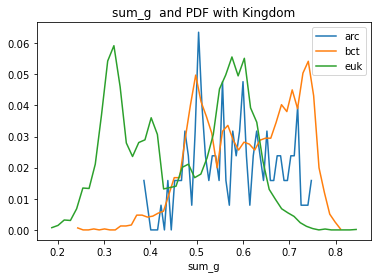

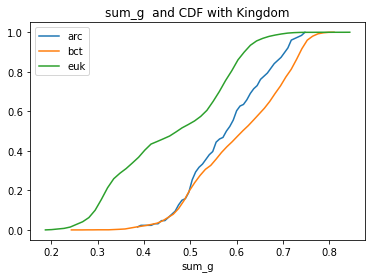

In [52]:
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

counts_0, bin_edges_0 = np.histogram(df_0['sum_g'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_g'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_g'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('sum_g')
plt.title('sum_g  and PDF with Kingdom')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('sum_g')
plt.title('sum_g  and CDF with Kingdom')
plt.show()

Conclusion:    
* The pdf shows that this feature is useful in seperating euk class with others.
* if sum_g<0.4; it belongs to euk class with more than 95% of accuracy.

**6 Generating feature sum_a**

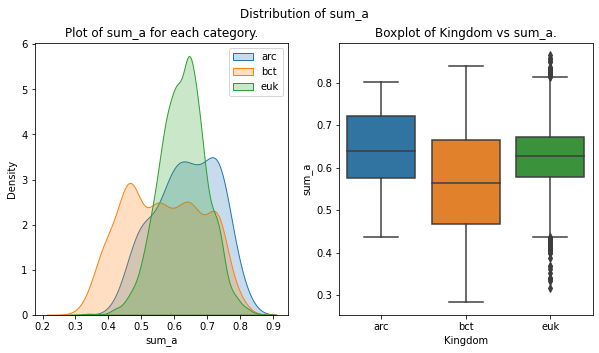

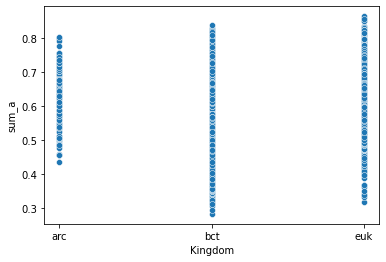

In [53]:
# add all feature having single A in codon name
with_a = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if 'A' in col and len(col)==3:
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    with_a.append(temp)

# add feature sum_a
data_kingdom['sum_a'] = with_a

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'sum_a', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'sum_a')
plt.show()



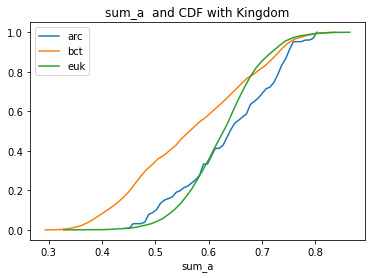

In [54]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_a'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_a'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_a'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('sum_a')
plt.title('sum_a  and CDF with Kingdom')
plt.show()

**7 Generating feature sum_c**

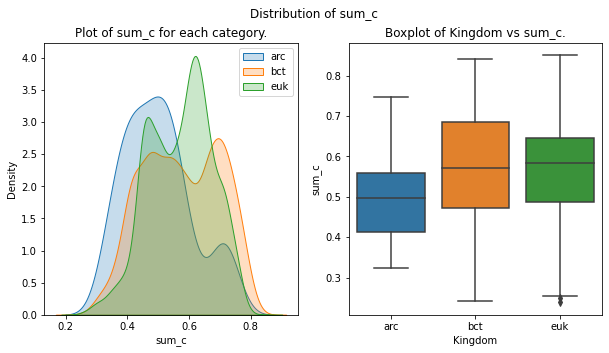

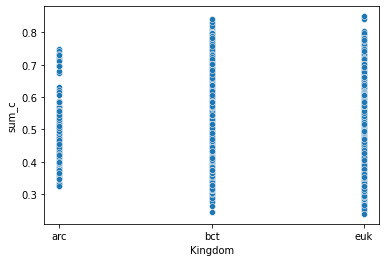

In [55]:
# add all features having C in codon name
with_c = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if 'C' in col and len(col)==3:
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    with_c.append(temp)

# Add a feature sum_c
data_kingdom['sum_c'] = with_c

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'sum_c', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'sum_c')
plt.show()



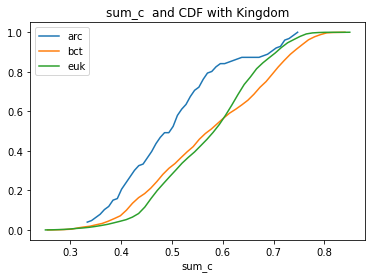

In [56]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_c'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_c'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_c'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('sum_c')
plt.title('sum_c  and CDF with Kingdom')
plt.show()

**8 Generating feature sum_u**

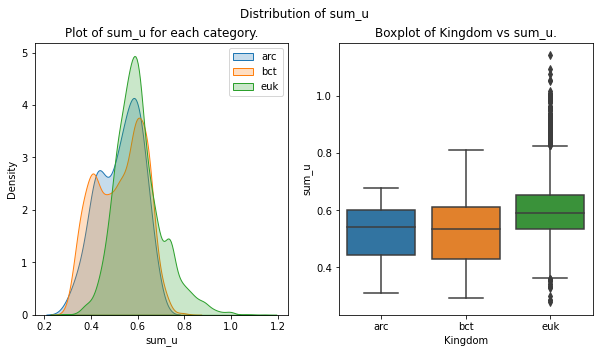

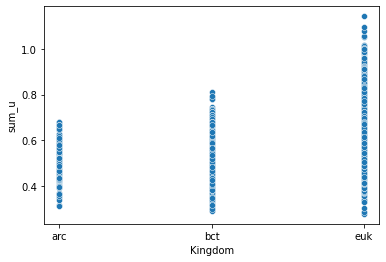

In [57]:
# add all features having C in codon name
with_u = []
for i in range(len(data_kingdom_copy)):
    temp = 0
    for col in data_kingdom_copy.columns:
        if 'U' in col and len(col)==3:
            try: 
                temp = temp + data_kingdom_copy.iloc[i][col]
            except:
                print(data_kingdom_copy.iloc[i][col])
    with_u.append(temp)

# Add a feature sum_u
data_kingdom['sum_u'] = with_u

# plot kde and boxplot
plot_kde_and_box(data_kingdom, 'sum_u', 'Kingdom')

# plot scatter plot
sns.scatterplot(data = data_kingdom, x = 'Kingdom', y = 'sum_u')
plt.show()



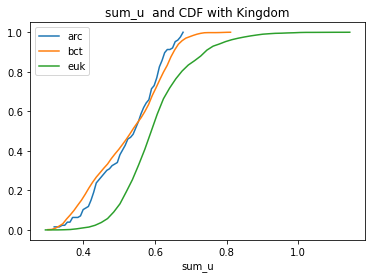

In [58]:
# seperate all classes into 3 classes
df_0 = data_kingdom[data_kingdom['Kingdom']=='arc']
df_1 = data_kingdom[data_kingdom['Kingdom']=='bct']
df_2 = data_kingdom[data_kingdom['Kingdom']=='euk']

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_u'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_u'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_u'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of sum_u
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['arc', 'bct', 'euk'])
plt.xlabel('sum_u')
plt.title('sum_u  and CDF with Kingdom')
plt.show()

* The feature generated based on the occurances of nucleobases seems to be more useful as by seeing the univariate analysis ( i.e boxplot , scatter plot) than that of stats based features.


#### 1.1.2 Bi-variate analysis

Let's perform bivariate analysis on each of the occurance based features to see how well two features along with each other can differntiate the differnt kingdom classes

C:\Users\HPvns\anaconda3\lib\site-packages\seaborn\distributions.py:1182: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


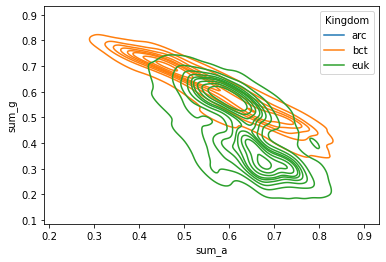

In [59]:
sns.kdeplot('sum_a', 'sum_g', hue = 'Kingdom',  data = data_kingdom, alpha  = 1)
plt.show()

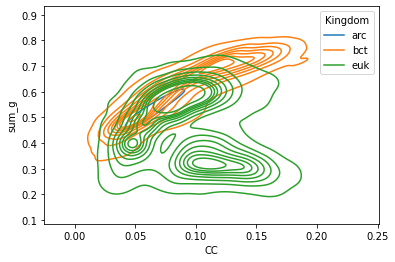

In [60]:
sns.kdeplot('CC', 'sum_g', hue = 'Kingdom',  data = data_kingdom, alpha  = 1)
plt.show()

C:\Users\HPvns\anaconda3\lib\site-packages\seaborn\distributions.py:1182: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


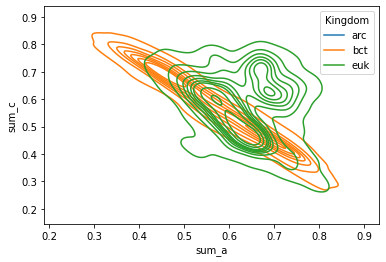

In [61]:
sns.kdeplot('sum_a', 'sum_c', hue = 'Kingdom',  data = data_kingdom, alpha  = 1)
plt.show()

C:\Users\HPvns\anaconda3\lib\site-packages\seaborn\distributions.py:1182: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


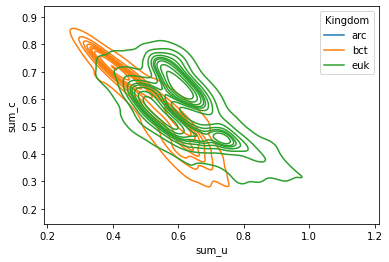

In [62]:
sns.kdeplot('sum_u', 'sum_c', hue = 'Kingdom',  data = data_kingdom, alpha  = 1)
plt.show()

Conclusion :    
* The plot between (sum_a, sum_b), (CC, 'sum_g), (sum_a , sum_c) seems to seperating data points of class euk from bct.
* There is no plot of the class arc on each of the plot. This is basically beacuse there are too less data points in arc class.

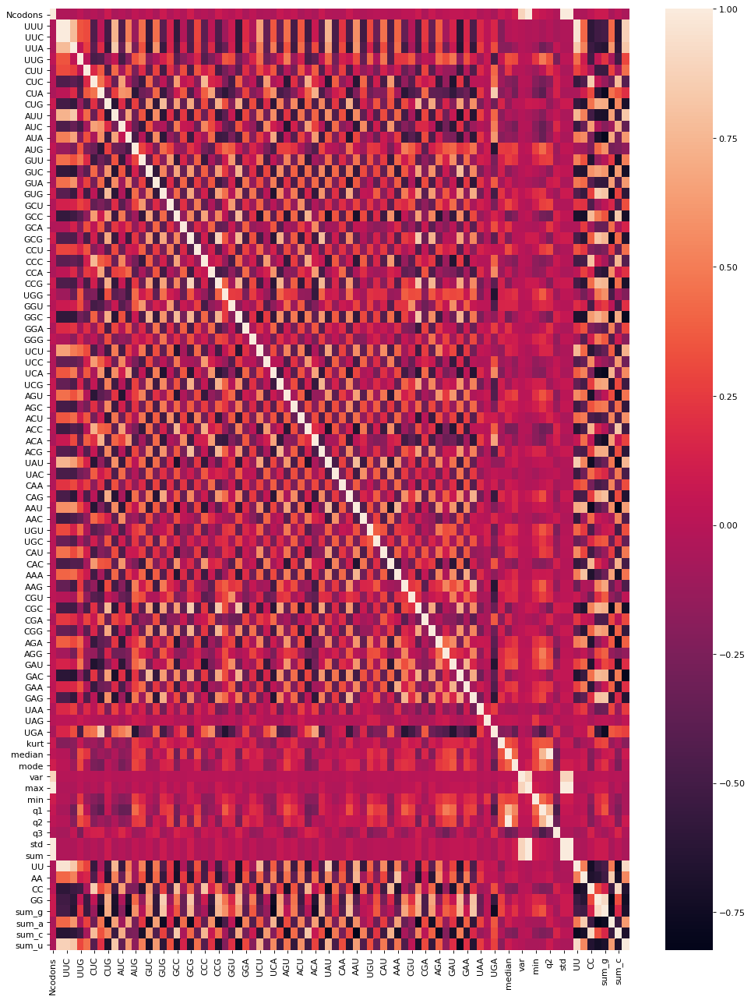

In [63]:
# plot heatmap of al features at once
from matplotlib.pyplot import figure
figure(figsize=(15, 20), dpi=80)
codons_corr = data_kingdom.corr( method='pearson')
sns.heatmap(codons_corr)
plt.show()

**In the correlation plot the values are not shown bzz it becomes to mesh after annonating plot.**

* Since we have actual occurance of probability not the rank so we areusing person plot.
* In pearson plot its very clear that var, min , max are fully corelated. So i will be dropping min and max features.



#### 1.1.3 Visualization

In [64]:
Y = data_kingdom['Kingdom']
X = data_kingdom.drop(['Kingdom'], axis = 1)

A) Principal Component Analysis

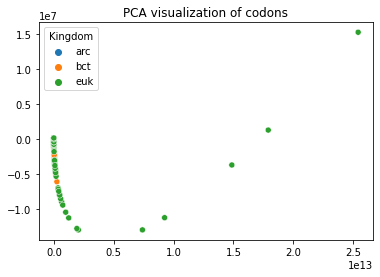

In [65]:

pca = PCA(n_components = 2)
X_pca = pca.fit_transform(X)
sns.scatterplot(x = X_pca[:, 0], y = X_pca[:, 1], hue=Y)
plt.title('PCA visualization of codons')
plt.show()

* PCA is not able to cluster the datapoints very well.

B) TSNE

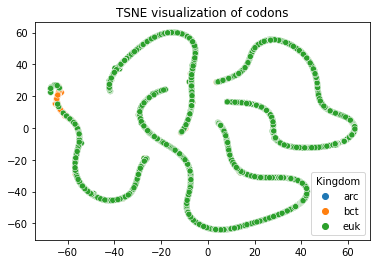

In [66]:
tsne = TSNE(n_components=2, perplexity=90)
X_tsne = tsne.fit_transform(X)
sns.scatterplot(x = X_tsne[:, 0], y = X_tsne[:, 1], hue=Y)
plt.title('TSNE visualization of codons')
plt.show()

* When we apply TSNE, it is able to cluster the data points on the basic of classes well.

### 1.2 Train-Test Split

Shape of training data (8156, 84)
Shape of test data (2039, 84)


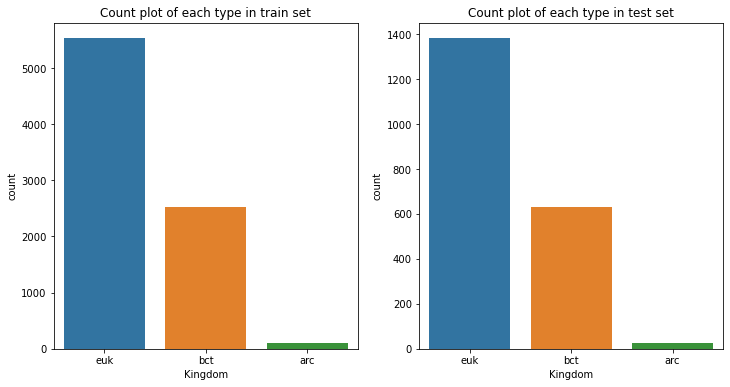

In [67]:
x_train_k, x_test_k, y_train_k, y_test_k = train_test_split(X, Y, train_size = 0.8, stratify = Y, random_state = 40)

print('Shape of training data', x_train_k.shape)
print('Shape of test data', x_test_k.shape)

fig = plt.figure(figsize=(12, 6))

plt.subplot(121)
sns.countplot(x = y_train_k, order=['euk', 'bct', 'arc'])
plt.title('Count plot of each type in train set')
# plt.show()

plt.subplot(122)
sns.countplot(x = y_test_k, order = ['euk', 'bct', 'arc'])
plt.title('Count plot of each type in test set' )
plt.show()

**A) SMOTE**

Shape of training data (16590, 84)
Shape of test data (2039, 84)


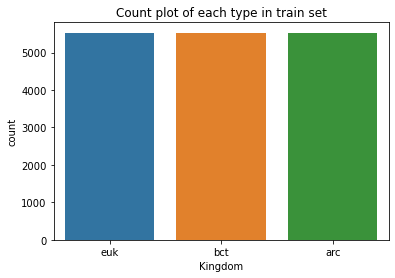

In [68]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
x_train_smt_k, y_train_smt_k = smt.fit_resample(x_train_k, y_train_k)
x_train_smt_k = pd.DataFrame(x_train_smt_k, columns = x_train_k.columns)

print('Shape of training data', x_train_smt_k.shape)
print('Shape of test data', x_test_k.shape)

sns.countplot(x = y_train_smt_k, order=['euk', 'bct' ,'arc'])
plt.title('Count plot of each type in train set')
plt.show()


**B) ADASYN**

Shape of training data (16497, 84)
Shape of test data (2039, 84)


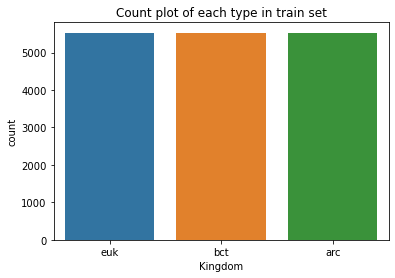

In [69]:
from imblearn.over_sampling import ADASYN 
ada = ADASYN(random_state=42)
x_train_ada_k, y_train_ada_k = ada.fit_resample(x_train_k, y_train_k)
x_train_ada_k = pd.DataFrame(x_train_ada_k, columns = x_train_k.columns)

print('Shape of training data', x_train_ada_k.shape)
print('Shape of test data', x_test_k.shape)

sns.countplot(x = y_train_smt_k, order=['euk', 'bct' ,'arc'])
plt.title('Count plot of each type in train set')
plt.show()


**Evaluation matrix Selection:** 

 Since out data has huge Imbalance 
 * So I discarded accuracy as evaluation matrix.
 * I selected AUC roc curve and  F1-score as evaluation matrics.
    * Macro F1 score was selected as we want to give equal preference to all the datapoints. 
    * Selecting F1 score help use in to give equal imporatnce to precision and recall. And it will try to criticise both equally.

#### 1.3 **Data Preprocessing**

* **Standarize data**

In [70]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Fitting smote fitted data on StandardScaler
ss_smt = StandardScaler()
x_train_smt_k_ss = ss_smt.fit_transform(x_train_smt_k)
x_train_smt_k_ss = pd.DataFrame(x_train_smt_k_ss, columns = x_train_smt_k.columns)
x_test_k_smt_ss = ss_smt.transform(x_test_k)
x_test_k_smt_ss = pd.DataFrame(x_test_k_smt_ss, columns=x_test_k.columns)

# Fitting ADASYN fitted data on StandardScaler
ss_ada = StandardScaler()
x_train_ada_k_ss = ss_ada.fit_transform(x_train_ada_k, y_train_k)
x_train_ada_k_ss = pd.DataFrame(x_train_ada_k_ss, columns=x_train_ada_k.columns)
x_test_k_ada_ss = ss_ada.transform(x_test_k)
x_test_k_ada_ss = pd.DataFrame(x_test_k_ada_ss, columns=x_test_k.columns)


# Fitting smote fitted data on MinMaxScaler
mm_smt = MinMaxScaler()
x_train_smt_k_mm = mm_smt.fit_transform(x_train_smt_k)
x_train_smt_k_mm = pd.DataFrame(x_train_smt_k_mm, columns = x_train_smt_k.columns)
x_test_k_smt_mm = mm_smt.transform(x_test_k)
x_test_k_smt_mm = pd.DataFrame(x_test_k_smt_mm, columns=x_test_k.columns)

# Fitting ADASYN fitted data on MinMaxScaler
mm_ada = MinMaxScaler()
x_train_ada_k_mm = mm_ada.fit_transform(x_train_ada_k)
x_train_ada_k_mm = pd.DataFrame(x_train_ada_k_mm, columns=x_train_ada_k.columns)
x_test_k_ada_mm = mm_ada.transform(x_test_k)
x_test_k_ada_mm = pd.DataFrame(x_test_k_ada_mm, columns=x_test_k.columns)


In [71]:

testing_data_for_kingdom = x_test_k[['Ncodons', 'UUU', 'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG',
       'AUU', 'AUC', 'AUA', 'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC',
       'GCA', 'GCG', 'CCU', 'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA',
       'GGG', 'UCU', 'UCC', 'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA',
       'ACG', 'UAU', 'UAC', 'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU',
       'CAC', 'AAA', 'AAG', 'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU',
       'GAC', 'GAA', 'GAG', 'UAA', 'UAG', 'UGA']]

testing_data_for_kingdom.to_csv ('testing_data_for_kingdom.csv', index = None, header=True)
y_test_k.to_csv ('y_test_k.csv', index = None, header=True)

import pickle
with open('std_kingdom.pkl', 'wb') as f:
    pickle.dump(ss_smt, f) 

* **One hot encoding**

In [72]:
from sklearn.preprocessing import LabelEncoder

oe_smt = LabelEncoder()
y_train_smt_k_oe = oe_smt.fit_transform(np.array(y_train_smt_k))

oe_ada = LabelEncoder()
y_train_ada_k_oe = oe_ada.fit_transform(np.array(y_train_ada_k))

y_test_k_oe = oe_smt.transform(np.array(y_test_k))


Let's see now what kind of data we have now

* With Smote
    * Standarization
        * StandardScalar = ```(x_train_smt_k_ss, y_train_smt_k_oe)```;  ```(x_test_k_smt_ss, , y_test_k_oe)```
        * MinmaxScaler = ```(x_train_smt_k_mm, y_train_smt_k_oe)```,   ```(x_test_k_smt_mm, y_test_k_oe)```
    * Without Standardization = ```(x_train_smt_k, y_train_smt_k)```, ```(x_test_k, y_test_k)```


* With Adasyn
    * Standarization
        * StandarScaler  =```(x_train_ada_k_ss,  y_train_ada_k_oe)```, ```(x_test_k_ada_ss, y_test_k_oe)```
        * MinMaxScaler = ```(x_train_ada_k_mm, y_train_ada_k_oe)``` , ```(x_test_k_ada_mm, y_test_k_oe)```
    * Without Standardization = ```(x_train_ada_k, y_train_ada_k)```, ```(x_test_k, y_test_k)```

## Saving the data 

In [73]:
DIR_K = 'Kingdom/'

import os
if not os.path.isdir(DIR_K):
    os.mkdir(DIR_K)
    
if not os.path.isdir('Kingdom/Smote'):
    os.mkdir('Kingdom/Smote')
    
if not os.path.isdir('Kingdom/Smote/with_std'):
    os.mkdir('Kingdom/Smote/with_std')
    
if not os.path.isdir('Kingdom/Smote/without_std'):
    os.mkdir('Kingdom/Smote/without_std')
    
if not os.path.isdir('Kingdom/Adasyn'):
    os.mkdir('Kingdom/Adasyn')
    
if not os.path.isdir('Kingdom/Adasyn/with_std'):
    os.mkdir('Kingdom/Adasyn/with_std')
    
if not os.path.isdir('Kingdom/Adasyn/without_std'):
    os.mkdir('Kingdom/Adasyn/without_std')
    
############################################## SMOTE ###############################################
    
#-------------------------------------------- standared scaler -------------------------------------
# train
x_train_smt_k_ss.to_csv ('Kingdom/Smote/with_std/x_train_smt_k_ss.csv', index = None, header=True)
np.save('Kingdom/Smote/with_std/y_train_smt_k_oe.npy', y_train_smt_k_oe)
# test
x_test_k_smt_ss.to_csv ('Kingdom/Smote/with_std/x_test_k_smt_ss.csv', index = None, header=True)
np.save('Kingdom/Smote/with_std/y_test_k_oe.npy', y_test_k_oe)

#-------------------------------------------- Minmax scaler ----------------------------------------
x_train_smt_k_mm.to_csv ('Kingdom/Smote/with_std/x_train_smt_k_mm.csv', index = None, header=True)
np.save('Kingdom/Smote/with_std/y_train_smt_k_oe.npy', y_train_smt_k_oe)

x_test_k_smt_mm.to_csv ('Kingdom/Smote/with_std/x_test_k_smt_mm.csv', index = None, header=True)
np.save('Kingdom/Smote/with_std/y_test_k_oe.npy', y_test_k_oe)


#--------------------------------------------- Without std -----------------------------------------
# train
x_train_smt_k.to_csv ('Kingdom/Smote/without_std/x_train_smt_k.csv', index = None, header=True)
np.save('Kingdom/Smote/without_std/y_train_smt_k.npy', y_train_smt_k)

x_test_k.to_csv ('Kingdom/Smote/without_std/x_test_k.csv', index = None, header=True)
np.save('Kingdom/Smote/without_std/y_test_k.npy', y_test_k)


############################################## ADASYN ###############################################
    
#-------------------------------------------- standared scaler -------------------------------------
# train
x_train_ada_k_ss.to_csv ('Kingdom/Adasyn/with_std/x_train_ada_k_ss.csv', index = None, header=True)
np.save('Kingdom/Adasyn/with_std/y_train_ada_k_oe.npy', y_train_ada_k_oe)
# test
x_test_k_ada_ss.to_csv ('Kingdom/Adasyn/with_std/x_test_k_ada_ss.csv', index = None, header=True)
np.save('Kingdom/Adasyn/with_std/y_test_k_oe.npy', y_test_k_oe)

#-------------------------------------------- Minmax scaler ----------------------------------------
x_train_ada_k_mm.to_csv ('Kingdom/Adasyn/with_std/x_train_ada_k_mm.csv', index = None, header=True)
np.save('Kingdom/Adasyn/with_std/y_train_ada_k_oe.npy', y_train_ada_k_oe)

x_test_k_ada_mm.to_csv ('Kingdom/Adasyn/with_std/x_test_k_ada_mm.csv', index = None, header=True)
np.save('Kingdom/Adasyn/with_std/y_test_k_oe.npy', y_test_k_oe)

#--------------------------------------------- Without std -----------------------------------------
# train
x_train_ada_k.to_csv ('Kingdom/Adasyn/without_std/x_train_ada_k.csv', index = None, header=True)
np.save('Kingdom/Adasyn/without_std/y_train_ada_k.npy', y_train_ada_k)

x_test_k.to_csv ('Kingdom/Adasyn/without_std/x_test_k.csv', index = None, header=True)
np.save('Kingdom/Adasyn/without_std/y_test_k.npy', y_test_k)


### 1.4  **Modelling**

Let's write a function to fit a model on our dataset having F1-score and AUC set as evaluation matrix and print classification report

In [74]:
def fit_print_report(clf_name, x_train, y_train, x_test, y_test, params, label_encoder, draw_plots=True, print_logs=True):

    '''A function to fit machine learninf model and print F1 and roc_auc score. 
    It also draw the classification reprot for both train and test set 
    Inputs:
        clf_name: sklearn classifier class which you want the data to be fitted
        x_train: predictor variable for training set
        y_train: target variable for training set
        x_test: predictor variable for test set
        y_test: target variable for test set
        params: hyper-parameters to pass into the model.
    Output: 
        Fitted classifier on the data (i.e post training classifier)
    '''
    #================================================Train the model=================================================
    # fit the RF classifier
    clf = clf_name(**params)
    clf.fit(x_train, y_train)

    if print_logs:
        print('#==============================Train Data Analysis================================')

    # predicting model on the train data and plot confusion matrix
    y_class_train = clf.predict(x_train)
    y_pred_train = clf.predict_proba(x_train)

    # calculate f1_score on train data
    f1_score_train = f1_score( y_train, y_class_train,  average='macro')
    if print_logs:
        print('f1-score on training data', f1_score_train)

    # calculate auc acore
    auc_train = roc_auc_score(y_train, y_pred_train, average='macro', multi_class = 'ovr')
    if print_logs:
        print('AUC score on training data', auc_train)
    if print_logs:
        print()


        print('#===============================Test Data Analysis==================================')

    # predicting model on the test data and plot confusion matrix
    y_class_test = clf.predict(x_test)
    y_pred_test = clf.predict_proba(x_test)

    # calculate f1_score on test data 
    f1_score_test = f1_score( y_test,y_class_test,  average='macro')
    if print_logs:
        print('f1-score matrix on training data', f1_score_test)

    # calculate auc acore
    auc_test = roc_auc_score(y_test, y_pred_test, average='macro', multi_class = 'ovr')
    if print_logs:
        print('AUC score on test data', auc_test)
        print()

    # plot confusion matrix
    if draw_plots:
        if label_encoder:
            cm_train = confusion_matrix(y_train, y_class_train)
            cm_test = confusion_matrix(y_test, y_class_test)
            cm_train = pd.DataFrame(cm_train, columns = label_encoder.classes_, index = label_encoder.classes_)
            cm_test = pd.DataFrame(cm_test, columns = label_encoder.classes_, index = label_encoder.classes_)
        else:
            cm_train = confusion_matrix(y_train, y_class_train, labels = ['arc', 'bct', 'euk'])
            cm_test = confusion_matrix(y_test, y_class_test, labels = ['arc', 'bct', 'euk'])
            cm_train = pd.DataFrame(cm_train, columns = ['arc', 'bct', 'euk'], index = ['arc', 'bct', 'euk'])
            cm_test = pd.DataFrame(cm_test, columns = ['arc', 'bct', 'euk'], index = ['arc', 'bct', 'euk'])
            

        fig = plt.figure(figsize=(12, 4))

        plt.subplot(121)
        sns.heatmap(cm_train, annot=True, cmap="YlGnBu", )
        plt.title('Confusion Matrix on train data')
        # plt.show()

        plt.subplot(122)
        sns.heatmap(cm_test, annot = True, cmap="YlGnBu")
        plt.title('Confusion Matrix on test data')
        plt.show()
        print()

    return clf, auc_test, f1_score_test


#### **1.4.1 Logistic Regression**


* **Logistic Regression on Standard Scaler fitted Data**

Let's see the result after fitting the logistic regression on StandardScaler fitted data on both Smote and Adasyn oversampled data

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9794778659191682
AUC score on training data 0.9985527513360736

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8950535753097603
AUC score on test data 0.992557348577539



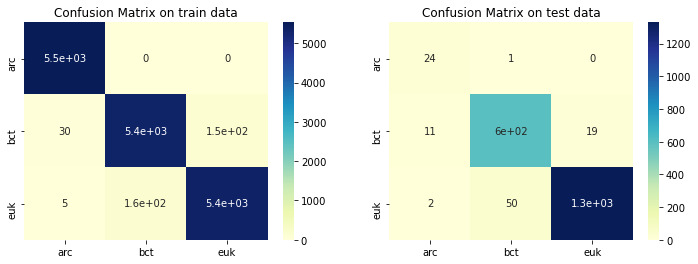


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9785681604725495
AUC score on training data 0.9984845201448781

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9037865546052516
AUC score on test data 0.9927716011001849



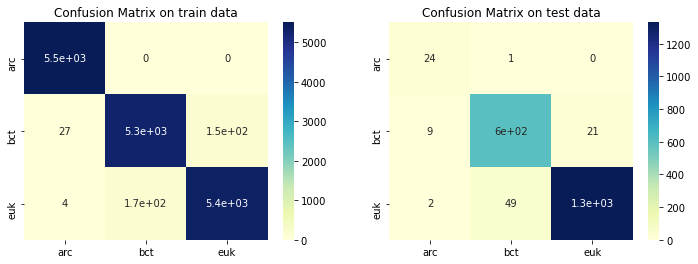

In [75]:

from sklearn.linear_model import LogisticRegression

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_ss_smt, f1_score_lr_ss_smt = fit_print_report(LogisticRegression, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt)


# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_ss_ada, f1_score_lr_ss_ada = fit_print_report(LogisticRegression, x_train_ada_k_ss, y_train_ada_k_oe, x_test_k_ada_ss, y_test_k_oe, params, oe_ada)

The top 15 most pos. important feature are:  ['AGG', 'GUC', 'UAU', 'CGG', 'kurt', 'AUA', 'AUU', 'UCA', 'GAG', 'UAC', 'AUC', 'GCA', 'GGC', 'min', 'q3']
The top 15 most pos. important feature are:  ['CGC', 'var', 'ACA', 'UCU', 'CAC', 'UUU', 'UUC', 'UCC', 'UCG', 'CAU', 'UAG', 'UGC', 'AAG', 'UGA', 'CUG']


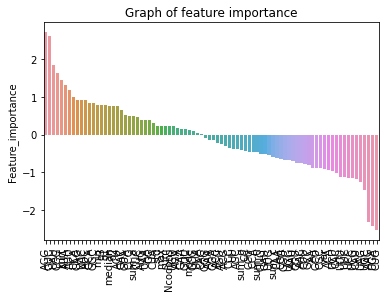

In [76]:
# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

* **Logistic Regression on MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9731773652245632
AUC score on training data 0.9970154246604906

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8433960148175593
AUC score on test data 0.9911272895747923



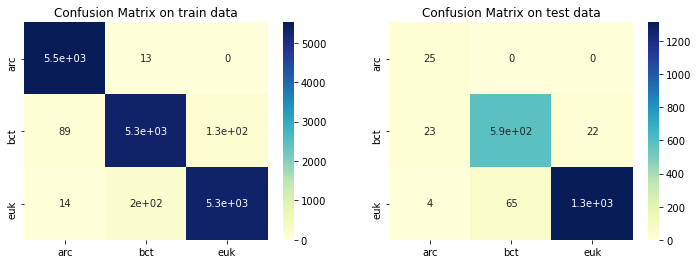


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9725717475466995
AUC score on training data 0.9969334837047644

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8464432082416801
AUC score on test data 0.9911919620838062



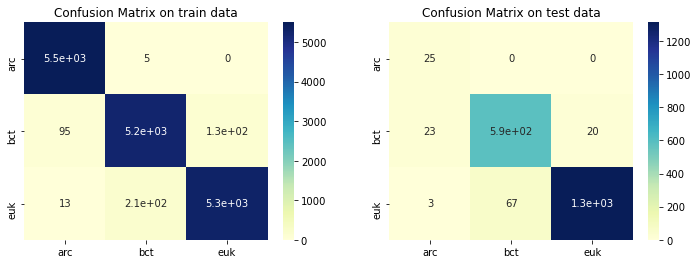

In [77]:

from sklearn.linear_model import LogisticRegression

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_mm_smt, f1_score_lr_mm_smt = fit_print_report(LogisticRegression, x_train_smt_k_mm, y_train_smt_k_oe, x_test_k_smt_mm, y_test_k_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_ada_k_mm, y_train_ada_k_oe , x_test_k_ada_mm, y_test_k_oe, params, oe_smt)

The top 15 most pos. important feature are:  ['GUC', 'AGG', 'UAU', 'AUA', 'GAC', 'kurt', 'CUC', 'GAG', 'UAC', 'GUA', 'GUU', 'GCA', 'AUU', 'sum_a', 'ACG']
The top 15 most pos. important feature are:  ['CCU', 'UGG', 'CAA', 'UUU', 'UUC', 'GCU', 'UGC', 'CGA', 'CGC', 'UUG', 'CAU', 'CUG', 'UCU', 'CGU', 'AAG']


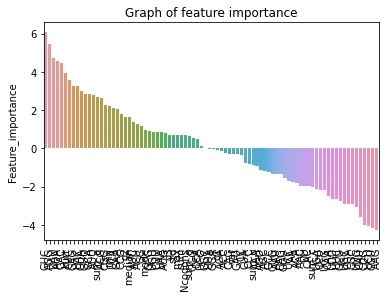

In [78]:
# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

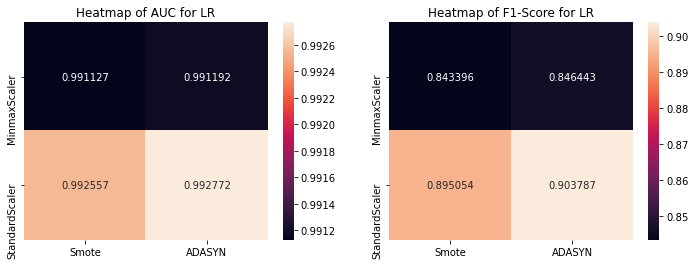

In [79]:
report_auc_lr = pd.DataFrame([[auc_lr_mm_smt, auc_lr_mm_ada],
             [auc_lr_ss_smt, auc_lr_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_lr = pd.DataFrame([[f1_score_lr_mm_smt, f1_score_lr_mm_ada],
             [f1_score_lr_ss_smt, f1_score_lr_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_lr, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for LR')

plt.subplot(122)
sns.heatmap(report_f1_score_lr, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for LR' )
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:51<00:00, 12.43s/it]


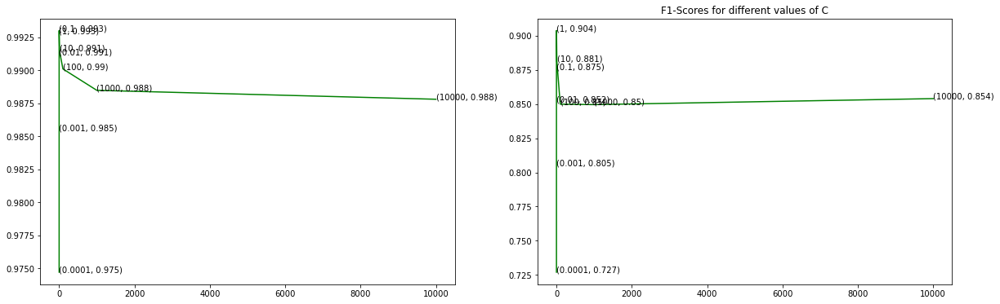

In [80]:
val_c = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]

auc_scores = []
f1_scores = []


for c in tqdm.tqdm(val_c):
    params = dict(C = c, max_iter = 100000)
    _, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_ada_k_ss, y_train_ada_k_oe , x_test_k_ada_ss, y_test_k_oe, params, oe_ada, False, False)
    auc_scores.append(auc_lr_mm_ada)
    f1_scores.append(f1_score_lr_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_c, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_c[i],np.round(txt,3)), (val_c[i],auc_scores[i]))
plt.title('Auc Score for different values of C')

sns.lineplot(x= val_c, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_c[i],np.round(txt,3)), (val_c[i],f1_scores[i]))
plt.title('F1-Scores for different values of C')

plt.show()

#==============================Train Data Analysis================================
f1-score on training data 0.9785681604725495
AUC score on training data 0.9984845201448781

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9037865546052516
AUC score on test data 0.9927716011001849



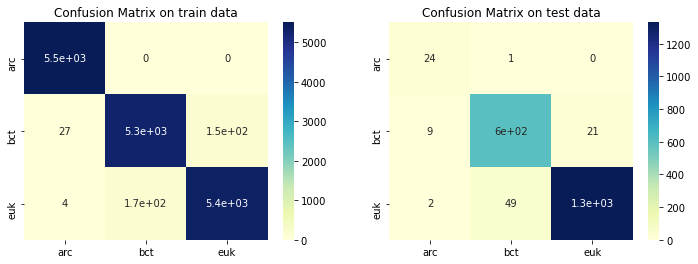


The top 15 most pos. important feature are:  ['AGG', 'GUC', 'UAU', 'CGG', 'kurt', 'AUA', 'AUU', 'UCA', 'GAG', 'UAC', 'AUC', 'GCA', 'GGC', 'min', 'q3']
The top 15 most pos. important feature are:  ['CGC', 'var', 'ACA', 'UCU', 'CAC', 'UUU', 'UUC', 'UCC', 'UCG', 'CAU', 'UAG', 'UGC', 'AAG', 'UGA', 'CUG']


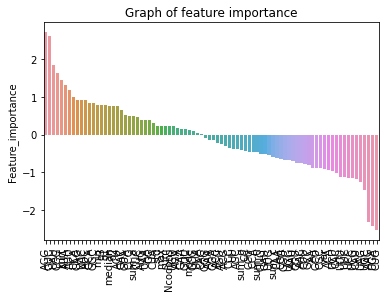

In [81]:
# fitting logistic regression on standardscaler+ADASYN dataset
params = dict(max_iter = 1000)
clf, auc_lr_ss_ada, f1_score_lr_ss_ada = fit_print_report(LogisticRegression, x_train_ada_k_ss, y_train_ada_k_oe, x_test_k_ada_ss, y_test_k_oe, params, oe_ada)

# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.2 Naive Bayes**


Fitting the Naive Bayes model and printing the classification report

* **Naive Bayes on Standard Scaler fitted Data**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.7913597432072401
AUC score on training data 0.9353645548910158

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.5456590561722422
AUC score on test data 0.895485804278056



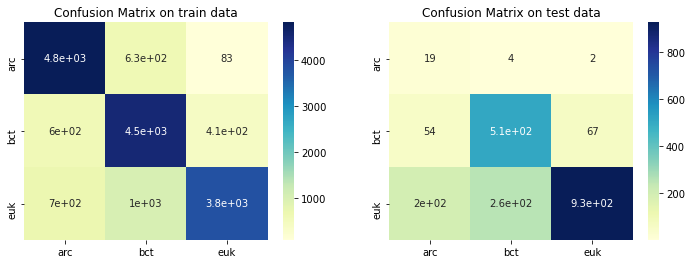


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.7885285206030715
AUC score on training data 0.9317131689079602

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.5419556277650458
AUC score on test data 0.8885109464986387



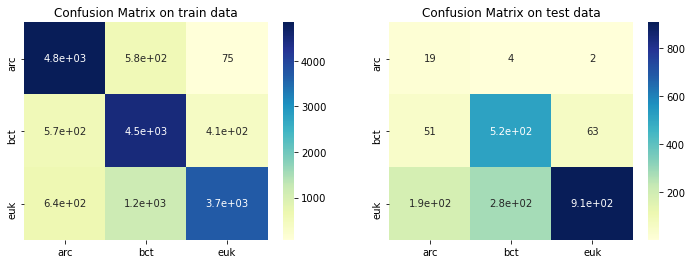

In [82]:

from sklearn.naive_bayes import GaussianNB

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_ss_smt, f1_score_nb_ss_smt = fit_print_report(GaussianNB, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt)



# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_ss_ada, f1_score_nb_ss_ada = fit_print_report(GaussianNB, x_train_ada_k_ss, y_train_ada_k_oe, x_test_k_ada_ss, y_test_k_oe, params, oe_ada)

* **Naive Bayes on MinMax Scaler fitted Data**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.7914739139512325
AUC score on training data 0.9354053483274418

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.5456590561722422
AUC score on test data 0.8955034625449989



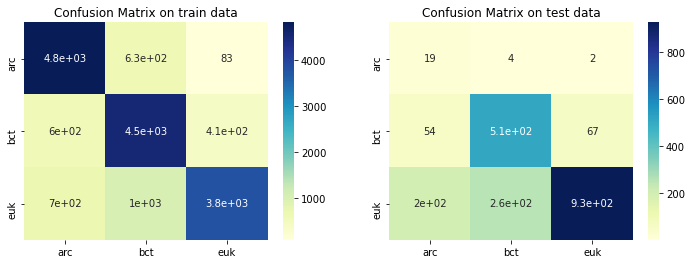


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.7885285206030715
AUC score on training data 0.9317665588629813

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.5419556277650458
AUC score on test data 0.8885608746118319



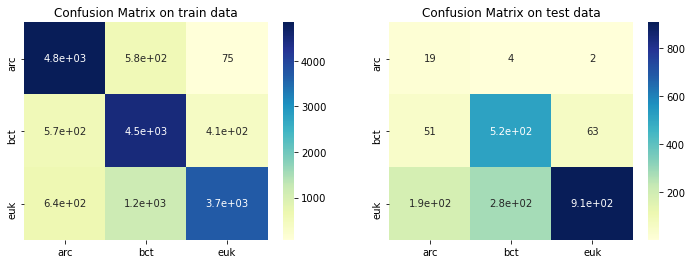

In [83]:

from sklearn.naive_bayes import GaussianNB

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_mm_smt, auc_nb_mm_smt, f1_score_nb_mm_smt = fit_print_report(GaussianNB, x_train_smt_k_mm, y_train_smt_k_oe, x_test_k_smt_mm, y_test_k_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_mm_ada, f1_score_nb_mm_ada = fit_print_report(GaussianNB, x_train_ada_k_mm, y_train_ada_k_oe , x_test_k_ada_mm, y_test_k_oe, params, oe_smt)

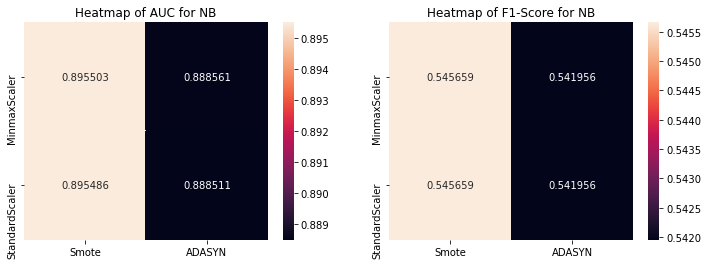

In [84]:
report_auc_nb = pd.DataFrame([[auc_nb_mm_smt, auc_nb_mm_ada],
             [auc_nb_ss_smt, auc_nb_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_nb = pd.DataFrame([[f1_score_nb_mm_smt, f1_score_nb_mm_ada],
             [f1_score_nb_ss_smt, f1_score_nb_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_nb, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for NB')

plt.subplot(122)
sns.heatmap(report_f1_score_nb, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for NB' )
plt.show()

The top 15 most pos. important feature are:  ['UGC', 'AGG', 'UGU', 'CGU', 'AAA', 'UAC', 'CAA', 'GCG', 'AAG', 'CAU', 'CGG', 'GAA', 'CGA', 'UUG', 'ACG']
The top 15 most pos. important feature are:  ['GUU', 'AGA', 'CUA', 'UUA', 'CUG', 'CAG', 'GUG', 'AUC', 'ACC', 'AUU', 'ACA', 'UUC', 'UUU', 'kurt', 'sum_g']


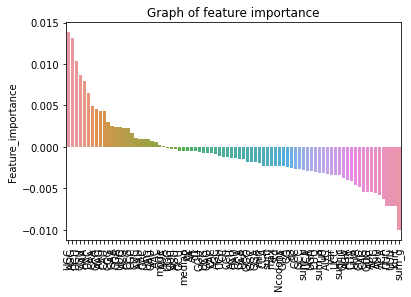

In [85]:
# get feature importances

from sklearn.inspection import permutation_importance

imps = permutation_importance(clf_mm_smt, x_test_k_smt_mm, y_test_k_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_train_smt_k_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.3 Support Vector Classifier**


Fitting the SVC model and printing the classification report

* **SVC model on StandardScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9967442380589192
AUC score on training data 0.9998826228135863

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9515427966302387
AUC score on test data 0.9972016698038847



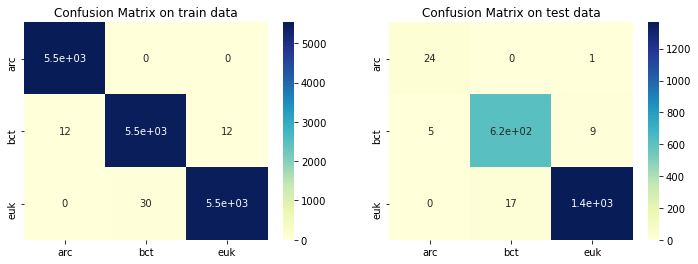


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9967840696274525
AUC score on training data 0.9999164748702961

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9383043895112241
AUC score on test data 0.9972421422880785



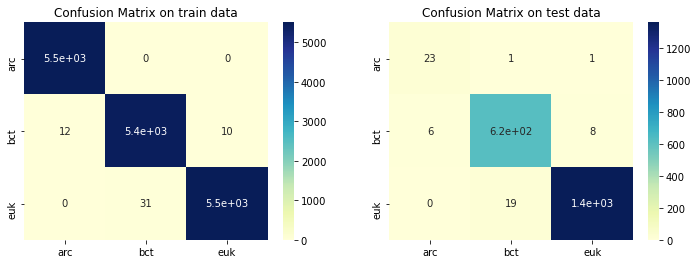

In [86]:

from sklearn.svm import SVC

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_ss_smt, f1_score_svc_ss_smt = fit_print_report(SVC, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt)

# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability = True)
clf, auc_svc_ss_ada, f1_score_svc_ss_ada = fit_print_report(SVC, x_train_ada_k_ss, y_train_ada_k_oe, x_test_k_ada_ss, y_test_k_oe, params, oe_ada)

* **SVC model with MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9876860385145697
AUC score on training data 0.9992408060804839

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9220349154184059
AUC score on test data 0.9958885652537793



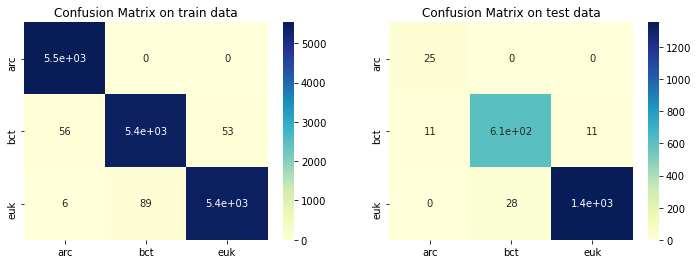


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9876060232338165
AUC score on training data 0.9993583206344866

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9253448508583532
AUC score on test data 0.9960515913255853



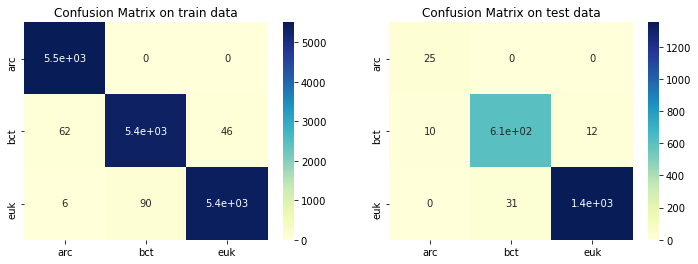

In [87]:

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_mm_smt, f1_score_svc_mm_smt = fit_print_report(SVC, x_train_smt_k_mm, y_train_smt_k_oe, x_test_k_smt_mm, y_test_k_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(SVC, x_train_ada_k_mm, y_train_ada_k_oe , x_test_k_ada_mm, y_test_k_oe, params, oe_smt)

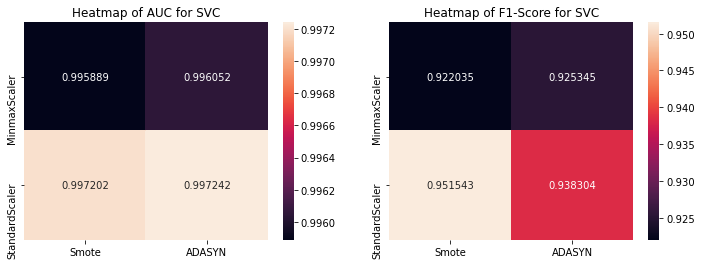

In [88]:
report_auc_svc = pd.DataFrame([[auc_svc_mm_smt, auc_svc_mm_ada],
             [auc_svc_ss_smt, auc_svc_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_svc = pd.DataFrame([[f1_score_svc_mm_smt, f1_score_svc_mm_ada],
             [f1_score_svc_ss_smt, f1_score_svc_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_svc, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for SVC')

plt.subplot(122)
sns.heatmap(report_f1_score_svc, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for SVC' )
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [15:11<00:00, 101.32s/it]


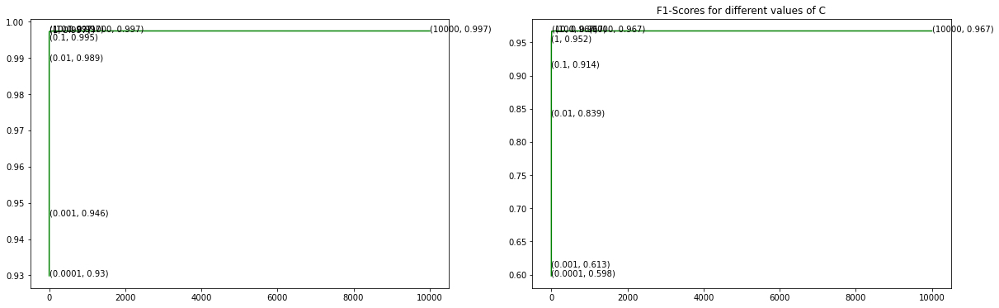

In [89]:
val_c = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]

auc_scores = []
f1_scores = []

for c in tqdm.tqdm(val_c):
    params = dict(C = c, probability=True)
    _, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(SVC, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt, False, False)
    auc_scores.append(auc_lr_mm_ada)
    f1_scores.append(f1_score_lr_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_c, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_c[i],np.round(txt,3)), (val_c[i],auc_scores[i]))
plt.title('Auc Score for different values of C')

sns.lineplot(x= val_c, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_c[i],np.round(txt,3)), (val_c[i],f1_scores[i]))
plt.title('F1-Scores for different values of C')
plt.show()

* **Fitting the best model**

#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9672935478099234
AUC score on test data 0.9974333167593681



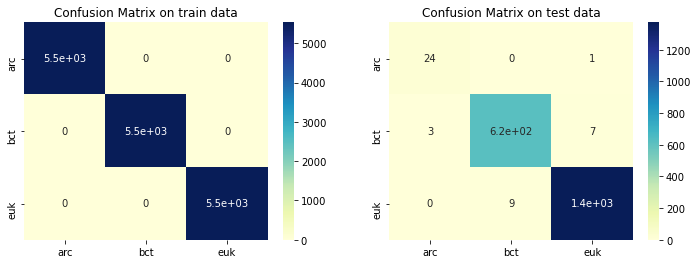

In [90]:
 params = dict(C = 1000, probability=True)
clf_base, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(SVC, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt, True, True)

The top 15 most pos. important feature are:  ['CGA', 'AAG', 'CGC', 'UGU', 'UGC', 'AUC', 'GAU', 'UAU', 'UUA', 'CCA', 'CUC', 'AGA', 'GGG', 'GCG', 'GAA']
The top 15 most pos. important feature are:  ['CUA', 'sum_a', 'CCG', 'sum_c', 'sum', 'Ncodons', 'std', 'max', 'sum_u', 'min', 'var', 'q2', 'median', 'CAC', 'CC']


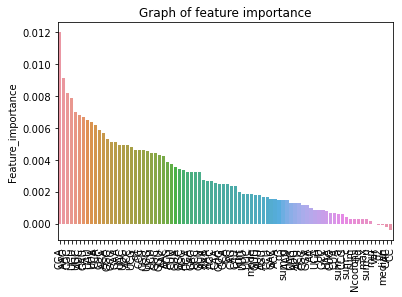

In [91]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(clf_base,x_test_k_smt_ss, y_test_k_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_test_k_smt_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

In [92]:
good_features = FI[FI['Feature_importance']>0].index

#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9618426158427921
AUC score on test data 0.9975023050497027



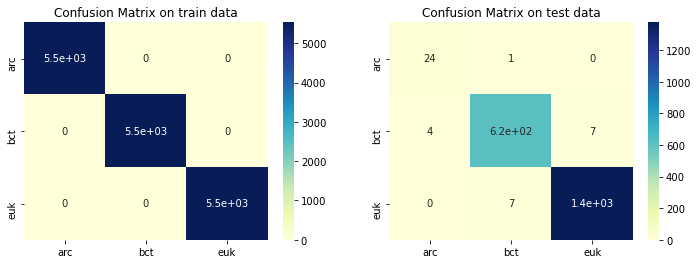

In [93]:

 params = dict(C = 1000, probability=True)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(SVC, x_train_smt_k_ss[good_features], y_train_smt_k_oe, x_test_k_smt_ss[good_features], y_test_k_oe, params, oe_smt, True, True)


In [94]:
import pickle
with open('clf_kingdom_svm.pkl', 'wb') as f:
    pickle.dump(clf_base, f)
    
with open('class_encoding_kingdom.pkl', 'wb') as f:
    pickle.dump(oe_smt, f)
    
    
with open('std_kingdom.pkl', 'wb') as f:
    pickle.dump(ss_smt, f) 
    
    
with open('col_seq_kingdom.pkl', 'wb') as f:
    pickle.dump(x_train_ada_k_ss.columns, f)
    
with open('good_features_kingdom.pkl', 'wb') as f:
    pickle.dump(good_features, f)



#### **1.4.4 K nearest Neighbour Classifier**


Fitting the KNN classifier model and printing the classification report

* **KNN classifier on StandardScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9916747964513165
AUC score on training data 0.9999141675577458

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8816671990039463
AUC score on test data 0.991657081352138



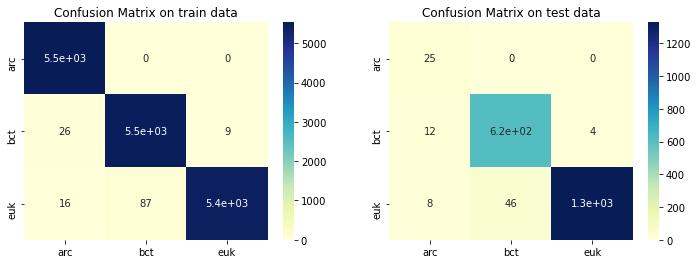


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9912612156179431
AUC score on training data 0.9999141454330499

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8857769600062714
AUC score on test data 0.9917157852087696



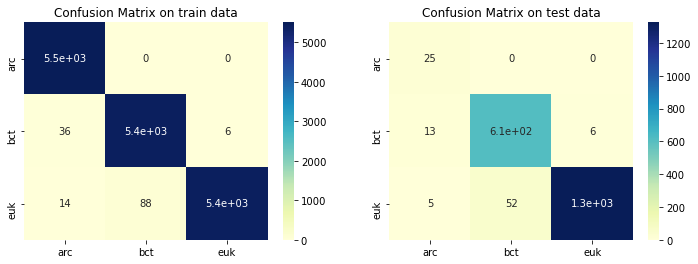

In [95]:
from sklearn.neighbors import KNeighborsClassifier

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_ss_smt, f1_score_knn_ss_smt = fit_print_report(KNeighborsClassifier, x_train_smt_k_ss, y_train_smt_k_oe, x_test_k_smt_ss, y_test_k_oe, params, oe_smt)

# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_ss_ada, f1_score_knn_ss_ada = fit_print_report(KNeighborsClassifier, x_train_ada_k_ss, y_train_ada_k_oe, x_test_k_ada_ss, y_test_k_oe, params, oe_ada)

* **KNN classifier on MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9896229835482121
AUC score on training data 0.9998836201681441

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8476956287458113
AUC score on test data 0.9844651694615658



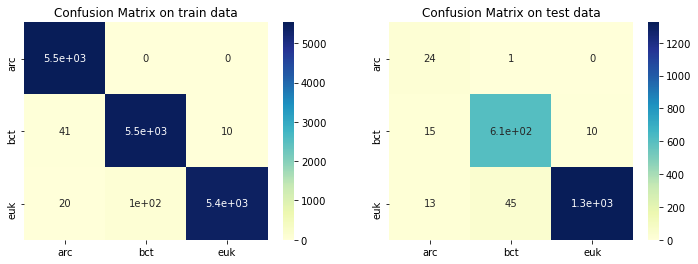


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9888925684598133
AUC score on training data 0.999875527756997

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8539594545796757
AUC score on test data 0.9913049740057467



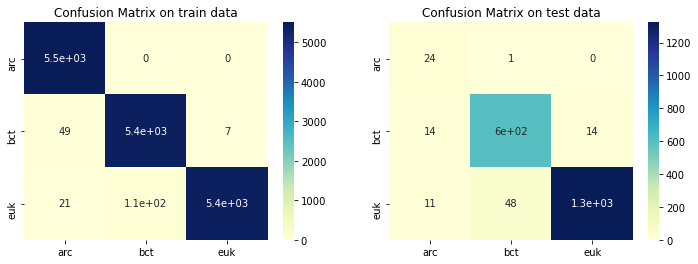

In [96]:

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_mm_smt, f1_score_knn_mm_smt = fit_print_report(KNeighborsClassifier, x_train_smt_k_mm, y_train_smt_k_oe, x_test_k_smt_mm, y_test_k_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNeighborsClassifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_mm_ada, f1_score_knn_mm_ada = fit_print_report(KNeighborsClassifier, x_train_ada_k_mm, y_train_ada_k_oe , x_test_k_ada_mm, y_test_k_oe, params, oe_smt)

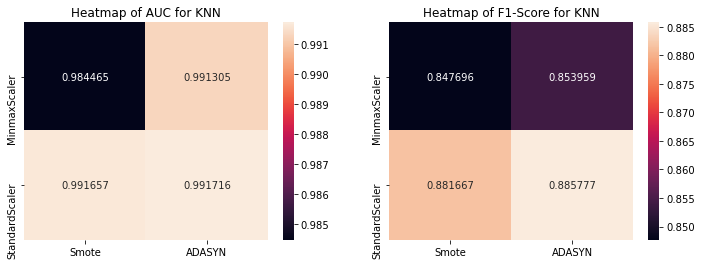

In [97]:
report_auc_knn = pd.DataFrame([[auc_knn_mm_smt, auc_knn_mm_ada],
             [auc_knn_ss_smt, auc_knn_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_knn = pd.DataFrame([[f1_score_knn_mm_smt, f1_score_knn_mm_ada],
             [f1_score_knn_ss_smt, f1_score_knn_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_knn, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for KNN')

plt.subplot(122)
sns.heatmap(report_f1_score_knn, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for KNN' )
plt.show()

**Hyper Parameter tuning**

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [01:20<00:00, 11.54s/it]


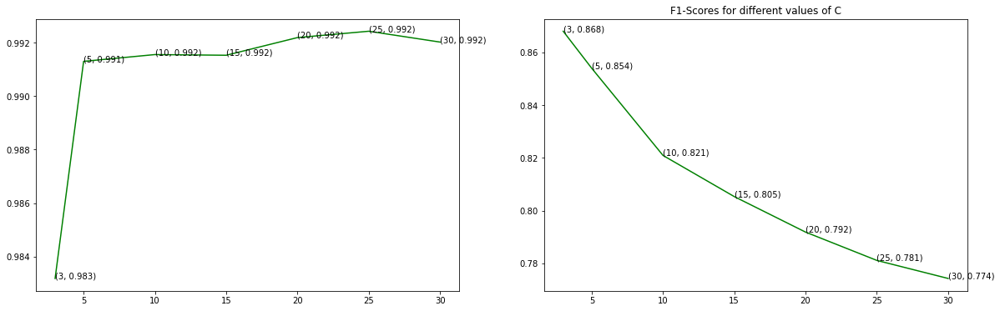

In [98]:
val_c = [3,5,10,15,20,25,30]

auc_scores = []
f1_scores = []

for c in tqdm.tqdm(val_c):
    params = dict(n_neighbors = c)
    _, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(KNeighborsClassifier,  x_train_ada_k_mm, y_train_ada_k_oe , x_test_k_ada_mm, y_test_k_oe, params, oe_smt, False, False)
    auc_scores.append(auc_lr_mm_ada)
    f1_scores.append(f1_score_lr_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_c, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_c[i],np.round(txt,3)), (val_c[i],auc_scores[i]))
plt.title('Auc Score for different values of C')

sns.lineplot(x= val_c, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_c[i],np.round(txt,3)), (val_c[i],f1_scores[i]))
plt.title('F1-Scores for different values of C')
plt.show()

The top 15 most pos. important feature are:  ['q1', 'AAG', 'GUA', 'CGC', 'UUA', 'AUC', 'UAU', 'UUG', 'UGC', 'GUG', 'UGG', 'CUG', 'CAU', 'AGA', 'AUA']
The top 15 most pos. important feature are:  ['UCC', 'GCC', 'kurt', 'AAA', 'AA', 'AGG', 'min', 'GGA', 'GCU', 'AAC', 'GUC', 'CGU', 'GUU', 'sum_c', 'mode']


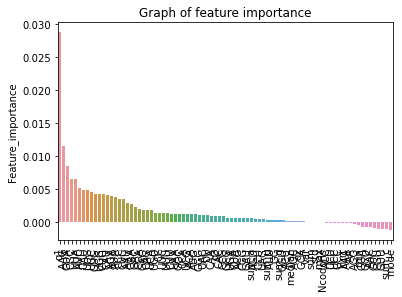

In [99]:
from sklearn.inspection import permutation_importance

imps = permutation_importance(clf, x_test_k_ada_mm, y_test_k_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_test_k_ada_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.5 Random Forest Classifier**


Fitting the Random Forest classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9162689248094705
AUC score on test data 0.9968499469648887



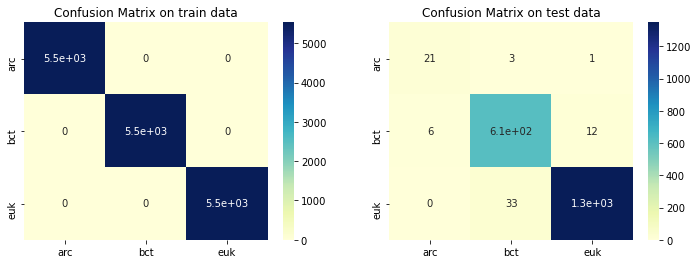


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9022906713876905
AUC score on test data 0.9969360903511646



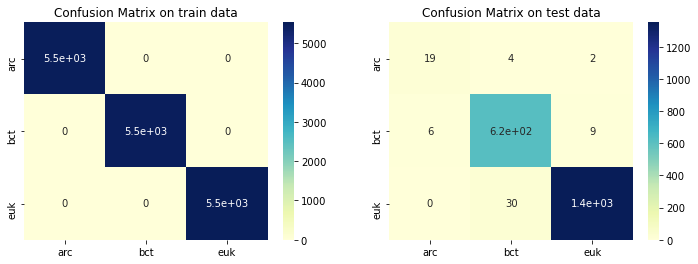

In [100]:
# fitting random forest model and print report

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_rf_smt, f1_score_rf_smt = fit_print_report(RandomForestClassifier, x_train_smt_k, y_train_smt_k, x_test_k, y_test_k, params , None)

# fitting random forest model and print report
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_rf_ada, f1_score_rf_ada = fit_print_report(RandomForestClassifier, x_train_ada_k, y_train_ada_k, x_test_k, y_test_k, params, None)

The top 15 most pos. important feature are:  ['AGG', 'AUA', 'CGU', 'CGA', 'sum_g', 'UGA', 'CGC', 'GCG', 'AAG', 'UGC', 'UGU', 'CUG', 'UCC', 'GAG', 'ACG']


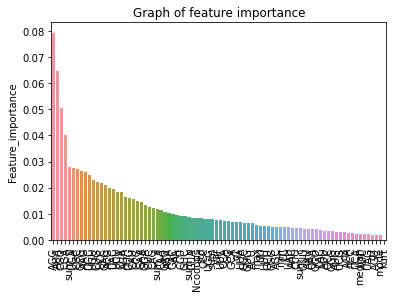

In [101]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.6 Xgboost Classifier**


Fitting the Xgboost classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGboost on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:49:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9494080924020706
AUC score on test data 0.9974558028853262



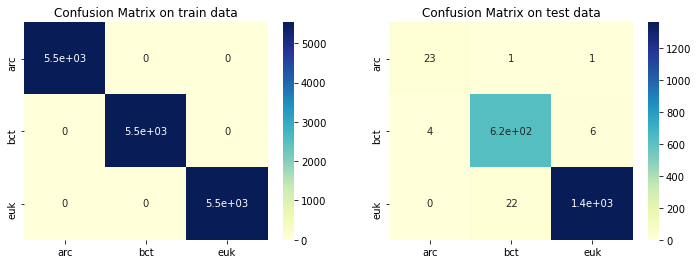


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGBoost on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:49:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.941111686605233
AUC score on test data 0.997326212349079



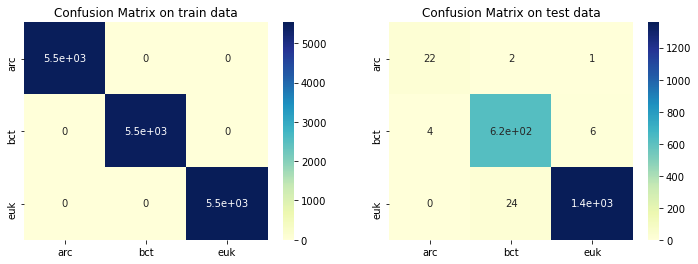

In [102]:

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGboost on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_xgb, auc_xgb_smt, f1_score_xgb_smt = fit_print_report(xgboost.XGBClassifier, x_train_smt_k, y_train_smt_k, x_test_k, y_test_k, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGBoost on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_xgb, auc_xgb_ada, f1_score_xgb_ada = fit_print_report(xgboost.XGBClassifier, x_train_ada_k, y_train_ada_k, x_test_k, y_test_k, params, None)


The top 15 most pos. important feature are:  ['AGG', 'AUA', 'CGU', 'CGA', 'sum_g', 'UGA', 'CGC', 'GCG', 'AAG', 'UGC', 'UGU', 'CUG', 'UCC', 'GAG', 'ACG']


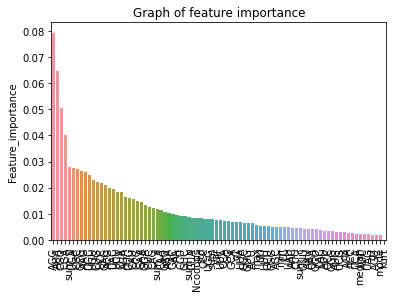

In [103]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.7 LightGBM Classifier**


Fitting the LightGBM classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9362109155761903
AUC score on test data 0.9972631502101753



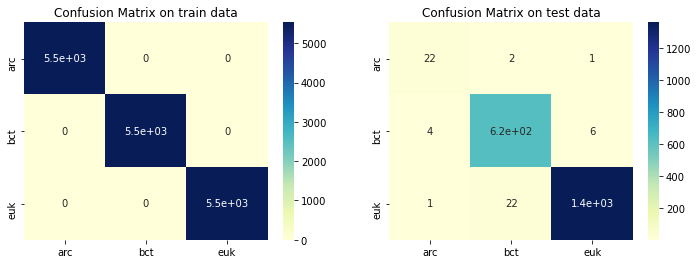


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9343194753030818
AUC score on test data 0.9974026051537145



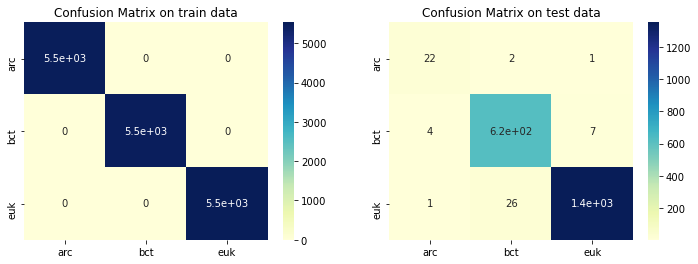

In [104]:
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")

import lightgbm
params = dict()
clf_lgb_k_smt, auc_lgb_smt, f1_score_lgb_smt = fit_print_report(lightgbm.LGBMClassifier, x_train_smt_k, y_train_smt_k, x_test_k, y_test_k, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")

params = dict()
clf_lgb_k_ada, auc_lgb_ada, f1_score_lgb_ada = fit_print_report(lightgbm.LGBMClassifier, x_train_ada_k, y_train_ada_k, x_test_k, y_test_k, params, None)

The top 15 most pos. important feature are:  ['AGG', 'AUA', 'CGU', 'CGA', 'sum_g', 'UGA', 'CGC', 'GCG', 'AAG', 'UGC', 'UGU', 'CUG', 'UCC', 'GAG', 'ACG']


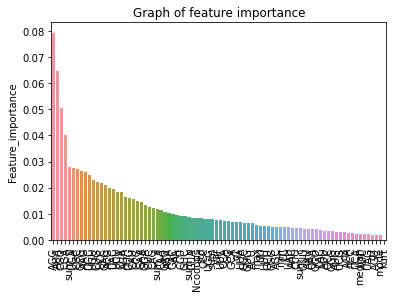

In [105]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **1.4.8 Decision Tree Classifier**


Fitting the Decision Tree classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.7905106140621972
AUC score on test data 0.9066127675607261



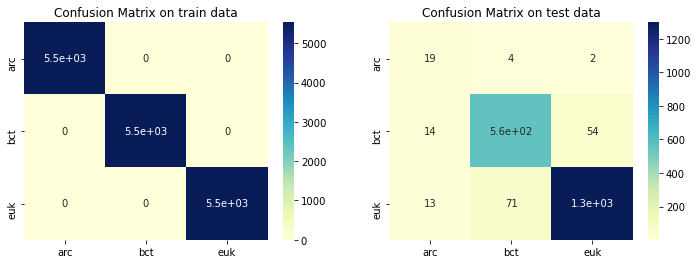


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.7743748442543623
AUC score on test data 0.8930468323522834



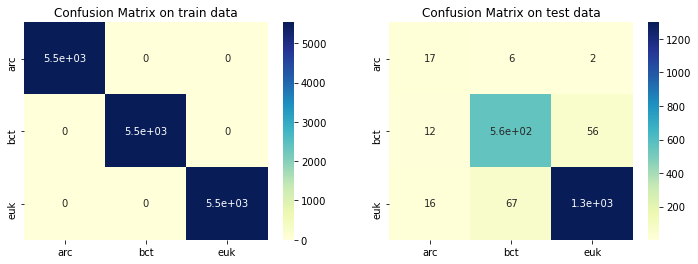

In [106]:
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf,  auc_dt_smt, f1_score_dt_smt = fit_print_report(DecisionTreeClassifier, x_train_smt_k, y_train_smt_k, x_test_k, y_test_k, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_dt_ada, f1_score_dt_ada = fit_print_report(DecisionTreeClassifier, x_train_smt_k, y_train_smt_k, x_test_k, y_test_k, params, None)

The top 15 most pos. important feature are:  ['AGG', 'sum_g', 'AUA', 'CGU', 'UCU', 'UGU', 'CUG', 'UUG', 'UGC', 'GCG', 'AAG', 'GAU', 'CGA', 'AA', 'CCC']


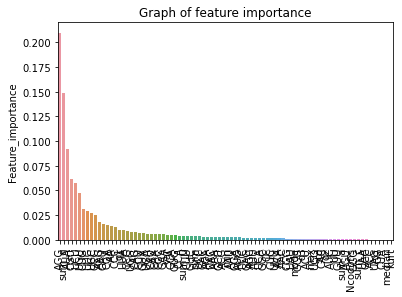

In [107]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_smt_k_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

### Conclusion

**Best model for our task is SVC model.**

In [108]:
x_train_ada_k_mm = pd.read_csv('Kingdom/Adasyn/with_std/x_train_ada_k_mm.csv')
y_train_ada_k_oe = np.load('Kingdom/Adasyn/with_std/y_train_ada_k_oe.npy')
x_test_k_ada_mm = pd.read_csv('Kingdom/Adasyn/with_std/x_test_k_ada_mm.csv')
y_test_k_oe = np.load('Kingdom/Adasyn/with_std/y_test_k_oe.npy')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9618426158427921
AUC score on test data 0.9974734022266213



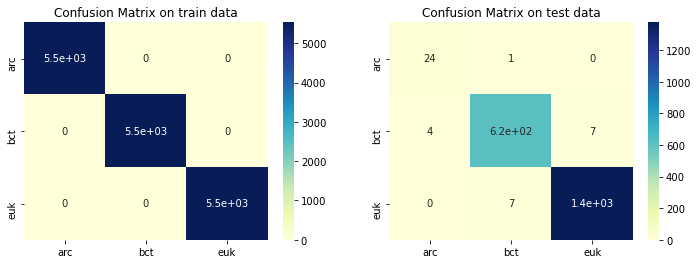

In [109]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")

params = dict(C = 1000, probability=True)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(SVC, x_train_smt_k_ss[good_features], y_train_smt_k_oe, x_test_k_smt_ss[good_features], y_test_k_oe, params, oe_smt, True, True)


### Custom Models

In [110]:
D = x_train_ada_k_mm
D['Kingdom'] = y_train_ada_k_oe
D1, D2 = train_test_split(D, train_size = 0.5, stratify = D['Kingdom'])

In [111]:
import warnings
warnings.filterwarnings("ignore")

#### 1. Trying a combnation of model

In [112]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

def split_data_and_fit_models(D1, D2, model_list, num_split, n, print_log = True):
    classifiers = []
    data_dict = {}

    D2y = D2['Kingdom']
    D2x = D2.drop(['Kingdom'], axis = 1)


    prediction_data = pd.DataFrame()
    # splitting and fitting classifier
    for num in range(num_split):
        data_dict[f'split_{num}'] = D1.sample(n, replace = True)
        test = data_dict[f'split_{num}']['Kingdom']
        train = data_dict[f'split_{num}'].drop(['Kingdom'], axis = 1)
        name = model_list[num]
        if name=='SVC':
            clf = SVC(probability=True)
        elif name=='lr':
            clf = LogisticRegression(max_iter = 1000)
        elif name=='dt':
            clf = DecisionTreeClassifier()
        elif name=='RF':
            clf = RandomForestClassifier()
        elif name =='xgb':
            clf = xgboost.XGBClassifier()
        elif name=='lgb':
            clf = lightgbm.LGBMClassifier()
        elif name=='nb':
            clf = GaussianNB()
        elif name=='knn':
            clf = KNeighborsClassifier(n_neighbors = 1)
        elif name=='knn_m':
            clf = KNeighborsClassifier(n_neighbors = 1, p=1)
            
            
        clf.fit(train, test)
        f1_score_train = f1_score( test, clf.predict(train),  average='macro')
        prediction_data[f'split_{num}_c1'] = clf.predict_proba(D2x)[:, 0]
        prediction_data[f'split_{num}_c2'] = clf.predict_proba(D2x)[:, 1]
#         prediction_data[f'split_{num}_c3'] = clf.predict_proba(D2x)[:, 2]
        
        classifiers.append(clf)
        if print_log:
            print(f'Fitting {name} model', f1_score_train)
    return classifiers, data_dict, prediction_data

model_list = [ 'lr', 'RF', 'xgb', 'lgb', 'SVC', 'dt', 'knn', 'nb', 'knn_m', 'SVC', 'RF']
classifiers, data_dict, prediction_data = split_data_and_fit_models(D1, D2, model_list,len(model_list), 4000 )

Fitting lr model 0.9700620632490992
Fitting RF model 1.0
[12:50:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Fitting xgb model 1.0
Fitting lgb model 1.0
Fitting SVC model 0.9856530544020896
Fitting dt model 1.0
Fitting knn model 1.0
Fitting nb model 0.7928072756759986
Fitting knn_m model 1.0
Fitting SVC model 0.985549666787799
Fitting RF model 1.0


In [113]:
def transform_to_prediction(data, classifiers):
    prediction_data = pd.DataFrame()
    for num, clf in enumerate(classifiers):
        prediction_data[f'split_{num}_c1'] = clf.predict_proba(data)[:, 0]
        prediction_data[f'split_{num}_c2'] = clf.predict_proba(data)[:, 1]
#         prediction_data[f'split_{num}_c3'] = clf.predict_proba(data)[:, 2]
    return prediction_data

prediction_test_data = transform_to_prediction(x_test_k_ada_mm, classifiers)

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9896834779646441
AUC score on training data 0.99930921278221

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.930912797960417
AUC score on test data 0.996863381666173



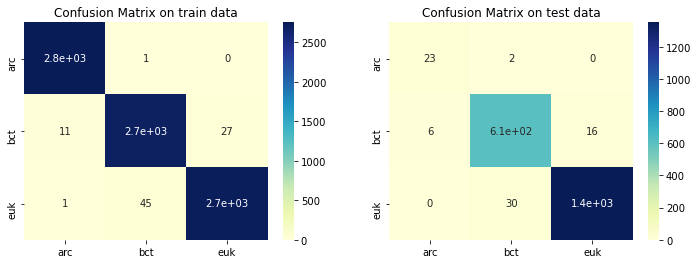

In [114]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(LogisticRegression, prediction_data, D2['Kingdom'] , prediction_test_data, y_test_k_oe, params, oe_smt)

In [115]:
# Custom function for fitting different number of model

from colorama import Fore, Back, Style

def tune_custom_models(D1, D2, model_type, meta_model, num_sample, combinations_to_try = [], test_data_x = x_test_k_ada_mm, test_data_y = y_test_k_oe):
    custom_auc = []
    custom_f1_score = []
    for num in combinations_to_try:
        print(Fore.GREEN, "[INFO] : ", end = '')
        print(Fore.BLACK, f' Trying for fitting {num} models')
        model_list = [model_type]*num
        classifiers, data_dict, prediction_data = split_data_and_fit_models(D1, D2, model_list, num, num_sample, False )
        prediction_test_data = transform_to_prediction(test_data_x, classifiers)
        params = dict(probability=True)
        clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(meta_model, prediction_data, D2['Kingdom'] , prediction_test_data, test_data_y, params, oe_smt, False, False)
        custom_auc.append(auc_svc_mm_ada)
        custom_f1_score.append(f1_score_svc_mm_ada)
        
        
    fig, axes = plt.subplots(1, 2, figsize = (20, 6))

    # plt.plot(val_k, auc_scores,c='g', )
    sns.lineplot(x= combinations_to_try, y = custom_auc, ax = axes[0], color = 'g')
    for i, txt in enumerate(np.round(custom_auc,3)):
        axes[0].annotate((combinations_to_try[i],np.round(txt,3)), (combinations_to_try[i],custom_auc[i]))
    plt.title('Auc Score for different number of models')

    sns.lineplot(x= combinations_to_try, y = custom_f1_score, ax = axes[1], color = 'g')
    for i, txt in enumerate(np.round(custom_f1_score,3)):
        axes[1].annotate((combinations_to_try[i],np.round(txt,3)), (combinations_to_try[i],custom_f1_score[i]))
    plt.title('F1-Scores for different number of models')
    plt.show()

#### 2 Trying Logistic Regression as custom model

 [INFO] :   Trying for fitting 1 models
 [INFO] :   Trying for fitting 2 models
 [INFO] :   Trying for fitting 3 models
 [INFO] :   Trying for fitting 10 models
 [INFO] :   Trying for fitting 15 models
 [INFO] :   Trying for fitting 20 models
 [INFO] :   Trying for fitting 25 models
 [INFO] :   Trying for fitting 30 models
 [INFO] :   Trying for fitting 35 models
 [INFO] :   Trying for fitting 40 models
 [INFO] :   Trying for fitting 45 models
 [INFO] :   Trying for fitting 50 models


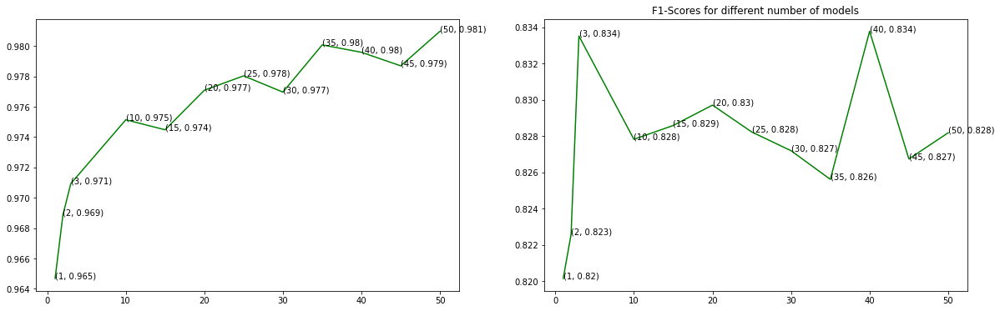

In [116]:
tune_custom_models(D1, D2, 'lr', SVC, 4000, [1, 2, 3, 10, 15, 20, 25, 30, 35, 40, 45, 50])

#### 3. Trying to fit SVC

 [INFO] :   Trying for fitting 1 models
 [INFO] :   Trying for fitting 2 models
 [INFO] :   Trying for fitting 3 models
 [INFO] :   Trying for fitting 10 models
 [INFO] :   Trying for fitting 15 models
 [INFO] :   Trying for fitting 20 models
 [INFO] :   Trying for fitting 25 models
 [INFO] :   Trying for fitting 30 models
 [INFO] :   Trying for fitting 35 models
 [INFO] :   Trying for fitting 40 models
 [INFO] :   Trying for fitting 45 models
 [INFO] :   Trying for fitting 50 models


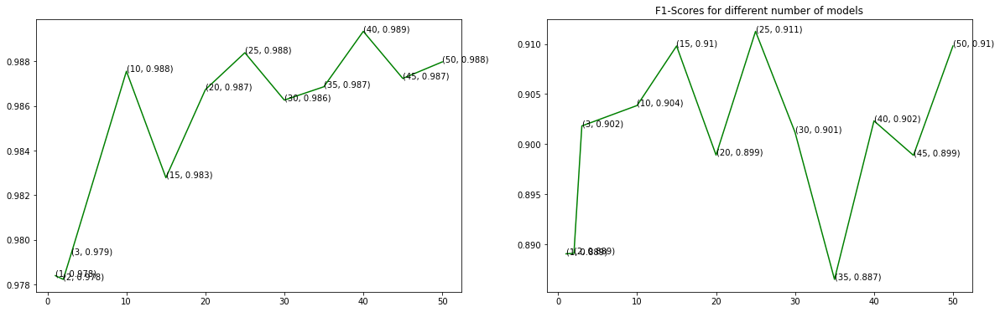

In [117]:
tune_custom_models(D1, D2, 'SVC', SVC, 4000, [1, 2, 3, 10, 15, 20, 25, 30, 35, 40, 45, 50], test_data_x = x_test_k_ada_mm, test_data_y = y_test_k_oe)

#### 3. trying for xgboost

 [INFO] :   Trying for fitting 1 models
[13:15:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
 [INFO] :   Trying for fitting 2 models
[13:15:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:15:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the o

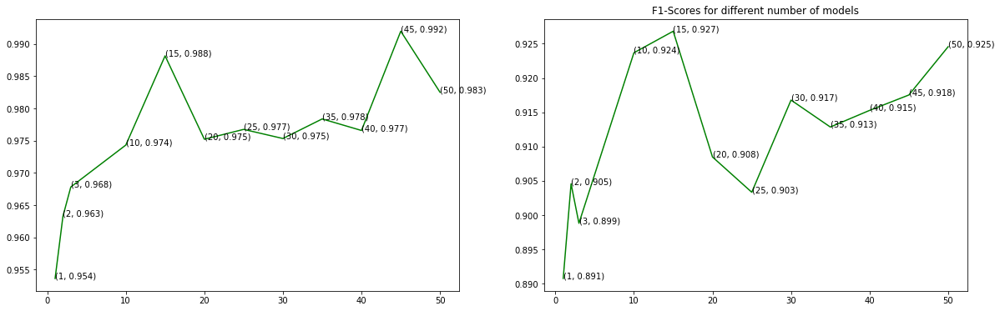

In [118]:
tune_custom_models(D1, D2, 'xgb', SVC, 4000, [1, 2, 3, 10, 15, 20, 25, 30, 35, 40, 45, 50], test_data_x = x_test_k_ada_mm, test_data_y = y_test_k_oe)

#### The best f1_score after sampling dataset and using SVC as meta model is 0.9502 Which is still slight less than 0.9665

## Task 2 DNAtype Classificatgion

### 2.1  Exploratory data analysis

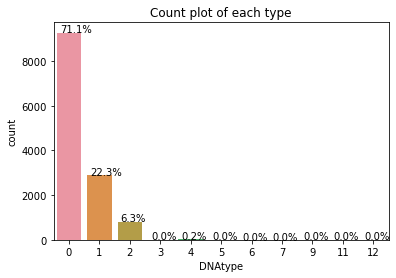

In [9]:
# plot countplot of dnatype
ax = sns.countplot(data = data_dnatype, x = 'DNAtype')

# label the patches by percentage
patches = ax.patches
total = len(data_dnatype)
for patch in patches:
    height = patch.get_height()
    percent = (height/total)*100
    ax.annotate('{:.1f}%'.format(percent), (patch.get_x()+0.1, patch.get_height()+5))


plt.title('Count plot of each type')
plt.show()

In [10]:
print("The number of the datapoints having DNAtype grater thn 3:", data_dnatype[data_dnatype['DNAtype']>=3].shape[0])
print("The number of the datapoints having DNAtype grater thn 3:", data_dnatype.shape[0]-data_dnatype[data_dnatype['DNAtype']>=3].shape[0])


The number of the datapoints having DNAtype grater thn 3: 46
The number of the datapoints having DNAtype grater thn 3: 12980


* <b>There are only 46 datapoints of the DNAtype ```4 5 6 7 8 9 10 11 12``` .</b>
* There are 12980  datapoints having dnatype ```1 2 3 ```.
* So I will be dropping the rows having the dnatype greater than 3 in for this case stydy.

The shape of the data : (12980, 66)


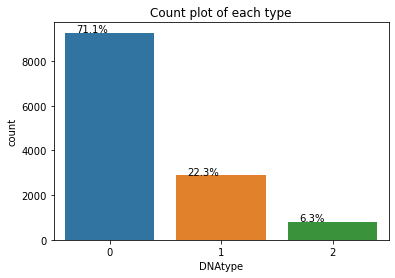

In [11]:
data_dnatype = data_dnatype[data_dnatype['DNAtype']<3]
print('The shape of the data :', data_dnatype.shape)

# plot countplot of Kingdom
ax = sns.countplot(data = data_dnatype, x = 'DNAtype')

# label the patches by percentage
patches = ax.patches
total = len(data_kingdom)
for patch in patches:
    height = patch.get_height()
    percent = (height/total)*100
    ax.annotate('{:.1f}%'.format(percent), (patch.get_x()+0.1, patch.get_height()+5))


plt.title('Count plot of each type')
plt.show()

Since This task is also a imbalace classification task so same as previous we again choose F1-score and AUC as our evaluation matrix

#### 2.1.1 Analysis of target variable (i.e DNAtype)

####  2.1.1 Univariate analysis

In [12]:
def plot_kde_and_box(data, query_col, category_col):
    # make subplot and  give title
    fig, ax = plt.subplots(1, 2, figsize=(10,5))
    fig.suptitle(f'Distribution of {query_col}')

    # get unique categories and generate colors
    cat = data[category_col].unique()
    num_cat = cat.shape[0]
    colors = sns.color_palette(n_colors = num_cat)

    plt.subplot(1, 2, 1)
    # prepare data and plot for each class
    for i in range(num_cat):
        s = data[data[category_col]==cat[i]][query_col]
        p1 = sns.kdeplot(s, color= colors[i], shade=True, label='Yes')
    plt.legend(cat.tolist())
    plt.title(f'Plot of {query_col} for each category.')

    plt.subplot(1, 2, 2)
    #  Boxplot Ncodons wrt kingdom
    sns.boxplot(data = data, x = category_col, y = query_col)
    plt.title(f'Boxplot of {category_col} vs {query_col}.')
    plt.show()

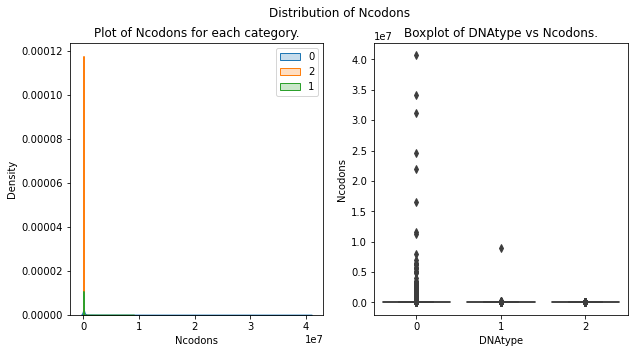

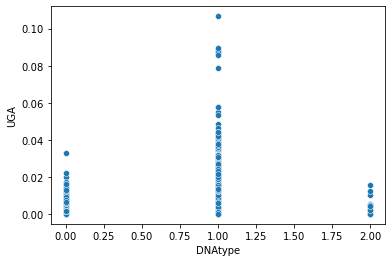

In [13]:
# plotting boxplot of Ncodons   
plot_kde_and_box(data_dnatype, 'Ncodons', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'UGA')
plt.show()

* Since the range of distribution is so much small that the graphs are not visisble in KDE plot.
* But the boxplot shows that Ncodons is not able to classify the DNAtype

**Since there are alot number of featwure, so as done in previous task, I will plot the boxplot and kde plot of all the features together and take out the features which needs to bje analysed further.**

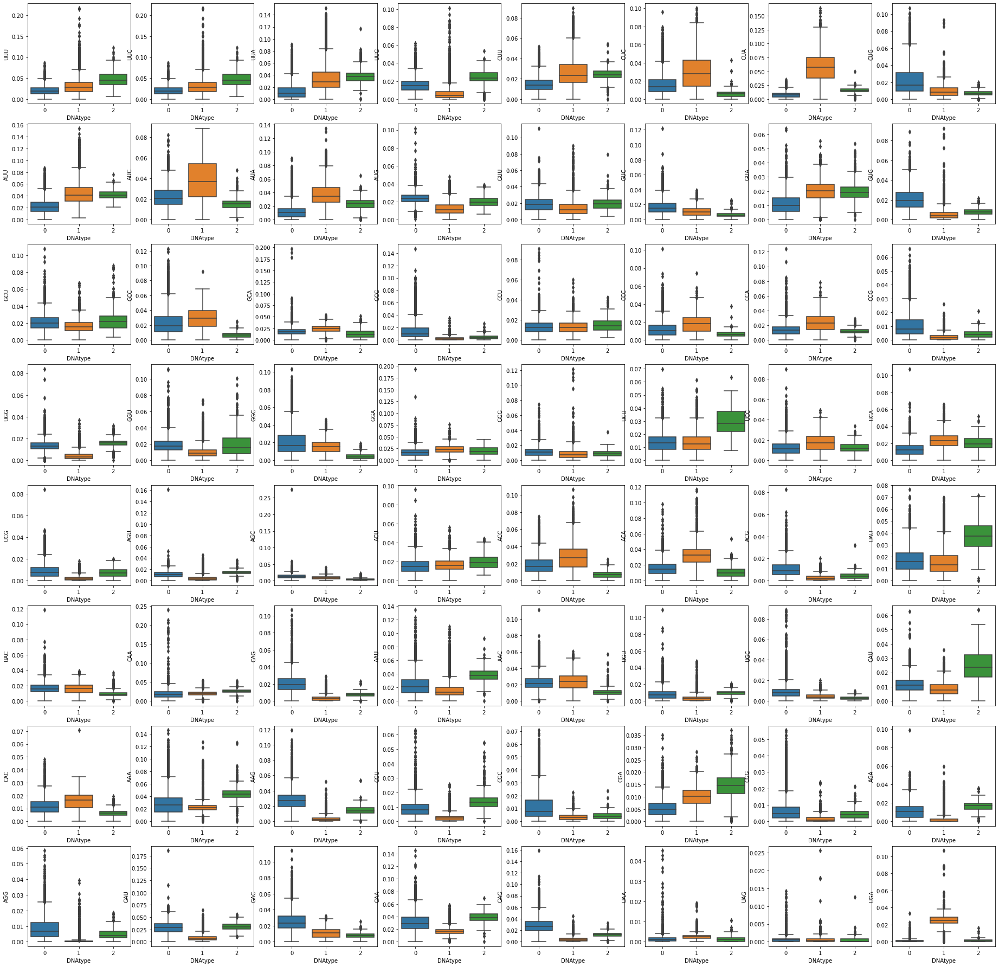

In [14]:
codons_col = ['UUU','UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA','AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
                'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC','UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
                'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG','CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
                'UAA', 'UAG', 'UGA']
fig, axes = plt.subplots(8, 8, figsize = (32, 32))

temp = 0
for i in range(8):
    for j in range(8):
        sns.boxplot(data = data_dnatype, x= 'DNAtype' , y=codons_col[temp] , ax = axes[i][j])
        temp+=1
plt.show()

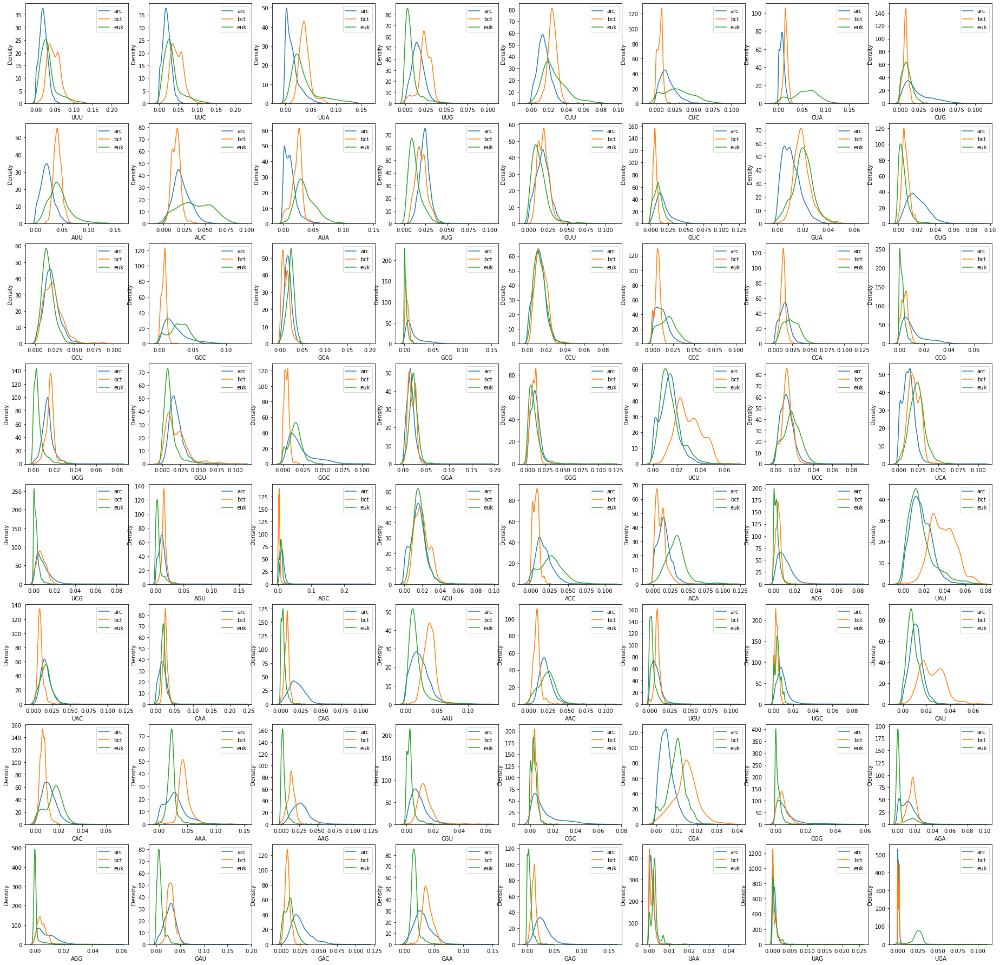

In [15]:
codons_col = ['UUU','UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA','AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
                'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC','UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
                'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG','CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
                'UAA', 'UAG', 'UGA']
fig, axes = plt.subplots(8, 8, figsize = (32, 32))

temp = 0
for i in range(8):
    for j in range(8):
        cat = data_dnatype['DNAtype'].unique().tolist()
        for idx in range(len(cat)):
            d = data_dnatype[data_dnatype['DNAtype']==cat[idx]][codons_col[temp]]
            sns.kdeplot(data = d , ax = axes[i][j])
        axes[i][j].legend(['arc', 'bct', 'euk'])
        temp+=1
plt.show()

**From the above two subplots, it has been seen that the features like ```UGA CGA CAU UAU UGG GCC AGG GAU CUA AAU```**

So let's analyse these features


**1 UGA**

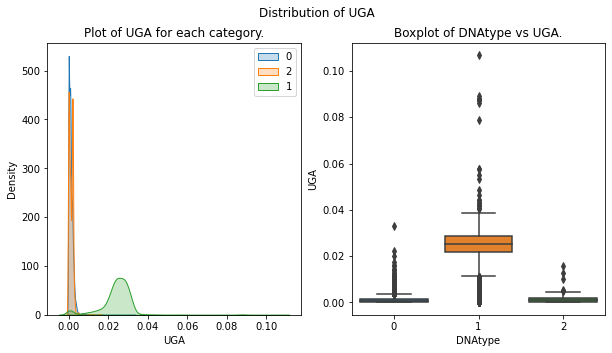

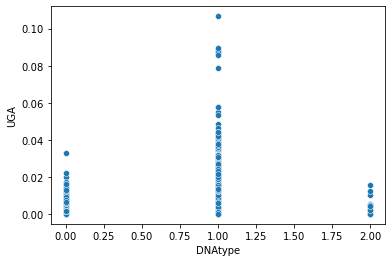

In [16]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'UGA', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'UGA')
plt.show()

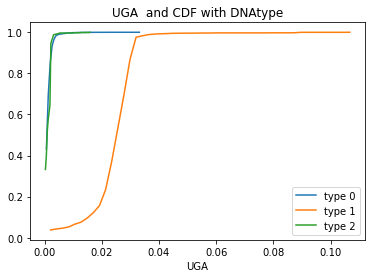

In [17]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['UGA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UGA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UGA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UGA
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['type 0', 'type 1', 'type 2'])
plt.xlabel('UGA')
plt.title('UGA  and CDF with DNAtype')
plt.show()

* In the KDE plot, the DNAtype is 1 is very well seperated by the ```UGA``` codon.
* Conclusion:    
    * **if UGA > 0.005 ; than datapoint belongs to dnatype 1**
    * DNAtype 0 and 2 are highly overlapping

**2 CGA**

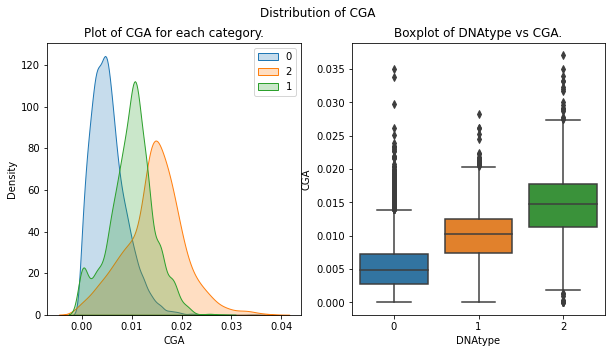

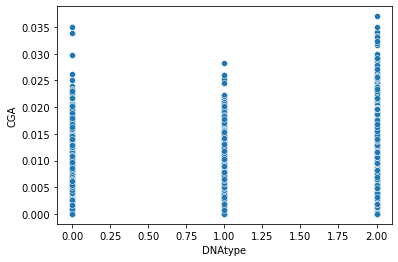

In [18]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'CGA', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'CGA')
plt.show()

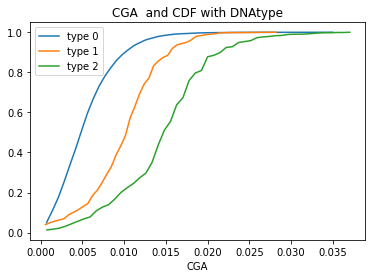

In [19]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['CGA'], bins=50, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CGA'], bins=50, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CGA'], bins=50, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of CGA
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['type 0', 'type 1', 'type 2'])
plt.xlabel('CGA')
plt.title('CGA  and CDF with DNAtype')
plt.show()

**3 CAU**

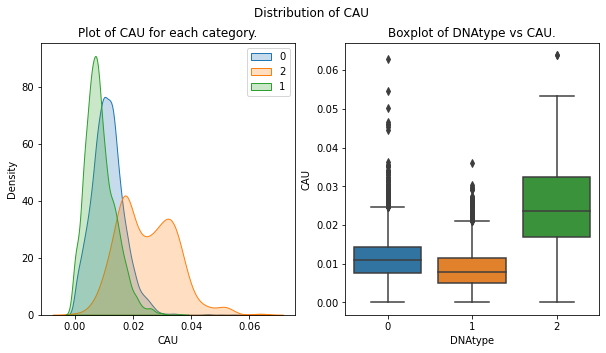

In [20]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'CAU', 'DNAtype')

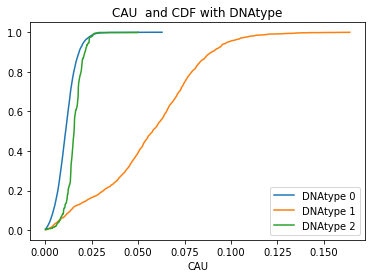

In [21]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['CAU'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CUA'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CUA'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of CUA
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('CAU')
plt.title('CAU  and CDF with DNAtype')
plt.show()

Conclusion:     
* if CAu>0.025;  the datapoint belong to type 1.

**4 UAU**

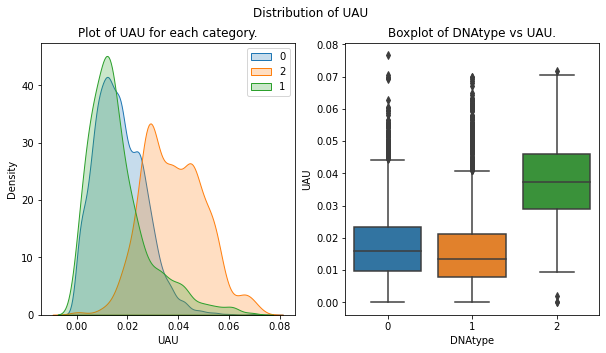

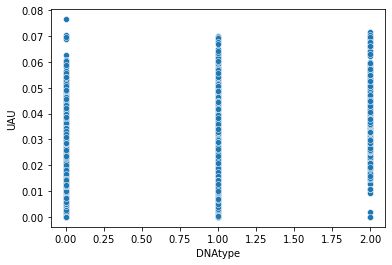

In [22]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'UAU', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'UAU')
plt.show()

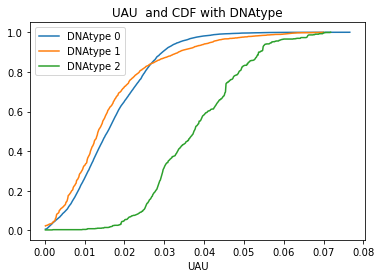

In [23]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['UAU'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UAU'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UAU'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UAU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('UAU')
plt.title('UAU  and CDF with DNAtype')
plt.show()

Conclusion:    
* For UAU>0.035 ; The datapoints belog to type 2 with 90% of accuracy
* other two classes are not well seperated y this pdf.

**5 UGG**

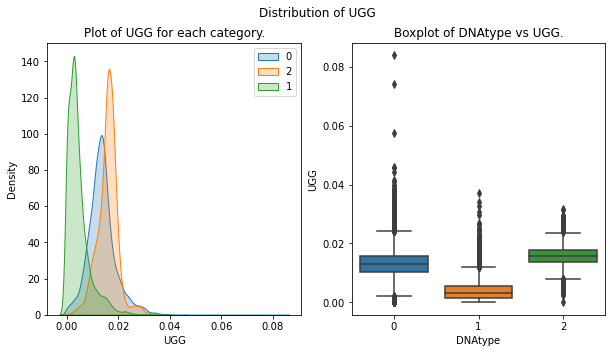

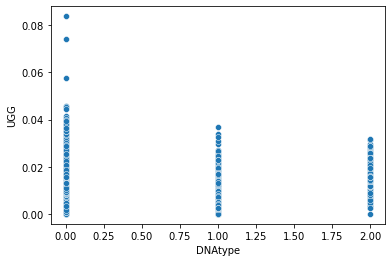

In [24]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'UGG', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'UGG')
plt.show()

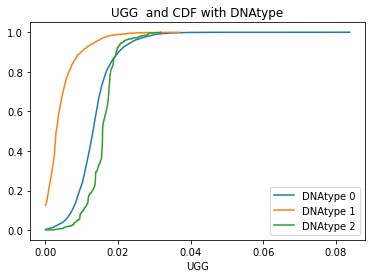

In [25]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['UGG'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UGG'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UGG'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('UGG')
plt.title('UGG  and CDF with DNAtype')
plt.show()

**6 GCC**

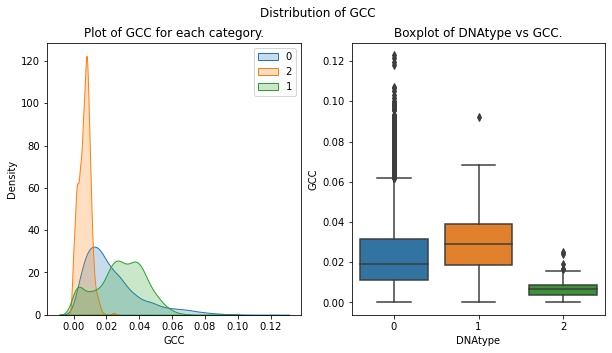

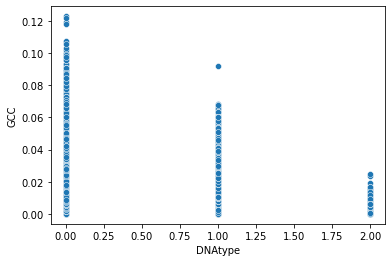

In [26]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'GCC', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'GCC')
plt.show()

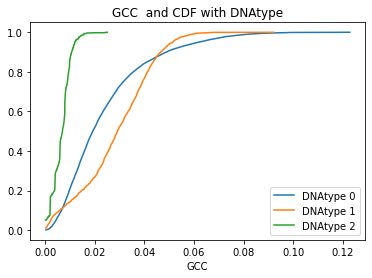

In [27]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['GCC'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['GCC'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['GCC'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of GCC
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('GCC')
plt.title('GCC  and CDF with DNAtype')
plt.show()

**7 AGG**

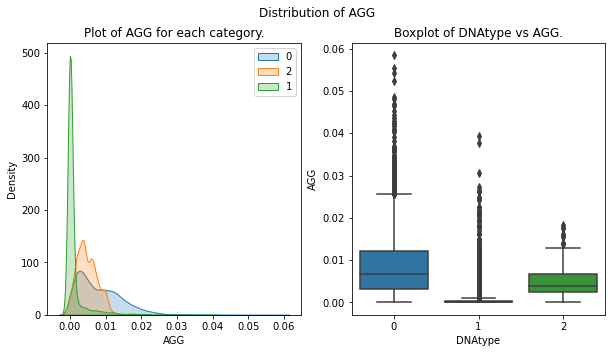

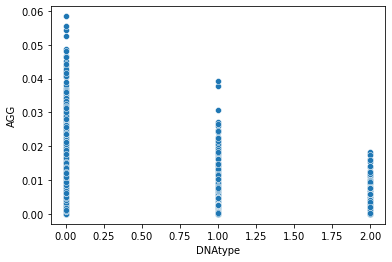

In [28]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'AGG', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'AGG')
plt.show()

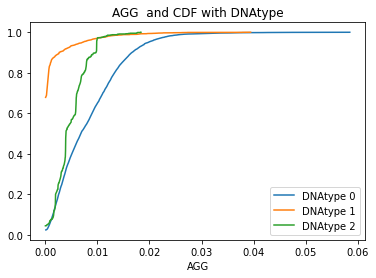

In [29]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['AGG'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AGG'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AGG'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of AGG
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('AGG')
plt.title('AGG  and CDF with DNAtype')
plt.show()

**8 CUA**

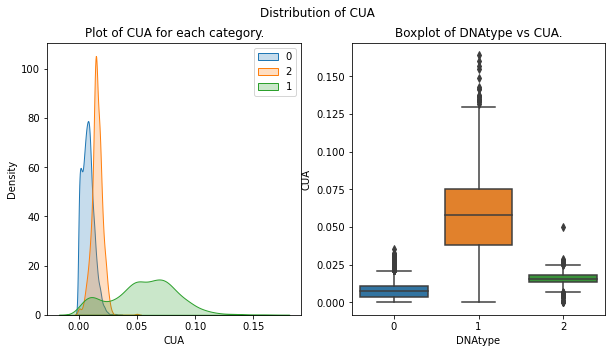

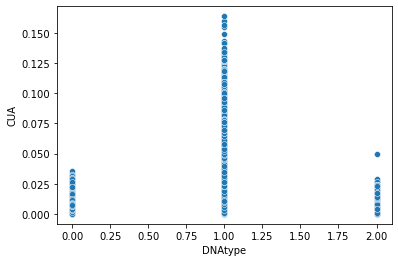

In [30]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'CUA', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'CUA')
plt.show()

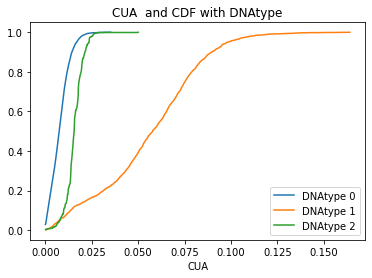

In [31]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['CUA'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CUA'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CUA'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of CUA
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('CUA')
plt.title('CUA  and CDF with DNAtype')
plt.show()

Conclusion:     
* If **0.050>CUA>0.025 ; With 95+% of probability datapoint belong to type1**
* If **CUA>0.050 ; its belog to type 1 for sure.**
* This feature is also seperating type 2 and type 0 to good extent.

**9 AAU**

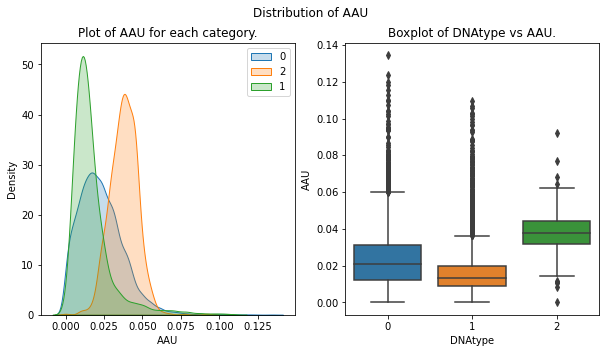

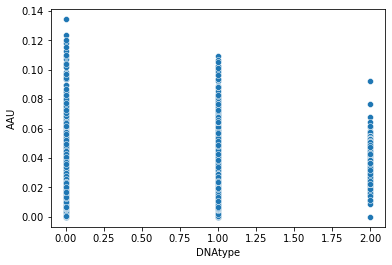

In [32]:
# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'AAU', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'AAU')
plt.show()

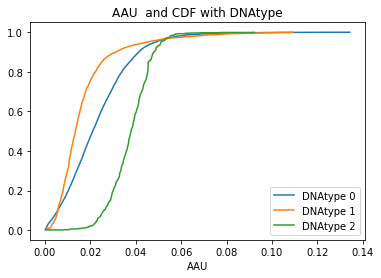

In [33]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['AAU'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AAU'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AAU'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('AAU')
plt.title('AAU  and CDF with DNAtype')
plt.show()

**Feature Engineering**

Let's Now engineer some of the features
* kurtosis
* mean
* mode
* median
* min
* max
* variance
* standard deviation
* first quantile 
* 1st quantile 
* 2nd quantile
* 3rd quantile


**1 kurtosis**

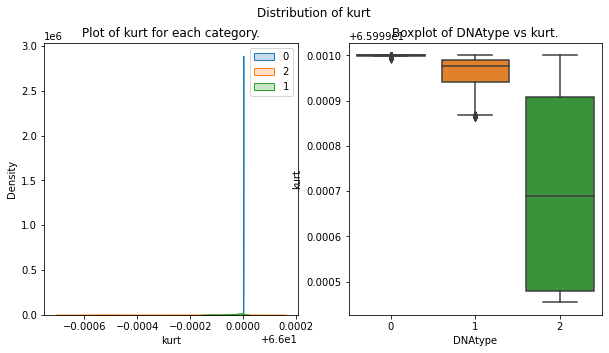

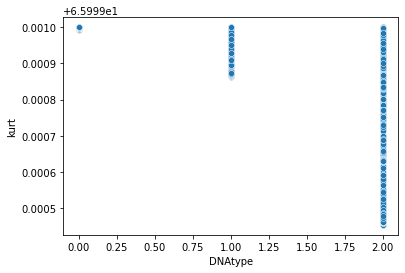

In [34]:
data_dnatype['kurt'] = data_dnatype.kurtosis(axis = 1).values

plot_kde_and_box(data_dnatype, 'kurt', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'kurt')
plt.show()

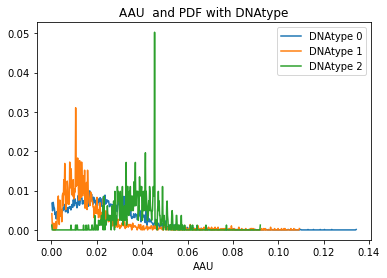

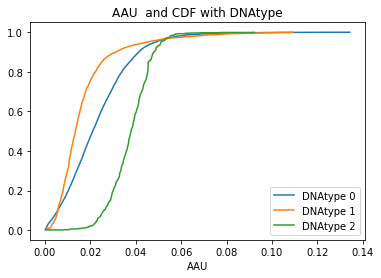

In [35]:
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

counts_0, bin_edges_0 = np.histogram(df_0['AAU'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['AAU'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['AAU'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('AAU')
plt.title('AAU  and PDF with DNAtype')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('AAU')
plt.title('AAU  and CDF with DNAtype')
plt.show()

**2 median**

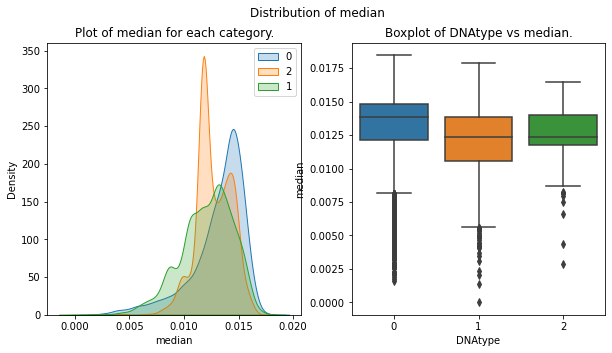

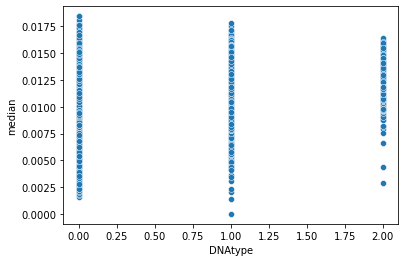

In [36]:
data_dnatype['median'] = data_dnatype.median(axis = 1).values

plot_kde_and_box(data_dnatype, 'median', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'median')
plt.show()


**3 mode

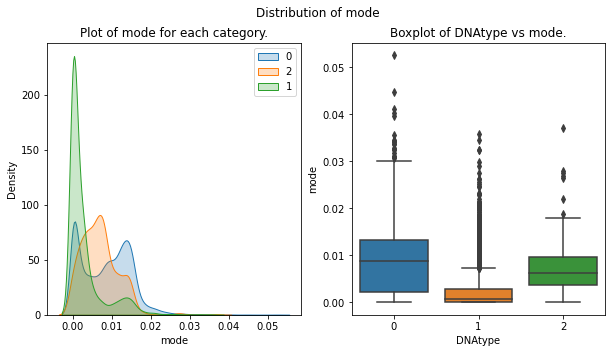

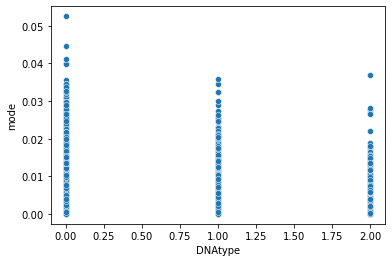

In [37]:
data_dnatype['mode'] = data_dnatype.mode(axis = 1).values[0:, 0]

plot_kde_and_box(data_dnatype, 'mode', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'mode')
plt.show()


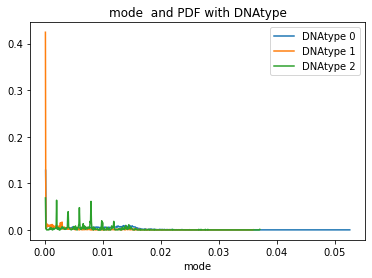

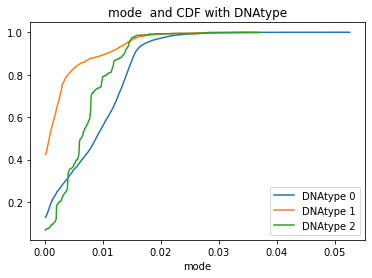

In [38]:
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

counts_0, bin_edges_0 = np.histogram(df_0['mode'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['mode'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['mode'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('mode')
plt.title('mode  and PDF with DNAtype')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('mode')
plt.title('mode  and CDF with DNAtype')
plt.show()

**4 var**

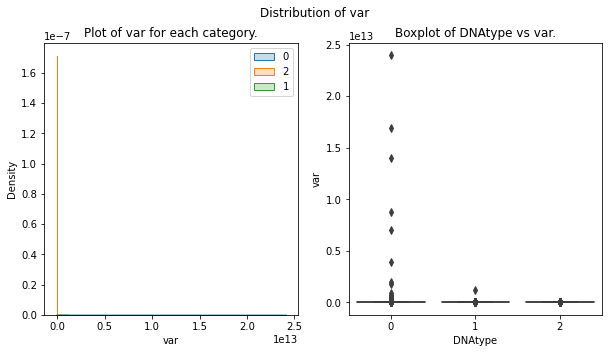

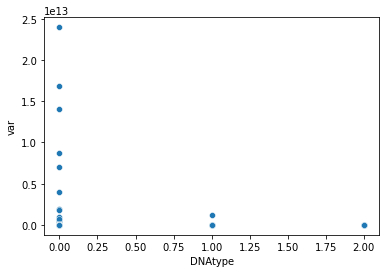

In [39]:
data_dnatype['var'] = data_dnatype.var(axis = 1)

plot_kde_and_box(data_dnatype, 'var', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'var')
plt.show()


**5 min**

C:\Users\HPvns\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


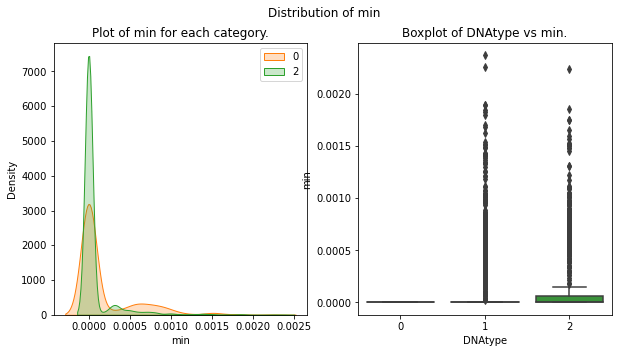

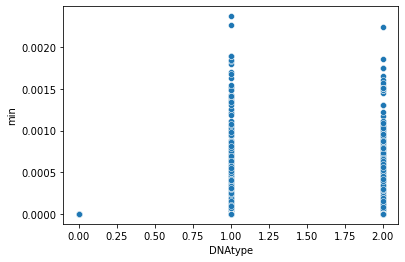

In [40]:
data_dnatype['min'] = data_dnatype.min(axis = 1)

plot_kde_and_box(data_dnatype, 'min', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'min')
plt.show()


**6 q1**

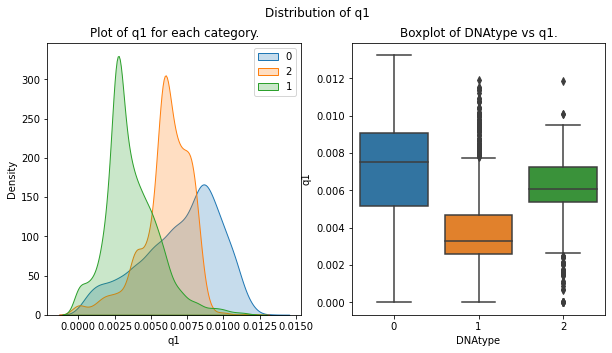

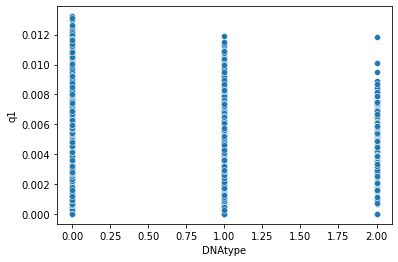

In [41]:
data_dnatype['q1'] = data_dnatype.quantile(0.25, axis = 1)

plot_kde_and_box(data_dnatype, 'q1', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'q1')
plt.show()


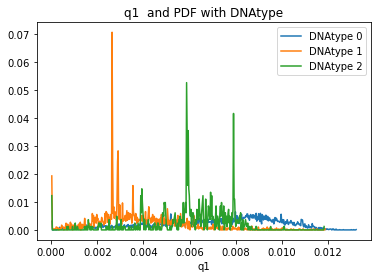

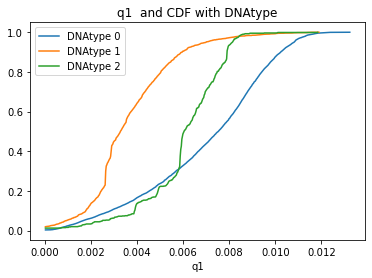

In [42]:
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

counts_0, bin_edges_0 = np.histogram(df_0['q1'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['q1'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['q1'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q1')
plt.title('q1  and PDF with DNAtype')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q1')
plt.title('q1  and CDF with DNAtype')
plt.show()

**7 q2**

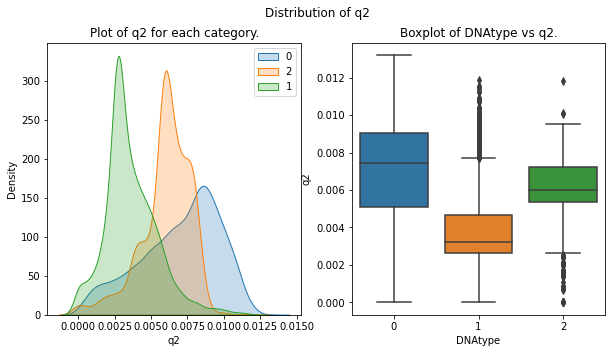

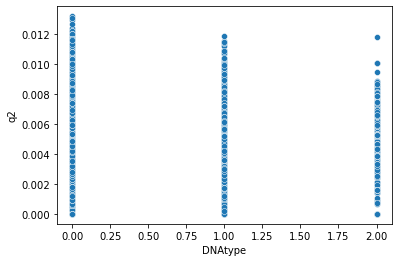

In [43]:
data_dnatype['q2'] = data_dnatype.quantile(0.25, axis = 1)

plot_kde_and_box(data_dnatype, 'q2', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'q2')
plt.show()


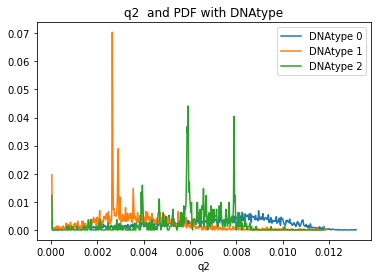

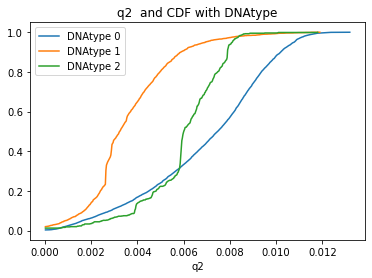

In [44]:
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

counts_0, bin_edges_0 = np.histogram(df_0['q2'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['q2'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['q2'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q2')
plt.title('q2  and PDF with DNAtype')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q2')
plt.title('q2  and CDF with DNAtype')
plt.show()

**8 q3**

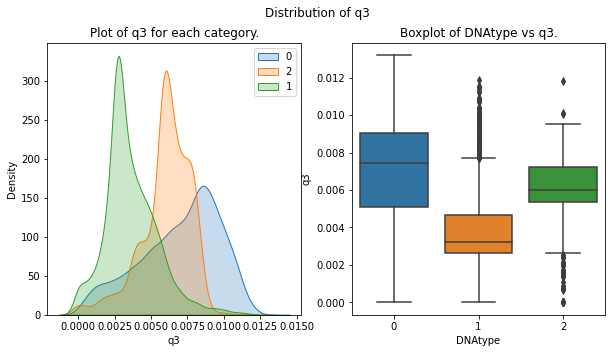

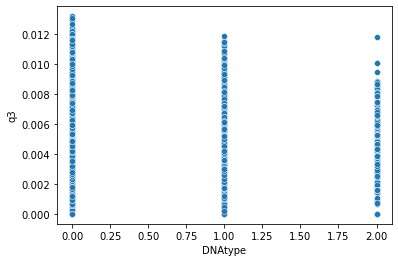

In [45]:
data_dnatype['q3'] = data_dnatype.quantile(0.25, axis = 1)

plot_kde_and_box(data_dnatype, 'q3', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'q3')
plt.show()


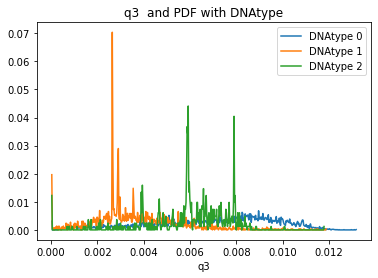

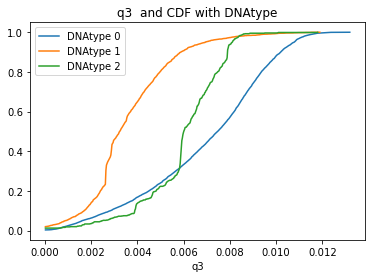

In [46]:
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

counts_0, bin_edges_0 = np.histogram(df_0['q3'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['q3'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['q3'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:],pdf_0)
plt.plot(bin_edges_1[1:],pdf_1)
plt.plot(bin_edges_2[1:],pdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q3')
plt.title('q3  and PDF with DNAtype')
plt.show()

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('q3')
plt.title('q3  and CDF with DNAtype')
plt.show()

**9 std**

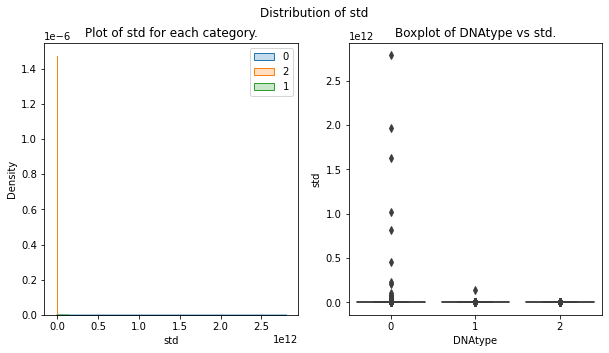

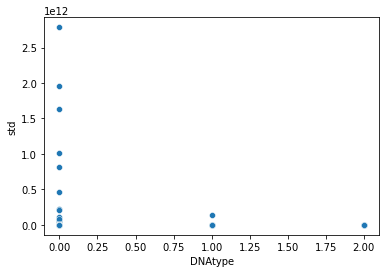

In [47]:
data_dnatype['std'] = data_dnatype.std(axis = 1)

plot_kde_and_box(data_dnatype, 'std', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'std')
plt.show()


**10 sum**

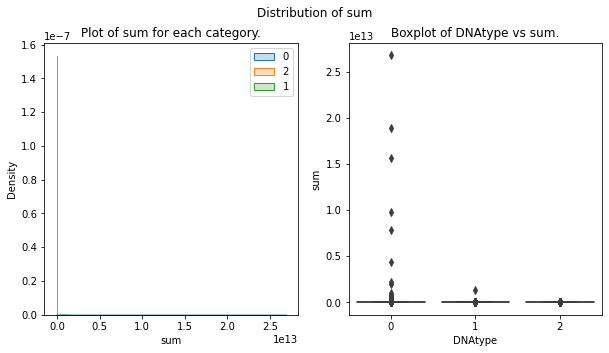

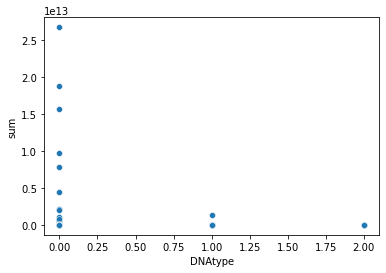

In [48]:
data_dnatype['sum'] = data_dnatype.sum(axis = 1)

plot_kde_and_box(data_dnatype, 'sum', 'DNAtype')

sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'sum')
plt.show()


Statics based feature (Conclusion):     
* Some features like ```sum std min max and var``` has very less variance across the datapoints for each class.
* Features like ```kurt mean median mode q1 q2 q3``` has significant variance across data points.
* KDE plot of q1, q2, q3 shows these are useful feature for the classification. 

* **Generating features by using occurance of bases on DNA**

**1 UU**

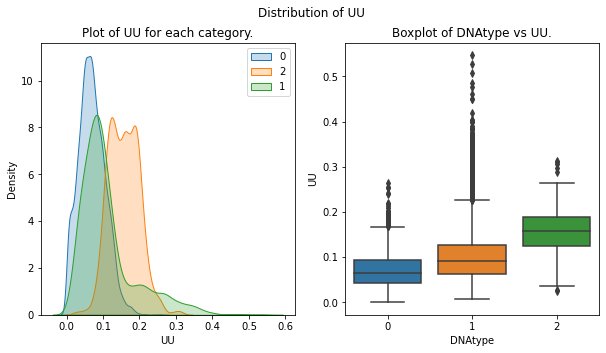

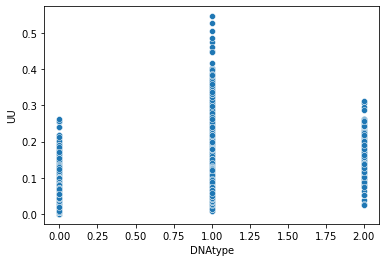

In [49]:
# Add all the codons having two consecutive U in name
U = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if col[0:2]=='UU':
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    U.append(temp)

# Add a feature UU
data_dnatype['UU'] = U

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'UU', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'UU')
plt.show()


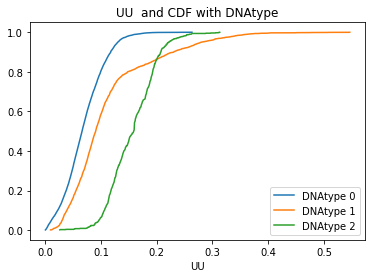

In [50]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['UU'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['UU'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['UU'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of UU
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('UU')
plt.title('UU  and CDF with DNAtype')
plt.show()

Conclusion:     
* This engineered feature is good in seperating dnatype 2 from rest.
* Also it seperate dnatype 0 and 2 with each other.

**2 AA**

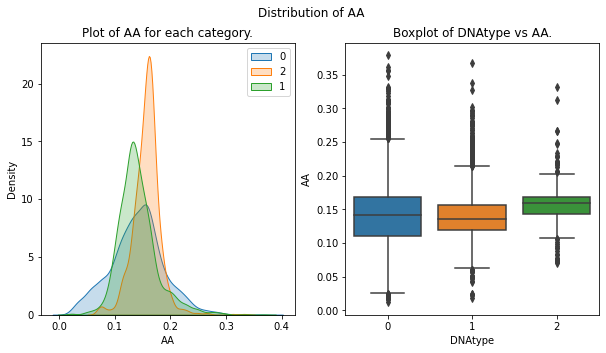

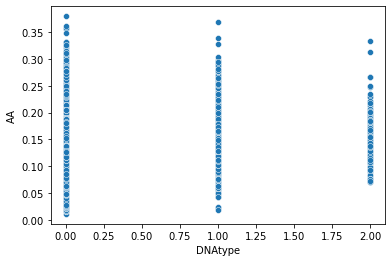

In [51]:
# Add all the codons having two consecutive AA in name
A = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if col[0:2]=='AA' or col[-1:-3]=='AA' or (col[0]=='A' and col[-1]=='A'):
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    A.append(temp)
    
# Add a feature UU
data_dnatype['AA'] = A

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'AA', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'AA')
plt.show()



**3 CC**

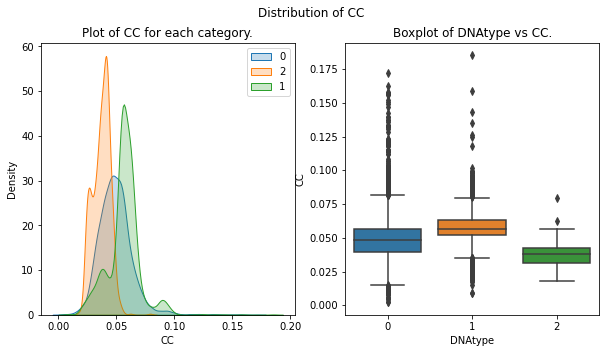

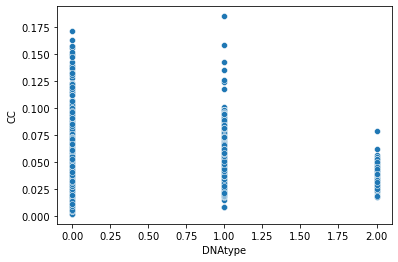

In [52]:
# Add all the codons having two consecutive CC in name
C = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if col[0:2]=='CC' or col[-1:-3]=='CC' or (col[0]=='CC' and col[-1]=='CC'):
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    C.append(temp)
# Add a feature UU
data_dnatype['CC'] = C

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'CC', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'CC')
plt.show()



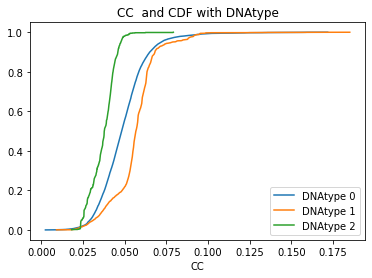

In [53]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['CC'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['CC'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['CC'], bins=500, density = True)

# plot cdf of CC
pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('CC')
plt.title('CC  and CDF with DNAtype')
plt.show()

**4 GG**

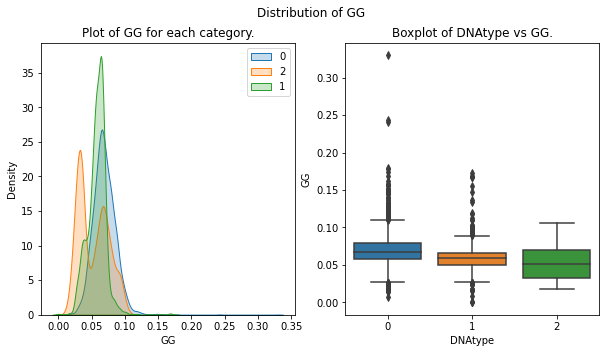

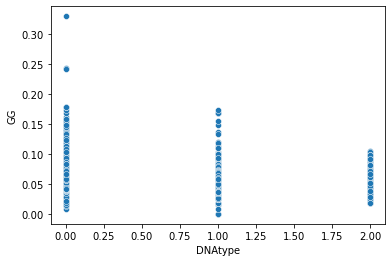

In [54]:
# Add all the codons having two consecutive GG in name
G = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if col[0:2]=='GG' or col[-1:-3]=='GG' or (col[0]=='GG' and col[-1]=='GG'):
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    G.append(temp)

# Add a feature UU
data_dnatype['GG'] = G

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'GG', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'GG')
plt.show()



**5 sum_g**

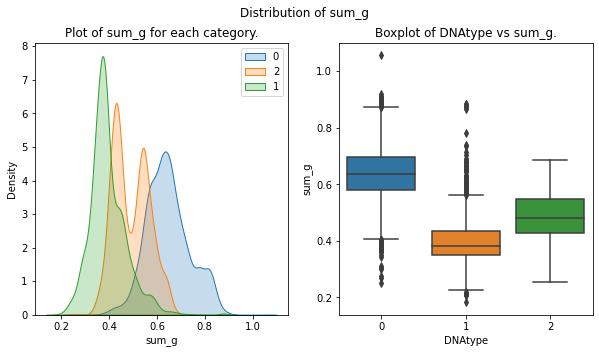

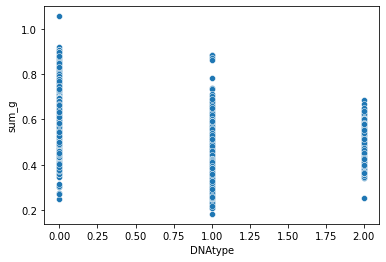

In [55]:
# Add all the codons having two consecutive U in name
with_g = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if 'G' in col:
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    with_g.append(temp)

# Add a feature sum_g
data_dnatype['sum_g'] = with_g

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'sum_g', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'sum_g')
plt.show()



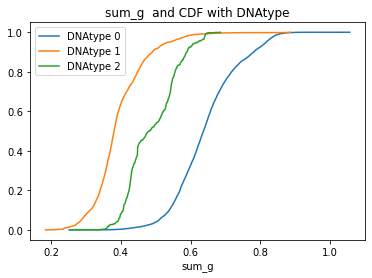

In [56]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_g'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_g'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_g'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of sum_g
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('sum_g')
plt.title('sum_g  and CDF with DNAtype')
plt.show()

Conclusion : 
<b>    
* if sum_g>0.6 ; datapoint belong to DNAtype with 99+% accuracy.
* if sum_g<0.35 ; datapoint belong to DNAtype 1 with 98+% accuracy.
* if 0.4<sum_g<0.5 ; datapoint the probabilty of datapoint belog to DNAtype 0 is less tha 5%. 
</b>

**6 sum_a**

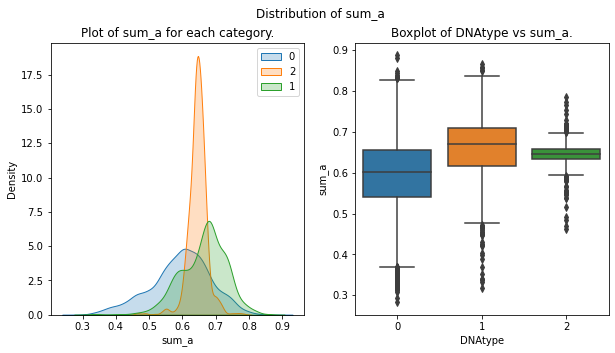

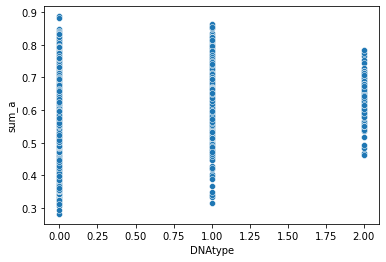

In [57]:
# Add all the codons having two consecutive A in name
with_a = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if 'A' in col and len(col)==3:
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    with_a.append(temp)

# Add a feature sum_a
data_dnatype['sum_a'] = with_a

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'sum_a', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'sum_a')
plt.show()



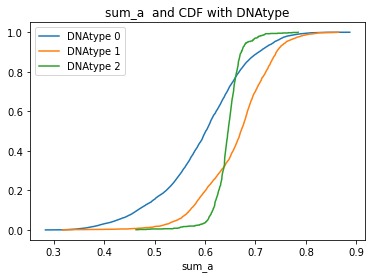

In [58]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_a'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_a'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_a'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of sum_a
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('sum_a')
plt.title('sum_a  and CDF with DNAtype')
plt.show()

Conclusion:     
* We can see that pdf is very well seperating the datapoints on basis of sum_a
* **if sum_a<0.6 ; there is very less chance (<1%) that datapoint belong to DNAtype 2**

**7 sum_c**

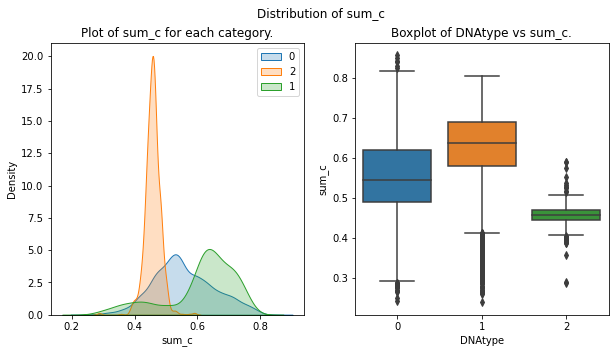

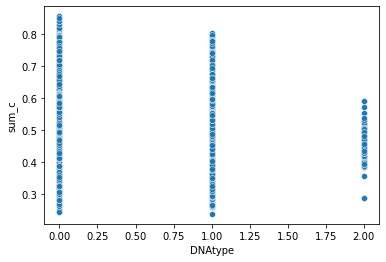

In [59]:
# Add all the codons having two consecutive C in name
with_c = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if 'C' in col and len(col)==3:
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    with_c.append(temp)

# Add a feature sum_c
data_dnatype['sum_c'] = with_c

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'sum_c', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'sum_c')
plt.show()



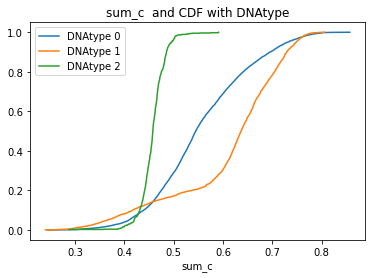

In [60]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_c'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_c'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_c'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of sum_c
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('sum_c')
plt.title('sum_c  and CDF with DNAtype')
plt.show()

Conclusions :            
* if 0.6>sum_c>0.5;  tthere are <1% chance that it belong to DNAtype 2.
* if sum_c>0.6 ; there are nodatapoint having DNAtype 2

**8 sum_u**

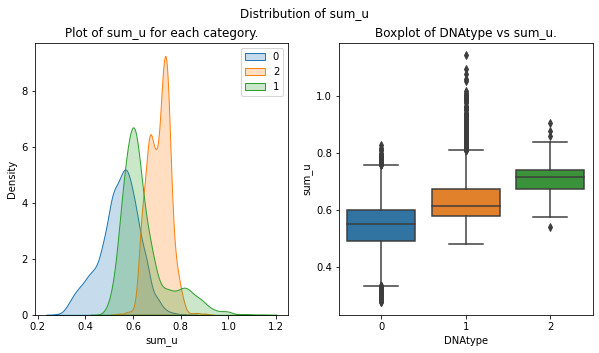

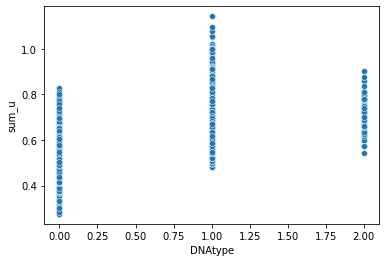

In [61]:
# Add all the codons having two consecutive U in name
with_u = []
for i in range(len(data_dnatype)):
    temp = 0
    for col in data_dnatype.columns:
        if 'U' in col and len(col)==3:
            try: 
                temp = temp + data_dnatype.iloc[i][col]
            except:
                print(data_dnatype.iloc[i][col])
    with_u.append(temp)

# Add a feature UU
data_dnatype['sum_u'] = with_u

# plot kde and boxplot
plot_kde_and_box(data_dnatype, 'sum_u', 'DNAtype')

# plot scatter plot
sns.scatterplot(data = data_dnatype, x = 'DNAtype', y = 'sum_u')
plt.show()



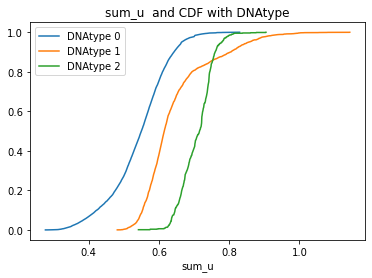

In [62]:
# seperate all classes into 3 classes
df_0 = data_dnatype[data_dnatype['DNAtype']==0]
df_1 = data_dnatype[data_dnatype['DNAtype']==1]
df_2 = data_dnatype[data_dnatype['DNAtype']==2]

# generate histogram data
counts_0, bin_edges_0 = np.histogram(df_0['sum_u'], bins=500, density = True)
counts_1, bin_edges_1 = np.histogram(df_1['sum_u'], bins=500, density = True)
counts_2, bin_edges_2 = np.histogram(df_2['sum_u'], bins=500, density = True)

pdf_0 = counts_0/sum(counts_0)
pdf_1 = counts_1/sum(counts_1)
pdf_2 = counts_2/sum(counts_2)
cdf_0 = np.cumsum(pdf_0)
cdf_1 = np.cumsum(pdf_1)
cdf_2 = np.cumsum(pdf_2)

# plot cdf of sum_u
plt.plot(bin_edges_0[1:], cdf_0)
plt.plot(bin_edges_1[1:], cdf_1)
plt.plot(bin_edges_2[1:], cdf_2)

plt.legend(['DNAtype 0', 'DNAtype 1', 'DNAtype 2'])
plt.xlabel('sum_u')
plt.title('sum_u  and CDF with DNAtype')
plt.show()

Conclusion:    
*  if sum_u<0.45; datapoint belong to DNAtype 0
* if sum_u>0.65; there is 80+% chance that data point belong to DNAtype 1

Conclusion for occurance based features:     
* All the occurance based features seems to have significant information for classification into different kigdom classes.
* Boxplot of sum_u is very good at defining that if sum_u<0.5 it can't belong to DNAtype 2
* In cmparision to statics based features occurance based features seems to be beeter in classification from above plots

#### 2.1.2 Bi-variate analysis

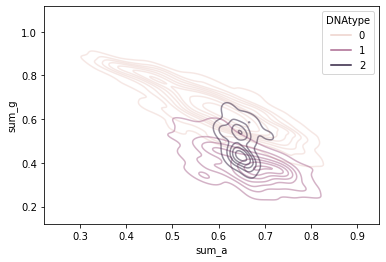

In [63]:
# plot kdeplot between sum_a and sum_g
sns.kdeplot('sum_a', 'sum_g', hue = 'DNAtype',  data = data_dnatype, alpha  = 0.5, )
plt.show()

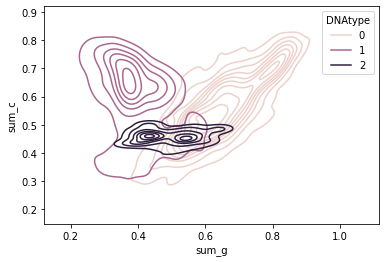

In [64]:
# plot kdeplot between sum_c and sum_g
sns.kdeplot('sum_g', 'sum_c', hue = 'DNAtype',  data = data_dnatype, alpha  = 1)
plt.show()

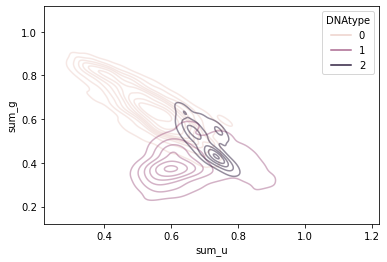

In [65]:
# plot kdeplot between sum_u and sum_g
sns.kdeplot('sum_u', 'sum_g', hue = 'DNAtype',  data = data_dnatype, alpha  = 0.5, )
plt.show()


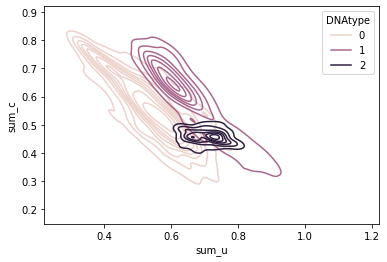

In [66]:
# plot kdeplot between sum_c and sum_u
sns.kdeplot('sum_u', 'sum_c', hue = 'DNAtype',  data = data_dnatype, alpha  = 1)
plt.show()

Conclusion:   
* KDE plot of sum_uand sum_c seems to be very important feature for classification of types of DNA used.


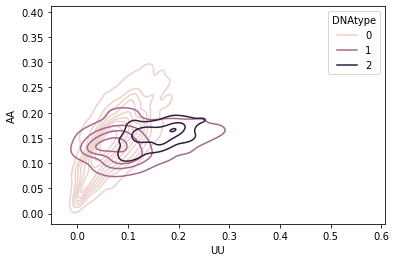

In [67]:
# plot kdeplot between AA and UU
sns.kdeplot('UU', 'AA', hue = 'DNAtype',  data = data_dnatype, alpha  = 1)
plt.show()

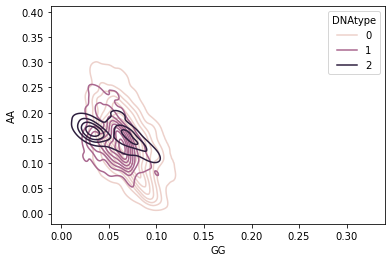

In [68]:
# plot kdeplot between GG and AA
sns.kdeplot('GG', 'AA', hue = 'DNAtype',  data = data_dnatype, alpha  = 1)
plt.show()

* Correlation plot

I have used **pearson correlation cofficient** for determining correlation as we are given probaliblities not the rank (so I discarded spearman correlation)

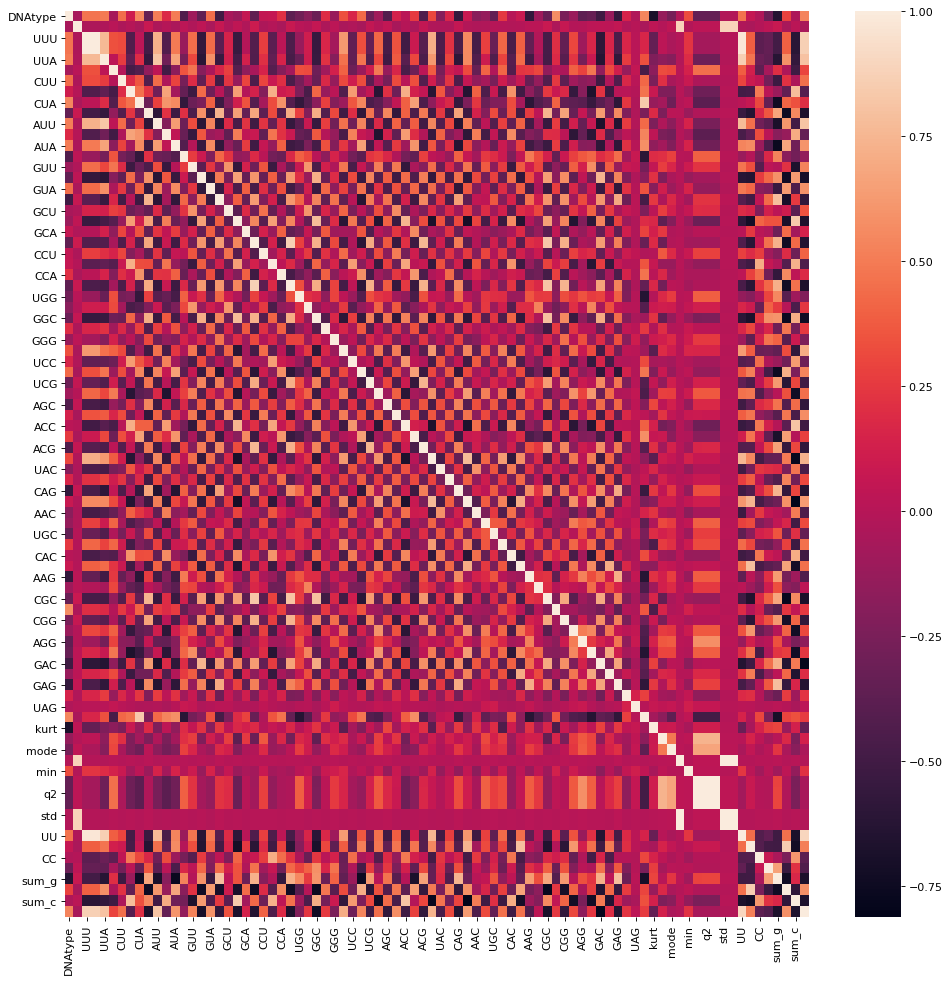

In [69]:
from matplotlib.pyplot import figure
figure(figsize=(15, 15), dpi=80)
codons_corr = data_dnatype.corr(method='pearson')
sns.heatmap(codons_corr)
plt.show()

#### 2.1.3 Visualization

In [70]:
Y = data_dnatype['DNAtype']
X = data_dnatype.drop(['DNAtype'], axis = 1)

**A) Principal Component Analysis**

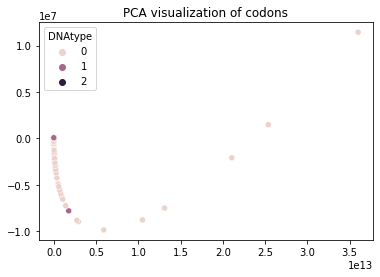

In [71]:
pca = PCA(n_components = 2)
X_pca = pca.fit_transform(X)
sns.scatterplot(x = X_pca[:, 0], y = X_pca[:, 1], hue=Y)
plt.title('PCA visualization of codons')
plt.show()

* PCA is not able to cluster the datapoints very well.

**B) TSNE**

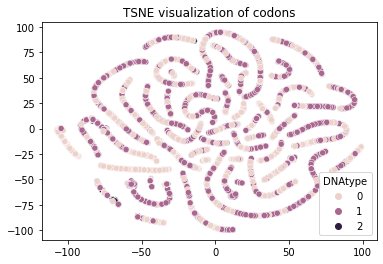

In [72]:
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)
sns.scatterplot(x = X_tsne[:, 0], y = X_tsne[:, 1], hue=Y)
plt.title('TSNE visualization of codons')
plt.show()

### 2.2 Train-Test Split

Shape of training data (10384, 83)
Shape of test data (2596, 83)


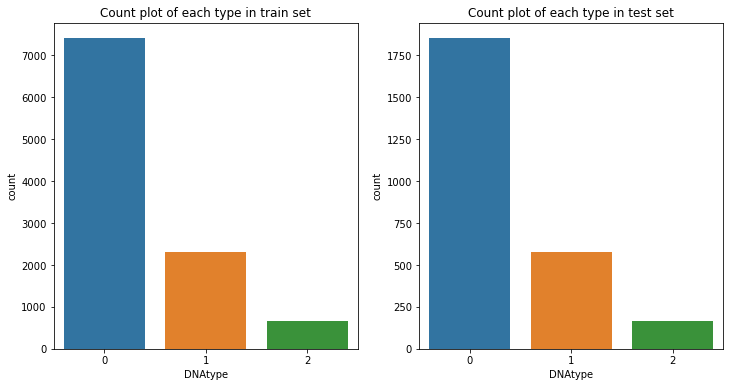

In [73]:
# split data into train and test set
x_train_d, x_test_d, y_train_d, y_test_d = train_test_split(X, Y, train_size = 0.8, stratify = Y, random_state = 40)

print('Shape of training data', x_train_d.shape)
print('Shape of test data', x_test_d.shape)

fig = plt.figure(figsize=(12, 6))

plt.subplot(121)
# plot count of each class in train
sns.countplot(x = y_train_d, order=[0,1,2])
plt.title('Count plot of each type in train set')
# plt.show()

plt.subplot(122)
# plot count of each class in test
sns.countplot(x = y_test_d, order = [0,1,2])
plt.title('Count plot of each type in test set')
plt.show()

In [74]:
testing_data_for_dnatype = x_test_d[['Ncodons', 'UUU', 'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG',
       'AUU', 'AUC', 'AUA', 'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC',
       'GCA', 'GCG', 'CCU', 'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA',
       'GGG', 'UCU', 'UCC', 'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA',
       'ACG', 'UAU', 'UAC', 'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU',
       'CAC', 'AAA', 'AAG', 'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU',
       'GAC', 'GAA', 'GAG', 'UAA', 'UAG', 'UGA']]

testing_data_for_dnatype.to_csv ('testing_data_for_dnatype.csv', index = None, header=True)
y_test_d.to_csv ('y_test_d.csv', index = None, header=True)

**A) SMOTE**

Shape of training data (22236, 83)
Shape of test data (2596, 83)


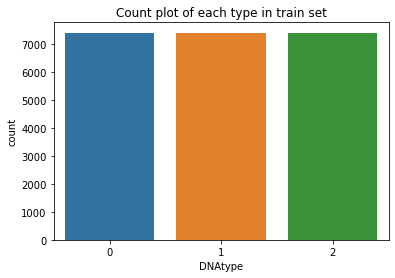

In [75]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
x_train_smt_d, y_train_smt_d = smt.fit_resample(x_train_d, y_train_d)
x_train_smt_d = pd.DataFrame(x_train_smt_d, columns = x_train_d.columns)

assert x_train_d.shape[0]==y_train_d.shape[0], "The Shape of target and predictor variable is not same in training set"
assert x_train_d.shape[0]==y_train_d.shape[0], "The Shape of target and predictor variable is not same in test set"


print('Shape of training data', x_train_smt_d.shape)
print('Shape of test data', x_test_d.shape)

sns.countplot(x = y_train_smt_d, order=[0,1,2])
plt.title('Count plot of each type in train set')
plt.show()


**B) ADASYN**

Shape of training data (22206, 83)
Shape of test data (2596, 83)


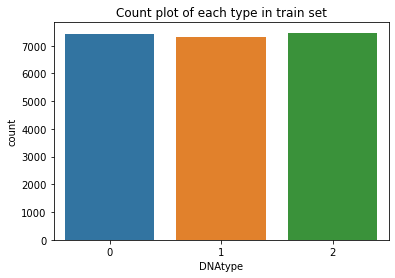

In [76]:
from imblearn.over_sampling import ADASYN 
ada = ADASYN(random_state=42)
x_train_ada_d, y_train_ada_d = ada.fit_resample(x_train_d, y_train_d)
x_train_ada_d = pd.DataFrame(x_train_ada_d, columns = x_train_d.columns)

print('Shape of training data', x_train_ada_d.shape)
print('Shape of test data', x_test_d.shape)

sns.countplot(x = y_train_ada_d, order=[0,1,2])
plt.title('Count plot of each type in train set')
plt.show()


Evaluation matrix Selection:      

 Since out data has huge Imbalance 
 * So I discarded accuracy as evaluation matrix.
 * I selected AUC roc curve and  F1-score as evaluation matrics.
    * Macro F1 score was selected as we want to give equal preference to all the datapoints. 
    * Selecting F1 score help use in to give equal imporatnce to precision and recall. And it will try to criticise both equally.

#### 2.3 **Data Preprocessing**

* **Standarize data**

In [77]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Fitting smote fitted data on StandardScaler
ss_smt = StandardScaler()
x_train_smt_d_ss = ss_smt.fit_transform(x_train_smt_d)
x_train_smt_d_ss = pd.DataFrame(x_train_smt_d_ss, columns = x_train_smt_d.columns)
x_test_d_smt_ss = ss_smt.transform(x_test_d)
x_test_d_smt_ss = pd.DataFrame(x_test_d_smt_ss, columns=x_test_d.columns)

# Fitting ADASYN fitted data on StandardScaler
ss_ada = StandardScaler()
x_train_ada_d_ss = ss_ada.fit_transform(x_train_ada_d)
x_train_ada_d_ss = pd.DataFrame(x_train_ada_d_ss, columns=x_train_ada_d.columns)
x_test_d_ada_ss = ss_ada.transform(x_test_d)
x_test_d_ada_ss = pd.DataFrame(x_test_d_ada_ss, columns=x_test_d.columns)


# Fitting smote fitted data on MinMaxScaler
mm_smt = MinMaxScaler()
x_train_smt_d_mm = mm_smt.fit_transform(x_train_smt_d)
x_train_smt_d_mm = pd.DataFrame(x_train_smt_d_mm, columns = x_train_smt_d.columns)
x_test_d_smt_mm = mm_smt.transform(x_test_d)
x_test_d_smt_mm = pd.DataFrame(x_test_d_smt_mm, columns=x_test_d.columns)

# Fitting ADASYN fitted data on MinMaxScaler
mm_ada = MinMaxScaler()
x_train_ada_d_mm = mm_ada.fit_transform(x_train_ada_d)
x_train_ada_d_mm = pd.DataFrame(x_train_ada_d_mm, columns=x_train_ada_d.columns)
x_test_d_ada_mm = mm_ada.transform(x_test_d)
x_test_d_ada_mm = pd.DataFrame(x_test_d_ada_mm, columns=x_test_d.columns)


* **Label Encoding**

In [78]:
from sklearn.preprocessing import LabelEncoder

oe_smt = LabelEncoder()
y_train_smt_d_oe = oe_smt.fit_transform(np.array(y_train_smt_d))

oe_ada = LabelEncoder()
y_train_ada_d_oe = oe_ada.fit_transform(np.array(y_train_ada_d))

y_test_d_oe = oe_smt.transform(np.array(y_test_d))


Let's see now what kind of data we have now

* With Smote
    * Standarization
        * StandardScalar = ```(x_train_smt_d_ss, y_train_smt_d_oe)```;  ```(x_test_d_smt_ss, , y_test_d_oe)```
        * MinmaxScaler = ```(x_train_smt_d_mm, y_train_smt_d_oe)```,   ```(x_test_d_smt_mm, y_test_d_oe)```
    * Without Standardization = ```(x_train_smt_d, y_train_smt_d)```, ```(x_test_d, y_test_d)```


* With Adasyn
    * Standarization
        * StandarScaler  =```(x_train_ada_d_ss,  y_train_ada_d_oe)```, ```(x_test_d_ada_ss, y_test_d_oe)```
        * MinMaxScaler = ```(x_train_ada_d_mm, y_train_ada_d_oe)``` , ```(x_test_d_ada_mm, y_test_d_oe)```
    * Without Standardization = ```(x_train_ada_d, y_train_ada_d)```, ```(x_test_d, y_test_d)```

### **2.4  Modelling**

Let's write a function to fit a model on our dataset having F1-score and AUC set as evaluation matrix and print classification report

In [79]:
def fit_print_report(clf_name, x_train, y_train, x_test, y_test, params, label_encoder, plot_confusion_matrix=True, print_logs = True):

    '''A function to fit machine learninf model and print F1 and roc_auc score. 
    It also draw the classification reprot for both train and test set 
    Inputs:
        clf_name: sklearn classifier class which you want the data to be fitted
        x_train: predictor variable for training set
        y_train: target variable for training set
        x_test: predictor variable for test set
        y_test: target variable for test set
        params: hyper-parameters to pass into the model.
    Output: 
        Fitted classifier on the data (i.e post training classifier)
    '''
    #================================================Train the model=================================================
    # fit the RF classifier
    clf = clf_name(**params)
    clf.fit(x_train, y_train)
    if print_logs:
        print('#==============================Train Data Analysis================================')

    # predicting model on the train data and plot confusion matrix
    y_class_train = clf.predict(x_train)
    y_pred_train = clf.predict_proba(x_train)

    # calculate f1_score on train data
    f1_score_train = f1_score( y_train, y_class_train,  average='macro')
    if print_logs:
        print('f1-score on training data', f1_score_train)

    # calculate auc acore
    auc_train = roc_auc_score(y_train, y_pred_train, average='macro', multi_class = 'ovr')
    if print_logs:
        print('AUC score on training data', auc_train)
        print()


        print('#===============================Test Data Analysis==================================')

    # predicting model on the test data and plot confusion matrix
    y_class_test = clf.predict(x_test)
    y_pred_test = clf.predict_proba(x_test)

    # calculate f1_score on test data 
    f1_score_test = f1_score( y_test,y_class_test,  average='macro')
    if print_logs:
        print('f1-score matrix on training data', f1_score_test)

    # calculate auc acore
    auc_test = roc_auc_score(y_test, y_pred_test, average='macro', multi_class = 'ovr')
    if print_logs:
        print('AUC score on test data', auc_test)
        print()

    # plot confusion matrix
    if plot_confusion_matrix:
        if label_encoder:
            cm_train = confusion_matrix(y_train, y_class_train)
            cm_test = confusion_matrix(y_test, y_class_test)
            cm_train = pd.DataFrame(cm_train, columns = label_encoder.classes_, index = label_encoder.classes_)
            cm_test = pd.DataFrame(cm_test, columns = label_encoder.classes_, index = label_encoder.classes_)
        else:
            cm_train = confusion_matrix(y_train, y_class_train, labels = [0,1,2])
            cm_test = confusion_matrix(y_test, y_class_test, labels = [0,1,2])
            cm_train = pd.DataFrame(cm_train, columns = [0,1,2], index = [0,1,2])
            cm_test = pd.DataFrame(cm_test, columns = [0,1,2], index = [0,1,2])
            

        fig = plt.figure(figsize=(12, 4))

        plt.subplot(121)
        sns.heatmap(cm_train, annot=True, cmap="YlGnBu", )
        plt.title('Confusion Matrix on train data')
        # plt.show()

        plt.subplot(122)
        sns.heatmap(cm_test, annot = True, cmap="YlGnBu")
        plt.title('Confusion Matrix on test data')
        plt.show()
        if print_logs:
            print()

    return clf, auc_test, f1_score_test


#### **2.4.1 Logistic Regression**

* **Logistic Regression on Standard Scaler fitted Data**

Let's see the result after fitting the logistic regression on StandardScaler fitted data on both Smote and Adasyn oversampled data

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9996402048500697
AUC score on training data 0.9999993447128079

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9911499577896449
AUC score on test data 0.9991790531380266



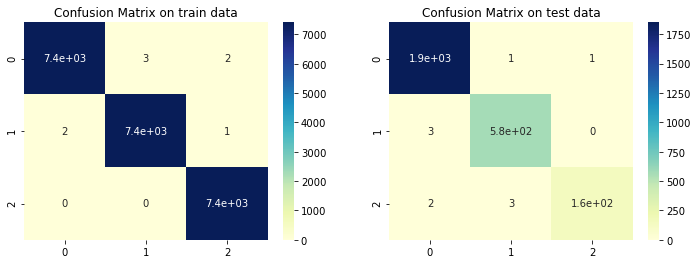


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9996395655567648
AUC score on training data 0.9999993491242819

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9911499577896449
AUC score on test data 0.9991097551684196



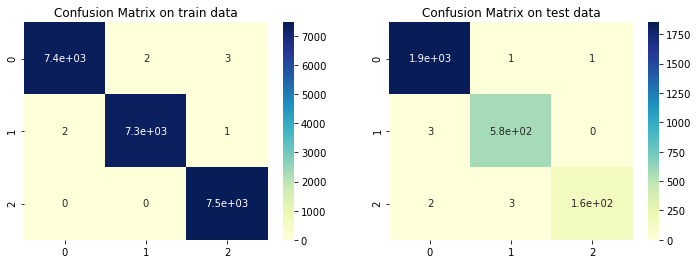

In [80]:

from sklearn.linear_model import LogisticRegression

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_ss_smt, f1_score_lr_ss_smt = fit_print_report(LogisticRegression, x_train_smt_d_ss, y_train_smt_d_oe, x_test_d_smt_ss, y_test_d_oe, params, oe_smt)


# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_ss_ada, f1_score_lr_ss_ada = fit_print_report(LogisticRegression, x_train_ada_d_ss, y_train_ada_d_oe, x_test_d_ada_ss, y_test_d_oe, params, oe_ada)

* **Logistic Regression on MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9957270928733827
AUC score on training data 0.9999248330983521

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9804752491727395
AUC score on test data 0.9989852509990657



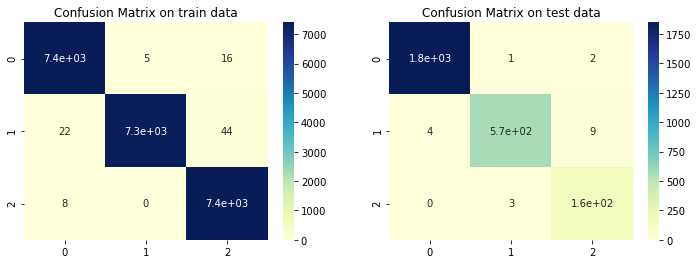


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9951314521018575
AUC score on training data 0.9999194954223869

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9796352806368517
AUC score on test data 0.9989652916111641



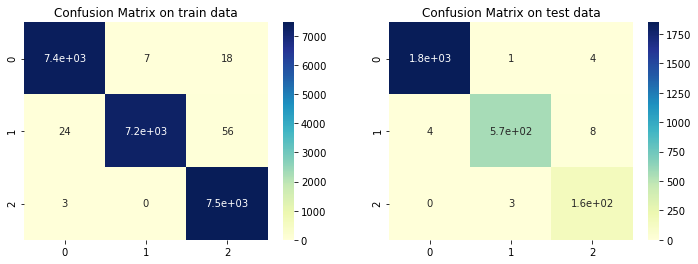

In [81]:

from sklearn.linear_model import LogisticRegression

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_mm_smt, f1_score_lr_mm_smt = fit_print_report(LogisticRegression, x_train_smt_d_mm, y_train_smt_d_oe, x_test_d_smt_mm, y_test_d_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

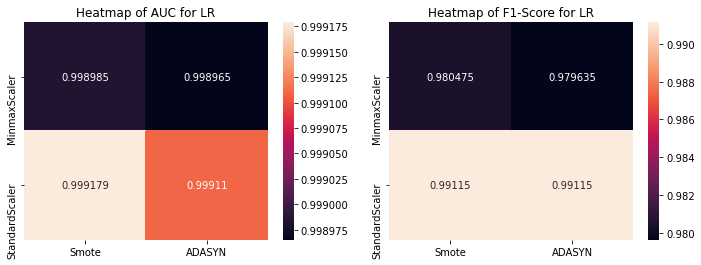

In [82]:
report_auc_lr = pd.DataFrame([[auc_lr_mm_smt, auc_lr_mm_ada],
             [auc_lr_ss_smt, auc_lr_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_lr = pd.DataFrame([[f1_score_lr_mm_smt, f1_score_lr_mm_ada],
             [f1_score_lr_ss_smt, f1_score_lr_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_lr, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for LR')

plt.subplot(122)
sns.heatmap(report_f1_score_lr, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for LR' )
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:03<00:00,  1.60it/s]


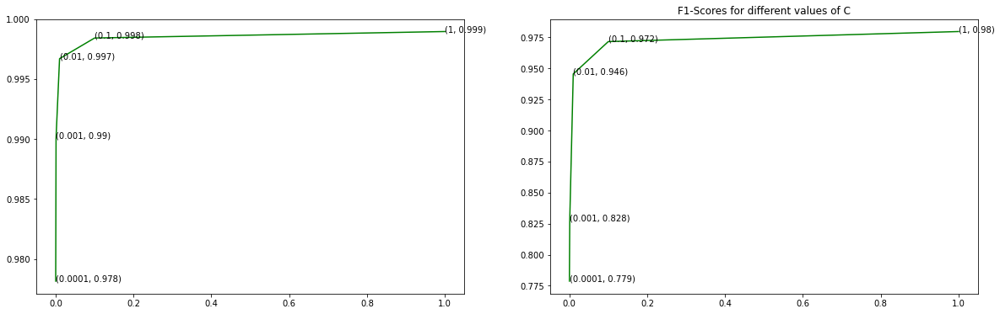

In [83]:
val_c = [0.0001, 0.001, 0.01, 0.1, 1]

auc_scores = []
f1_scores = []

for c in tqdm.tqdm(val_c):
    params = dict(C = c, max_iter = 10000)
    _, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt, False, False)
    auc_scores.append(auc_lr_mm_ada)
    f1_scores.append(f1_score_lr_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_c, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_c[i],np.round(txt,3)), (val_c[i],auc_scores[i]))
plt.title('Auc Score for different values of C')

sns.lineplot(x= val_c, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_c[i],np.round(txt,3)), (val_c[i],f1_scores[i]))
plt.title('F1-Scores for different values of C')

plt.show()

The top 15 most pos. important feature are:  ['kurt', 'CAG', 'GAC', 'GAU', 'sum_g', 'GAA', 'AAU', 'GUU', 'AAG', 'GUG', 'UGC', 'GGC', 'GUC', 'AA', 'ACC']
The top 15 most pos. important feature are:  ['CGU', 'AUA', 'UU', 'UGA', 'median', 'GGU', 'UCC', 'AUU', 'sum_u', 'CUU', 'GUA', 'UUA', 'CUA', 'CGA', 'min']


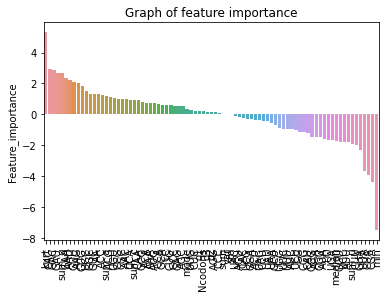

In [84]:

# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.2 Naive Bayes**


Fitting the Naive Bayes model and printing the classification report

* **Naive Bayes on Standard Scaler fitted Data**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9612803457623963
AUC score on training data 0.9955805035119996

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.850339892971553
AUC score on test data 0.9909594351737091



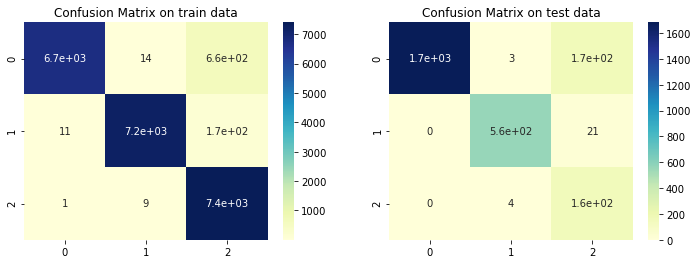


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9538728517508966
AUC score on training data 0.9942683391160161

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8369315808891628
AUC score on test data 0.9897750976131171



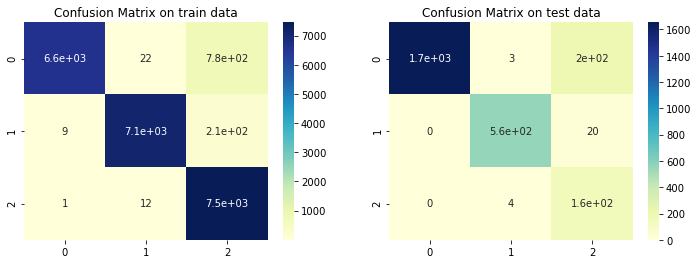

In [85]:

from sklearn.naive_bayes import GaussianNB

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_ss_smt, f1_score_nb_ss_smt = fit_print_report(GaussianNB, x_train_smt_d_ss, y_train_smt_d_oe, x_test_d_smt_ss, y_test_d_oe, params, oe_smt)

# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_ss_ada, f1_score_nb_ss_ada = fit_print_report(GaussianNB, x_train_ada_d_ss, y_train_ada_d_oe, x_test_d_ada_ss, y_test_d_oe, params, oe_ada)

* **Naive Bayes on MinMax Scaler fitted Data**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.966598572542082
AUC score on training data 0.9965687114854953

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.871464061543878
AUC score on test data 0.9926169662724216



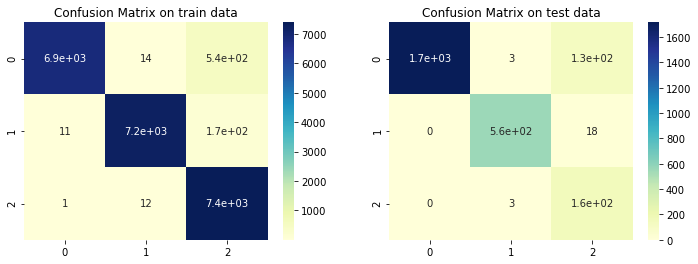


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9595625217340413
AUC score on training data 0.99513072270322

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.8546735631182213
AUC score on test data 0.9917820335295805



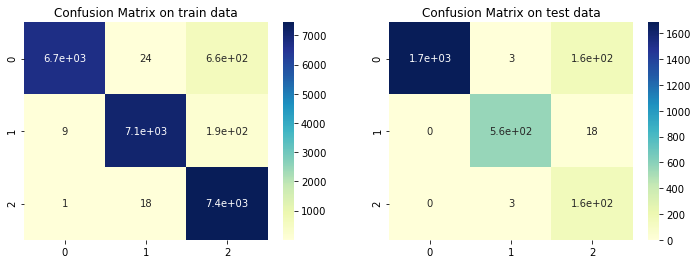

In [86]:

from sklearn.naive_bayes import GaussianNB

# fitting GaussianNB  on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_mm_smt, auc_nb_mm_smt, f1_score_nb_mm_smt = fit_print_report(GaussianNB, x_train_smt_d_mm, y_train_smt_d_oe, x_test_d_smt_mm, y_test_d_oe, params, oe_smt)

# fitting  GaussianNB on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_nb_mm_ada, f1_score_nb_mm_ada = fit_print_report(GaussianNB, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

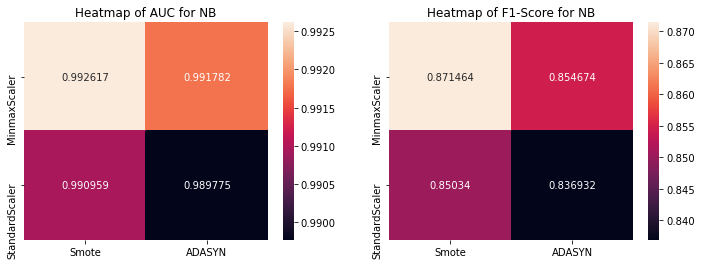

In [87]:
report_auc_nb = pd.DataFrame([[auc_nb_mm_smt, auc_nb_mm_ada],
             [auc_nb_ss_smt, auc_nb_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_nb = pd.DataFrame([[f1_score_nb_mm_smt, f1_score_nb_mm_ada],
             [f1_score_nb_ss_smt, f1_score_nb_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_nb, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for NB')

plt.subplot(122)
sns.heatmap(report_f1_score_nb, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for NB' )
plt.show()

The top 15 most pos. important feature are:  ['kurt', 'UGA', 'min', 'CUA', 'CGA', 'ACA', 'Ncodons', 'GCA', 'CAU', 'GUU', 'mode', 'AUG', 'GG', 'UCU', 'UAA']
The top 15 most pos. important feature are:  ['UGC', 'CGC', 'CAC', 'sum_u', 'AGC', 'GUG', 'ACC', 'CAG', 'CUG', 'CUC', 'GUC', 'GAC', 'GGC', 'GCC', 'sum_c']


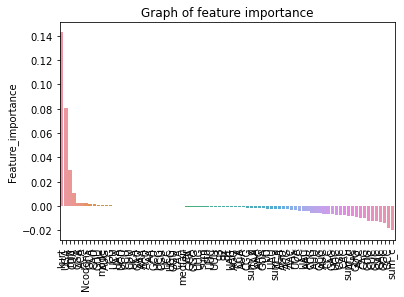

In [88]:
# get feature importances

from sklearn.inspection import permutation_importance

params = dict()
clf_mm_smt, auc_nb_mm_smt, f1_score_nb_mm_smt = fit_print_report(GaussianNB, x_train_smt_d_mm, y_train_smt_d_oe, x_test_d_smt_mm, y_test_d_oe, params, oe_smt, False, False)


imps = permutation_importance(clf_mm_smt, x_test_d_smt_mm, y_test_d_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_train_smt_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.3 Support Vector Classifier**


Fitting the SVC model and printing the classification report

* **SVC model on StandardScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9995502697011486
AUC score on training data 0.9999861085182772

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9904258403512065
AUC score on test data 0.9996137319052846



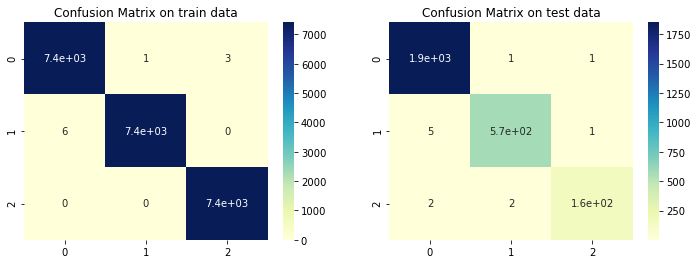


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9997298721851372
AUC score on training data 0.9999843802304428

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9917288128866506
AUC score on test data 0.9997474628864241



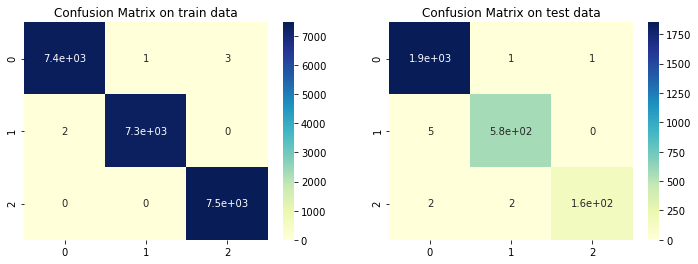

In [89]:

from sklearn.svm import SVC

# fitting SVC on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_ss_smt, f1_score_svc_ss_smt = fit_print_report(SVC, x_train_smt_d_ss, y_train_smt_d_oe, x_test_d_smt_ss, y_test_d_oe, params, oe_smt)

# fitting SVC  on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Spportvector classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability = True)
clf, auc_svc_ss_ada, f1_score_svc_ss_ada = fit_print_report(SVC, x_train_ada_d_ss, y_train_ada_d_oe, x_test_d_ada_ss, y_test_d_oe, params, oe_ada)

* **SVC model with MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9978861843571726
AUC score on training data 0.9999920455415862

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9896927001858438
AUC score on test data 0.9986575202710487



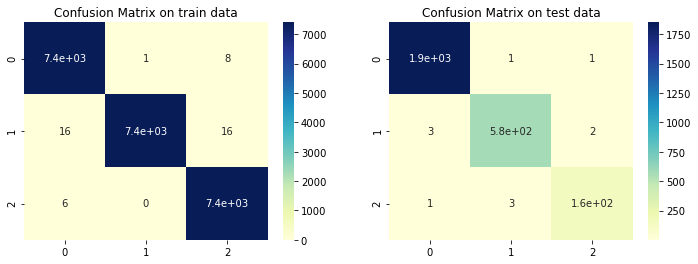


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + MINMAX Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.997883188751087
AUC score on training data 0.9999891435817977

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9909889355933323
AUC score on test data 0.9987952143090189



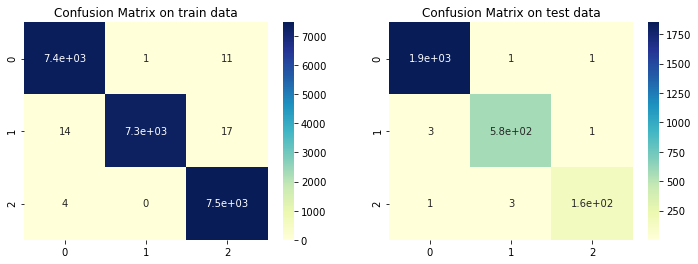

In [90]:

# fitting SVC on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on SMOTE + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_mm_smt, f1_score_svc_mm_smt = fit_print_report(SVC, x_train_smt_d_mm, y_train_smt_d_oe, x_test_d_smt_mm, y_test_d_oe, params, oe_smt)

# fitting SVC on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + MINMAX Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(SVC, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

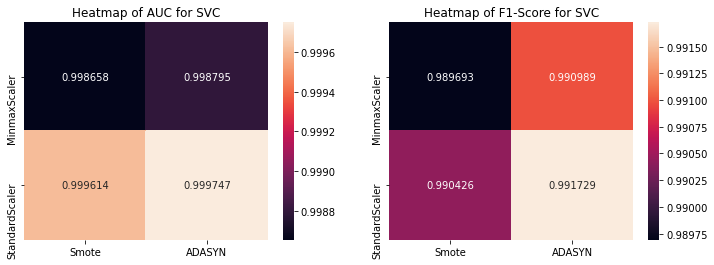

In [91]:
report_auc_svc = pd.DataFrame([[auc_svc_mm_smt, auc_svc_mm_ada],
             [auc_svc_ss_smt, auc_svc_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_svc = pd.DataFrame([[f1_score_svc_mm_smt, f1_score_svc_mm_ada],
             [f1_score_svc_ss_smt, f1_score_svc_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_svc, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for SVC')

plt.subplot(122)
sns.heatmap(report_f1_score_svc, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for SVC' )
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:58<00:00,  9.75s/it]


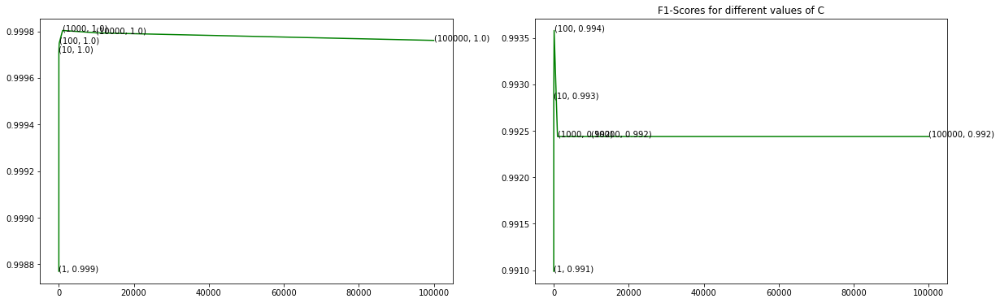

In [92]:
val_c = [1, 10, 100, 1000, 10000, 100000]

auc_scores = []
f1_scores = []

for c in tqdm.tqdm(val_c):
    params = dict(C = c, probability=True)
    _, auc_knn_mm_ada, f1_score_knn_mm_ada = fit_print_report(SVC, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt, False, False)
    auc_scores.append(auc_knn_mm_ada)
    f1_scores.append(f1_score_knn_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_c, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_c[i],np.round(txt,3)), (val_c[i],auc_scores[i]))
plt.title('Auc Score for different values of C')

sns.lineplot(x= val_c, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_c[i],np.round(txt,3)), (val_c[i],f1_scores[i]))
plt.title('F1-Scores for different values of C')

plt.show()

The top 15 most pos. important feature are:  ['Ncodons', 'UAA', 'GAA', 'GAC', 'GAU', 'AGG', 'AGA', 'CGG', 'CGA', 'CGC', 'CGU', 'AAG', 'AAA', 'CAC', 'CAU']
The top 15 most pos. important feature are:  ['ACU', 'AGC', 'AGU', 'UCG', 'UCA', 'UCC', 'UCU', 'GGG', 'GGA', 'GGC', 'GGU', 'UGG', 'CCG', 'CCA', 'sum_u']


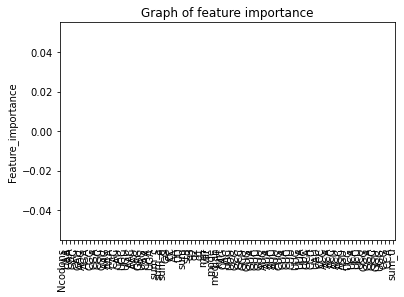

In [93]:
# get feature importances

from sklearn.inspection import permutation_importance

params = dict(probability=True)
clf, auc_svc_mm_smt, f1_score_svc_mm_smt = fit_print_report(SVC, x_train_ada_d_ss, y_train_ada_d_oe, x_test_d_ada_ss, y_test_d_oe, params, oe_ada, False, False)


imps = permutation_importance(clf_mm_smt, x_test_d_ada_ss, y_test_d_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_test_d_ada_ss.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.4 K nearest Neighbour Classifier**


Fitting the KNN classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9980666600231501
AUC score on training data 0.999998279871121

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9819543855010306
AUC score on test data 0.9934755886910507



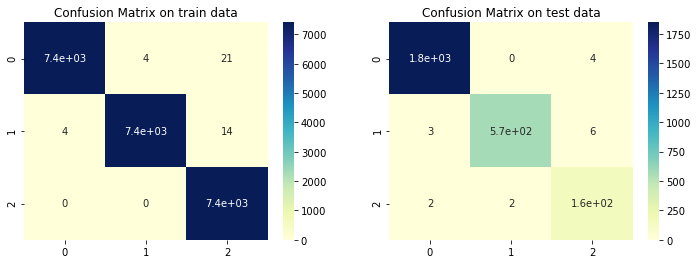


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9978436108207003
AUC score on training data 0.9999987096582382

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9834115135664189
AUC score on test data 0.9940625039016818



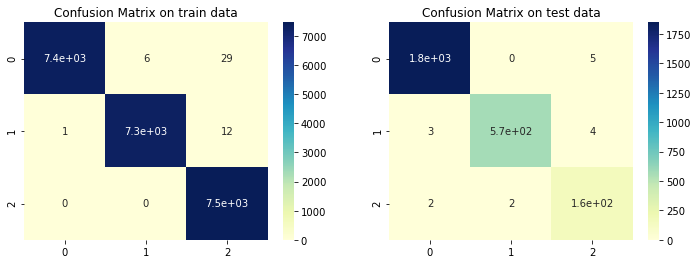

In [94]:
from sklearn.neighbors import KNeighborsClassifier

# fitting logistic regression on standardscaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN classifier on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_ss_smt, f1_score_knn_ss_smt = fit_print_report(KNeighborsClassifier, x_train_smt_d_ss, y_train_smt_d_oe, x_test_d_smt_ss, y_test_d_oe, params, oe_smt)

# fitting logistic regression on standardscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN classifier on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_ss_ada, f1_score_knn_ss_ada = fit_print_report(KNeighborsClassifier, x_train_ada_d_ss, y_train_ada_d_oe, x_test_d_ada_ss, y_test_d_oe, params, oe_ada)

* **KNN classifier on MinMaxScaler**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9977072725998593
AUC score on training data 0.9999982176795125

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9823231876111179
AUC score on test data 0.9956072308057231



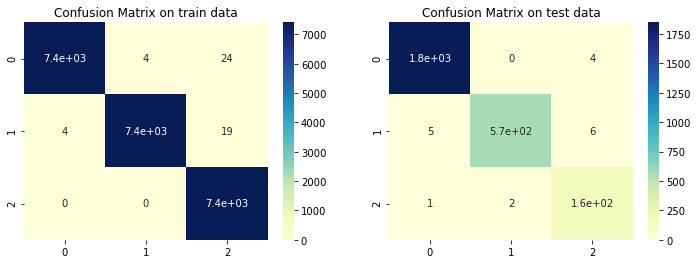


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9976640365013173
AUC score on training data 0.999998231766507

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9839624176295446
AUC score on test data 0.9950152142740528



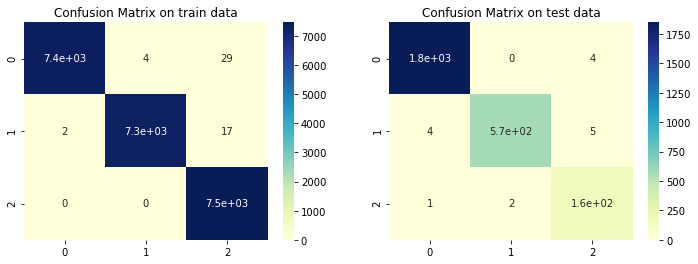

In [95]:

# fitting logistic regression on MinmaxScaler+Smote dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN on SMOTE + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_mm_smt, f1_score_knn_mm_smt = fit_print_report(KNeighborsClassifier, x_train_smt_d_mm, y_train_smt_d_oe, x_test_d_smt_mm, y_test_d_oe, params, oe_smt)

# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting KNN on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_knn_mm_ada, f1_score_knn_mm_ada = fit_print_report(KNeighborsClassifier, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

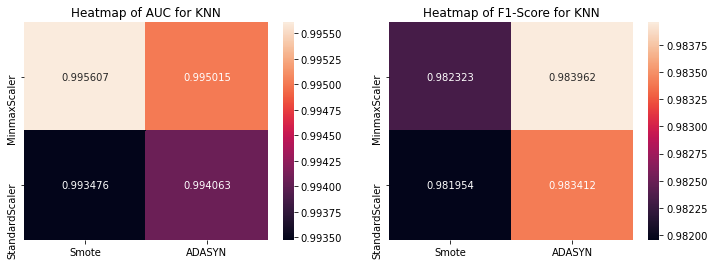

In [96]:
report_auc_knn = pd.DataFrame([[auc_knn_mm_smt, auc_knn_mm_ada],
             [auc_knn_ss_smt, auc_knn_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

report_f1_score_knn = pd.DataFrame([[f1_score_knn_mm_smt, f1_score_knn_mm_ada],
             [f1_score_knn_ss_smt, f1_score_knn_ss_ada]], columns = ['Smote', 'ADASYN'], index = ['MinmaxScaler', 'StandardScaler'])

fig = plt.figure(figsize=(12, 4))

plt.subplot(121)
sns.heatmap(report_auc_knn, annot = True, fmt = '1g' )
plt.title('Heatmap of AUC for KNN')

plt.subplot(122)
sns.heatmap(report_f1_score_knn, annot = True, fmt = '1g')
plt.title('Heatmap of F1-Score for KNN' )
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [06:12<00:00, 20.71s/it]


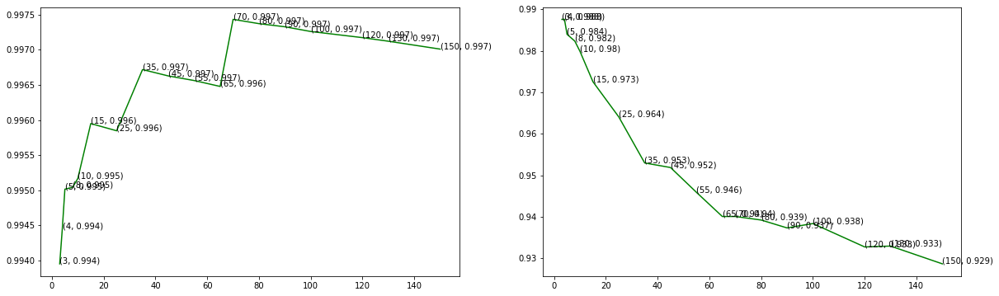

In [97]:
val_k = [3,4, 5, 8, 10, 15, 25, 35, 45, 55, 65, 70, 80, 90, 100, 120, 130, 150]

auc_scores = []
f1_scores = []

for k in tqdm.tqdm(val_k):
    params = dict(n_neighbors = k)
    _, auc_knn_mm_ada, f1_score_knn_mm_ada = fit_print_report(KNeighborsClassifier, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt, False, False)
    auc_scores.append(auc_knn_mm_ada)
    f1_scores.append(f1_score_knn_mm_ada)

fig, axes = plt.subplots(1, 2, figsize = (20, 6))

# plt.plot(val_k, auc_scores,c='g', )
sns.lineplot(x= val_k, y = auc_scores, ax = axes[0], color = 'g')
for i, txt in enumerate(np.round(auc_scores,3)):
    axes[0].annotate((val_k[i],np.round(txt,3)), (val_k[i],auc_scores[i]))

sns.lineplot(x= val_k, y = f1_scores, ax = axes[1], color = 'g')
for i, txt in enumerate(np.round(f1_scores,3)):
    axes[1].annotate((val_k[i],np.round(txt,3)), (val_k[i],f1_scores[i]))

plt.show()

#==============================Train Data Analysis================================
f1-score on training data 0.9976640365013173
AUC score on training data 0.999998231766507

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9839624176295446
AUC score on test data 0.9950152142740528



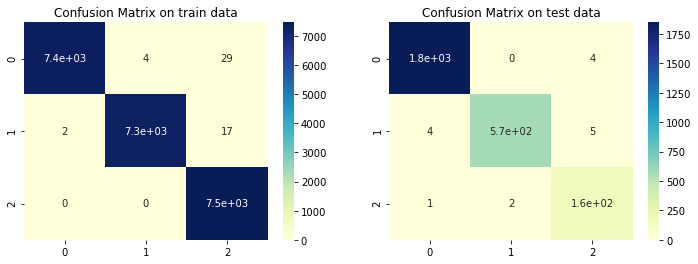


The top 15 most pos. important feature are:  ['kurt', 'UGA', 'min', 'CUA', 'Ncodons', 'CGA', 'ACA', 'GCA', 'GUU', 'UCU', 'AUG', 'GG', 'UAA', 'mode', 'CCA']
The top 15 most pos. important feature are:  ['UGC', 'GAG', 'AGC', 'CGC', 'sum_u', 'GUG', 'CAG', 'ACC', 'GUC', 'CUG', 'CUC', 'GAC', 'GGC', 'GCC', 'sum_c']


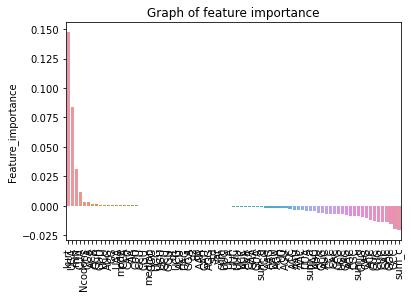

In [99]:
# get feature importances

from sklearn.inspection import permutation_importance

params = dict()
clf, auc_knn_mm_ada, f1_score_knn_mm_ada = fit_print_report(KNeighborsClassifier, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

imps = permutation_importance(clf_mm_smt, x_test_d_ada_mm, y_test_d_oe)
importances = imps.importances_mean
FI = pd.DataFrame(importances, x_test_d_ada_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.5 Random Forest Classifier**


Fitting the Random Forest classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9896527041375901
AUC score on test data 0.9997288499644844



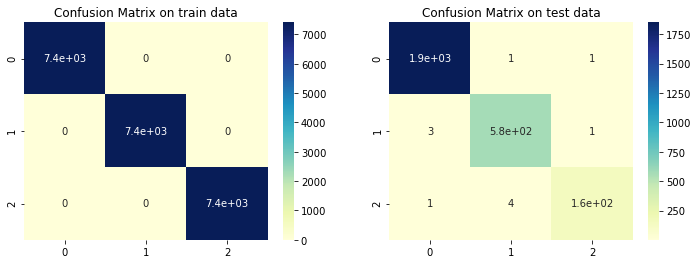


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9896527041375901
AUC score on test data 0.9996441823179175



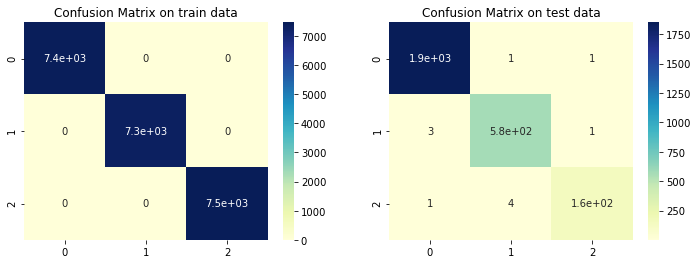

In [100]:
# fitting random forest model and print report

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_rf_smt, f1_score_rf_smt = fit_print_report(RandomForestClassifier, x_train_smt_d, y_train_smt_d, x_test_d, y_test_d, params , None)

# fitting random forest model and print report
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Random  Forest on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_rf_ada, f1_score_rf_ada = fit_print_report(RandomForestClassifier, x_train_ada_d, y_train_ada_d, x_test_d, y_test_d, params, None)

The top 15 most pos. important feature are:  ['UGA', 'kurt', 'CUA', 'GAU', 'GAC', 'sum_u', 'GAG', 'UGG', 'CAG', 'AAG', 'CGU', 'GAA', 'sum_g', 'AUU', 'GGC']
The top 15 most pos. important feature are:  ['GUU', 'CGG', 'CCA', 'CCG', 'UAU', 'UGU', 'GGA', 'ACU', 'GCA', 'median', 'UAC', 'UCA', 'mode', 'CAC', 'UAG']


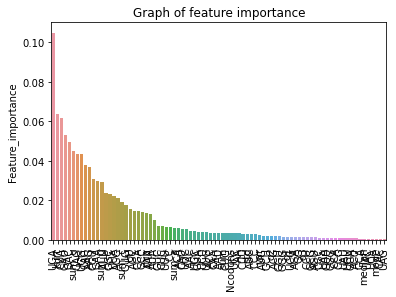

In [101]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.6 Xgboost Classifier**


Fitting the Xgboost classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGboost on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:15:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9890639497560215
AUC score on test data 0.9999537655405072



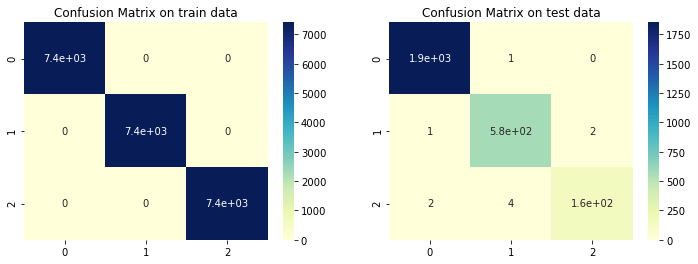


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGBoost on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:15:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9920955475623828
AUC score on test data 0.9999062086391944



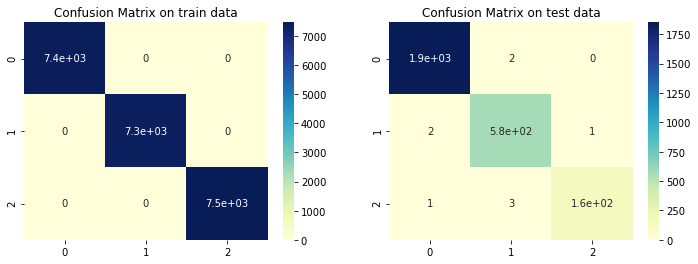

In [102]:

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGboost on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_xgb, auc_xgb_smt, f1_score_xgb_smt = fit_print_report(xgboost.XGBClassifier, x_train_smt_d, y_train_smt_d, x_test_d, y_test_d, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting XGBoost on ADASYN @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_xgb, auc_xgb_ada, f1_score_xgb_ada = fit_print_report(xgboost.XGBClassifier, x_train_ada_d, y_train_ada_d, x_test_d, y_test_d, params, None)

The top 15 most pos. important feature are:  ['UGA', 'kurt', 'CUA', 'GAU', 'GAC', 'sum_u', 'GAG', 'UGG', 'CAG', 'AAG', 'CGU', 'GAA', 'sum_g', 'AUU', 'GGC']
The top 15 most pos. important feature are:  ['GUU', 'CGG', 'CCA', 'CCG', 'UAU', 'UGU', 'GGA', 'ACU', 'GCA', 'median', 'UAC', 'UCA', 'mode', 'CAC', 'UAG']


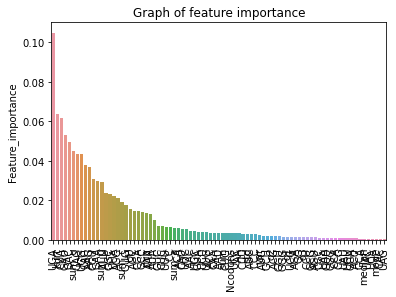

In [103]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.7 LightGBM Classifier**


Fitting the LightGBM classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9923370894209061
AUC score on test data 0.9999584388177628



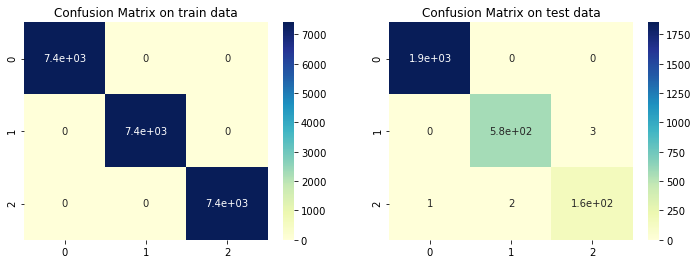


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.995683731664495
AUC score on test data 0.9999339042270541



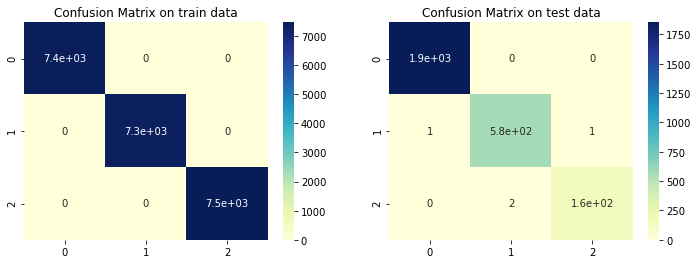

In [104]:
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")

import lightgbm
params = dict()
clf_lgb_k_smt, auc_lgb_smt, f1_score_lgb_smt = fit_print_report(lightgbm.LGBMClassifier, x_train_smt_d, y_train_smt_d, x_test_d, y_test_d, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting LightGBM on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")

params = dict()
clf_lgb_k_ada, auc_lgb_ada, f1_score_lgb_ada = fit_print_report(lightgbm.LGBMClassifier, x_train_ada_d, y_train_ada_d, x_test_d, y_test_d, params, None)

The top 15 most pos. important feature are:  ['UGA', 'kurt', 'CUA', 'GAU', 'GAC', 'sum_u', 'GAG', 'UGG', 'CAG', 'AAG', 'CGU', 'GAA', 'sum_g', 'AUU', 'GGC']
The top 15 most pos. important feature are:  ['GUU', 'CGG', 'CCA', 'CCG', 'UAU', 'UGU', 'GGA', 'ACU', 'GCA', 'median', 'UAC', 'UCA', 'mode', 'CAC', 'UAG']


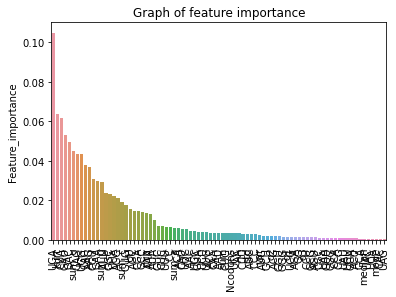

In [105]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

#### **2.4.8 Decision Tree Classifier**


Fitting the Decision Tree classifier model and printing the classification report

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9890737042049057
AUC score on test data 0.9909252495641461



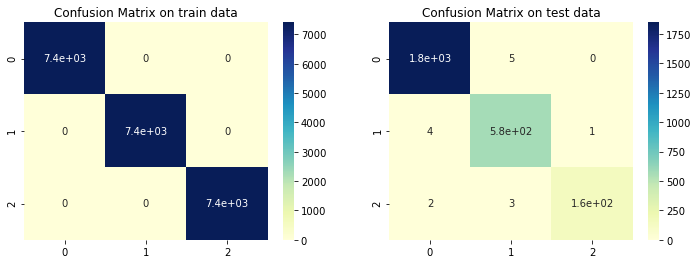


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.988752924695261
AUC score on test data 0.9915222872019448



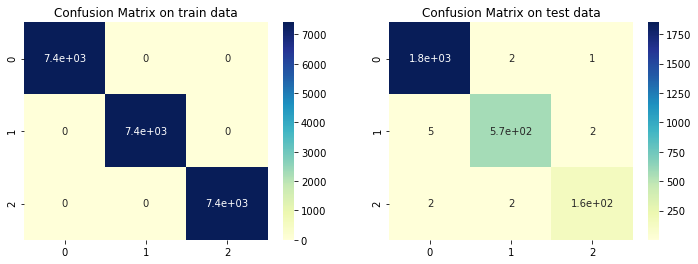

In [106]:
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on smote @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf,  auc_dt_smt, f1_score_dt_smt = fit_print_report(DecisionTreeClassifier, x_train_smt_d, y_train_smt_d, x_test_d, y_test_d, params, None)

print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Decision Tree on adasyn @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf, auc_dt_ada, f1_score_dt_ada = fit_print_report(DecisionTreeClassifier, x_train_smt_d, y_train_smt_d, x_test_d, y_test_d, params, None)

The top 15 most pos. important feature are:  ['UGA', 'kurt', 'min', 'GAA', 'UUA', 'GCC', 'UGC', 'AGU', 'AUA', 'q1', 'GGG', 'GG', 'AGA', 'GAU', 'CUA']
The top 15 most pos. important feature are:  ['CCU', 'CCA', 'GGU', 'GGC', 'UCA', 'AGC', 'ACU', 'ACC', 'ACG', 'UAU', 'CAA', 'CAG', 'AAU', 'AAC', 'sum_u']


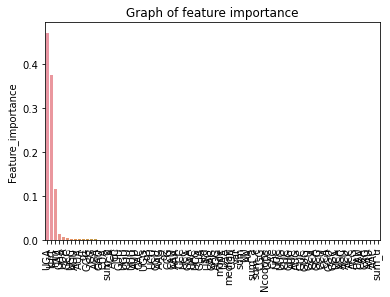

In [107]:

# get feature importances
FI = pd.DataFrame(clf.feature_importances_, x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most pos. important feature are: ', list(FI.head(15).index))
print('The top 15 most pos. important feature are: ', list(FI.tail(15).index))


# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

## Conclusion for task 2

The best model performance is LGBMClassifier Regression on Adasyn oversampling technique

#### <b>Fitting best Model</b>

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.995683731664495
AUC score on test data 0.9999339042270541



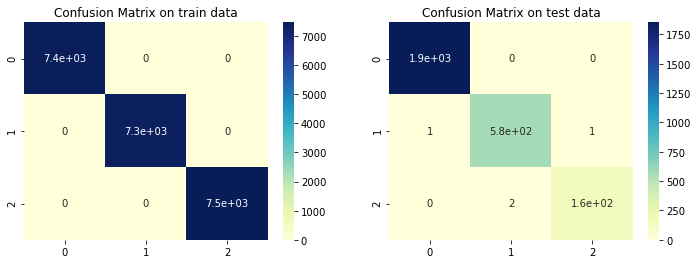


The top 15 most important feature are:  ['kurt', 'UGA', 'min', 'GAU', 'GAA', 'CGU', 'Ncodons', 'CUA', 'AAG', 'UUA', 'AGU', 'sum_u', 'q1', 'CAU', 'GCC']


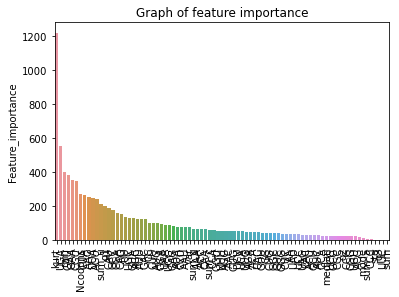

In [108]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict()
clf_lgb_k_ada, auc_lgb_ada, f1_score_lgb_ada = fit_print_report(lightgbm.LGBMClassifier, x_train_ada_d, y_train_ada_d, x_test_d, y_test_d, params, None)

# get feature importances
FI = pd.DataFrame(clf_lgb_k_ada.feature_importances_, x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most important feature are: ', list(FI.head(15).index))

# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

In [109]:
x_test_d.to_csv('test.csv', header = True, index = False, )

In [110]:
x_test_d

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,...,std,sum,UU,AA,CC,GG,sum_g,sum_a,sum_c,sum_u
6498,1022,0.05675,0.05675,0.04697,0.02935,0.02348,0.00587,0.01761,0.00978,0.03816,...,1.765803e+03,1.802734e+04,0.18982,0.16829,0.02348,0.03326,0.42655,0.65554,0.46669,0.73577
75,25446,0.02154,0.02154,0.01128,0.01839,0.01831,0.01242,0.01144,0.02252,0.01922,...,1.090759e+06,1.049965e+07,0.07275,0.13200,0.06489,0.05954,0.61500,0.59704,0.57485,0.54413
6411,1511,0.00728,0.00728,0.00596,0.00860,0.01919,0.03706,0.00397,0.00596,0.01522,...,3.850301e+03,3.853698e+04,0.02912,0.11583,0.06155,0.07479,0.61882,0.53280,0.64463,0.54271
11408,1047,0.02674,0.02674,0.03152,0.00000,0.07163,0.05731,0.04298,0.00573,0.05731,...,1.852875e+03,1.888772e+04,0.08500,0.13754,0.06208,0.05158,0.32574,0.58744,0.72591,0.61035
1175,3939,0.04494,0.04494,0.03478,0.04011,0.00914,0.00305,0.00482,0.00482,0.03783,...,2.613196e+04,2.549541e+05,0.16477,0.24650,0.02386,0.03198,0.49247,0.70092,0.40439,0.62477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7860,10203,0.01813,0.01813,0.00578,0.01098,0.01166,0.02823,0.00696,0.01353,0.01421,...,1.753454e+05,1.694100e+06,0.05302,0.12870,0.05547,0.08007,0.68068,0.54896,0.58768,0.52457
8914,4730,0.11395,0.11395,0.04926,0.08372,0.00803,0.00000,0.00169,0.00359,0.04461,...,3.768045e+04,3.666492e+05,0.36088,0.07971,0.02346,0.06977,0.63339,0.45074,0.30040,0.98516
4039,2380,0.00126,0.00126,0.00042,0.00546,0.00168,0.03739,0.00126,0.05420,0.00084,...,9.542638e+03,9.407753e+04,0.00840,0.03655,0.06638,0.08739,0.81467,0.39788,0.77982,0.32854
9819,12293,0.01171,0.01171,0.00130,0.01489,0.00594,0.02099,0.00488,0.03913,0.02237,...,2.545464e+05,2.456732e+06,0.03961,0.14187,0.05149,0.06866,0.67366,0.53707,0.61191,0.53293


### Feature selection

**Let's now use l1 penalty for logistic regression to perform feature selection with high value of lambda (i.e low value of C).**

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9924335269479415
AUC score on training data 0.9997041811339767

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9747103454081053
AUC score on test data 0.9992016246150737



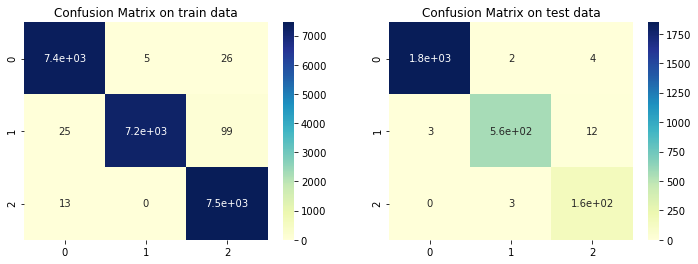

In [111]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000, penalty = 'l1', solver = 'saga', C=0.1)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_ada_d_mm, y_train_ada_d_oe , x_test_d_ada_mm, y_test_d_oe, params, oe_smt)

The top 15 most important feature are:  ['kurt', 'sum_g', 'AAG', 'CAG', 'q1', 'GAC', 'CGU', 'GAU', 'AGG', 'AGA', 'CGG', 'CGC', 'Ncodons', 'GAA', 'CAC', 'CAU', 'UGC', 'UGU', 'AAC', 'AAU', 'AAA', 'UAA', 'GAG', 'UUU', 'sum_c', 'sum_a', 'GG', 'CC', 'AA', 'UU', 'sum', 'std', 'q3', 'q2', 'var', 'mode', 'median', 'UGA', 'UAG', 'CAA', 'UAC', 'UAU', 'CCA', 'CCU', 'ACG', 'GCA', 'GCC', 'GCU', 'GUG', 'GUC', 'GUU', 'AUG', 'AUA', 'AUC', 'CUG', 'CUC', 'UUG', 'UUC', 'CCC', 'GCG', 'CCG', 'UCC', 'ACA', 'ACC', 'ACU', 'AGC', 'AGU', 'UCG', 'UGG', 'UCA', 'UCU', 'GGG', 'GGA', 'GGC', 'GGU', 'AUU', 'CUU', 'sum_u', 'GUA', 'CUA', 'CGA', 'UUA', 'min']
       Feature_importance
kurt             8.522868
sum_g            3.398298
AAG              2.052818
CAG              2.045827
q1               1.882066
...                   ...
GUA             -2.998962
CUA             -3.539470
CGA             -3.635517
UUA             -4.784506
min            -14.910157

[83 rows x 1 columns]


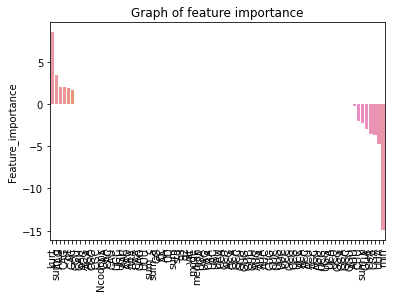

In [112]:
# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_ada_d_mm.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most important feature are: ', list(FI.index))
print(FI)

# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

In [113]:
# get features having FI!=0
G_features = FI[FI['Feature_importance']!=0].index

# prepare training daat with imp features
x_train_f = x_train_ada_d_mm[G_features]
x_test_f = x_test_d_ada_mm[G_features]

##### Fitting the model after feature selection

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9818820854649006
AUC score on training data 0.9982214264056931

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9529089302233311
AUC score on test data 0.9975110414214715



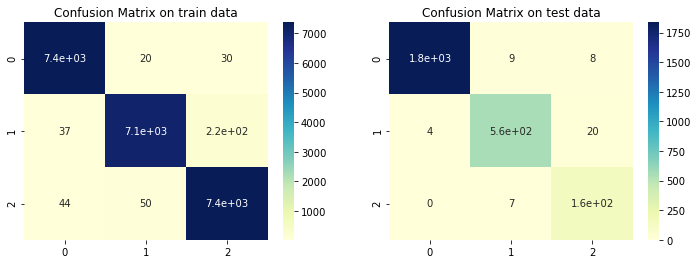


The top 15 most important feature are:  ['kurt', 'AAG', 'CAG', 'GAC', 'q1', 'sum_g', 'AUU', 'GUA', 'UUA', 'CGA', 'CUU', 'sum_u', 'CUA', 'min']


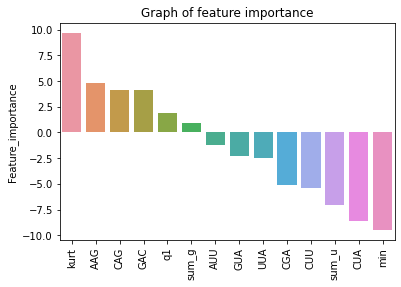

In [114]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting Logistic Regression on ADASYN + MinMax Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(max_iter = 1000, C = 1)
clf, auc_lr_mm_ada, f1_score_lr_mm_ada = fit_print_report(LogisticRegression, x_train_f, y_train_ada_d_oe , x_test_f, y_test_d_oe, params, oe_smt)

# get feature importances
FI = pd.DataFrame(clf.coef_[0], x_train_f.columns, columns=['Feature_importance'])
FI = FI.sort_values(by = 'Feature_importance', ascending = False)
print('The top 15 most important feature are: ', list(FI.head(15).index))

# plot top 10 features1q                
ax = sns.barplot(data = FI, x = FI.index, y = FI['Feature_importance'])
ax.tick_params(axis='x', rotation=90)
plt.title('Graph of feature importance')
plt.show()

Some of the insights:
* **Two feature generated by feature engineering are in Top 15 features**
* With 1.5% of F1score drop we are able to reduce number of feature from 84 to 45.
* Since logistic regression is a very lightweight and fast model and there is **no contraint of low latency in our system, So I will choose base model trained on all the feature.**
* **Since the f1-score of LightGBM model is 0.9956 So for single model its best.**

### BEST MODEL FOR TASK 2

#==============================Train Data Analysis================================
f1-score on training data 1.0
AUC score on training data 1.0

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.995683731664495
AUC score on test data 0.9999339042270541



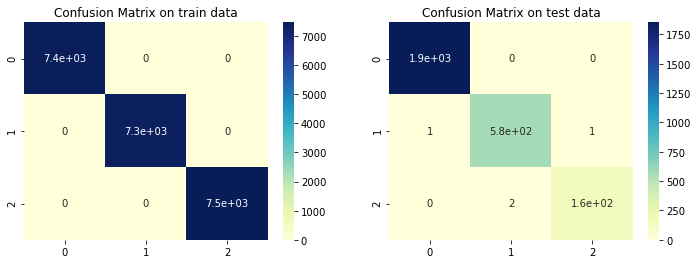

In [115]:
params = dict()
clf_lgb_k_ada, auc_lgb_ada, f1_score_lgb_ada = fit_print_report(lightgbm.LGBMClassifier, x_train_ada_d, y_train_ada_d, x_test_d, y_test_d, params, None)

In [116]:
    
import pickle
with open('class_encoding_dnatype.pkl', 'wb') as f:
    pickle.dump(oe_smt, f)
    
    
with open('clf_best_dnatype.pkl', 'wb') as f:
    pickle.dump(clf_lgb_k_ada, f)

## Trying custom Model

Let's try some custom model by doing some custom ensembling

#### 1. Trying different combination of models in enseble

In [117]:
D_ = x_train_ada_d_mm
D_['DNAtype'] = y_train_ada_d_oe
D1_, D2_ = train_test_split(D_, train_size = 0.5, stratify = D_['DNAtype'])

In [118]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

def split_data_and_fit_models(D1, D2, model_list, num_split, n, print_log=True):
    classifiers = []
    data_dict = {}

    D2y = D2['DNAtype']
    D2x = D2.drop(['DNAtype'], axis = 1)


    prediction_data = pd.DataFrame()
    # splitting and fitting classifier
    for num in range(num_split):
        data_dict[f'split_{num}'] = D1.sample(n, replace = True)
        test = data_dict[f'split_{num}']['DNAtype']
        train = data_dict[f'split_{num}'].drop(['DNAtype'], axis = 1)
        name = model_list[num]
        if name=='SVC':
            clf = SVC(probability=True)
        elif name=='lr':
            clf = LogisticRegression(max_iter = 1000)
        elif name=='dt':
            clf = DecisionTreeClassifier()
        elif name=='RF':
            clf = RandomForestClassifier()
        elif name =='xgb':
            clf = xgboost.XGBClassifier()
        elif name=='lgb':
            clf = lightgbm.LGBMClassifier()
        elif name=='nb':
            clf = GaussianNB()
        elif name=='knn':
            clf = KNeighborsClassifier(n_neighbors = 1)
        elif name=='knn_m':
            clf = KNeighborsClassifier(n_neighbors = 1, p=1)
            
            
        clf.fit(train, test)
        f1_score_train = f1_score( test, clf.predict(train),  average='macro')
        prediction_data[f'split_{num}_c1'] = clf.predict_proba(D2x)[:, 0]
        prediction_data[f'split_{num}_c2'] = clf.predict_proba(D2x)[:, 1]
#         prediction_data[f'split_{num}_c3'] = clf.predict_proba(D2x)[:, 2]
        
        classifiers.append(clf)
        if print_log:
            print(f'Fitting {name} model', f1_score_train)
    return classifiers, data_dict, prediction_data

model_list = [ 'lr', 'RF', 'xgb', 'lgb', 'SVC', 'dt', 'knn', 'nb', 'knn_m', 'lr', 'SVC', 'xgb', 'dt', 'nb']
classifiers, data_dict, prediction_data = split_data_and_fit_models(D1_, D2_, model_list,len(model_list), 4000 )

Fitting lr model 0.9930009181062696
Fitting RF model 1.0
[14:16:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Fitting xgb model 1.0
Fitting lgb model 1.0
Fitting SVC model 0.9950192337200897
Fitting dt model 1.0
Fitting knn model 1.0
Fitting nb model 0.9653721316098789
Fitting knn_m model 1.0
Fitting lr model 0.9937544129665832
Fitting SVC model 0.995019620694237
[14:16:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\HPvns\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Fitting xgb model 1.0
Fitting dt model 1.0
Fitting nb model 0.9579541318007828


In [119]:
def transform_to_prediction(data, classifiers):
    prediction_data = pd.DataFrame()
    for num, clf in enumerate(classifiers):
        prediction_data[f'split_{num}_c1'] = clf.predict_proba(data)[:, 0]
        prediction_data[f'split_{num}_c2'] = clf.predict_proba(data)[:, 1]
#         prediction_data[f'split_{num}_c3'] = clf.predict_proba(data)[:, 2]
        
    return prediction_data

prediction_test_data = transform_to_prediction(x_test_d_ada_mm, classifiers)

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#==============================Train Data Analysis================================
f1-score on training data 0.9988284359540377
AUC score on training data 0.9999994770692773

#===============================Test Data Analysis==================================
f1-score matrix on training data 0.9892733941866995
AUC score on test data 0.9940514531121548



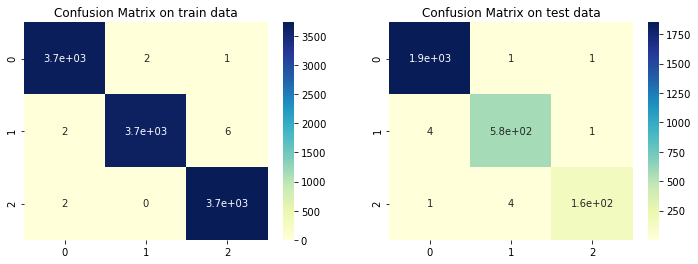

In [120]:
# fitting logistic regression on Minmaxscaler+ADASYN dataset
print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Fitting SVC on ADASYN + Standard Scaler @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@")
params = dict(probability=True)
clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(SVC, prediction_data, D2_['DNAtype'] , prediction_test_data, y_test_d_oe, params, oe_smt)

In [122]:
# Custom function for fitting different number of model

from colorama import Fore, Back, Style

def tune_custom_models(D1, D2, model_type, meta_model, num_sample, combinations_to_try = [], test_data_x = x_test_d_ada_mm, test_data_y = y_test_d_oe):
    custom_auc = []
    custom_f1_score = []
    for num in combinations_to_try:
        print(Fore.GREEN, "[INFO] : ", end = '')
        print(Fore.BLACK, f' Trying for fitting {num} models')
        model_list = [model_type]*num
        classifiers, data_dict, prediction_data = split_data_and_fit_models(D1, D2, model_list, num, num_sample, False )
        prediction_test_data = transform_to_prediction(test_data_x, classifiers)
        params = dict(probability=True)
        clf, auc_svc_mm_ada, f1_score_svc_mm_ada = fit_print_report(meta_model, prediction_data, D2['DNAtype'] , prediction_test_data, test_data_y, params, oe_smt, False, False)
        custom_auc.append(auc_svc_mm_ada)
        custom_f1_score.append(f1_score_svc_mm_ada)
        
        
    fig, axes = plt.subplots(1, 2, figsize = (20, 6))

    # plt.plot(val_k, auc_scores,c='g', )
    sns.lineplot(x= combinations_to_try, y = custom_auc, ax = axes[0], color = 'g')
    for i, txt in enumerate(np.round(custom_auc,3)):
        axes[0].annotate((combinations_to_try[i],np.round(txt,3)), (combinations_to_try[i],custom_auc[i]))
    plt.title('Auc Score for different number of models')

    sns.lineplot(x= combinations_to_try, y = custom_f1_score, ax = axes[1], color = 'g')
    for i, txt in enumerate(np.round(custom_f1_score,3)):
        axes[1].annotate((combinations_to_try[i],np.round(txt,3)), (combinations_to_try[i],custom_f1_score[i]))
    plt.title('F1-Scores for different number of models')
    plt.show()

#### 2. Trying Logistic Regression in ensemble

 [INFO] :   Trying for fitting 1 models
 [INFO] :   Trying for fitting 3 models
 [INFO] :   Trying for fitting 5 models
 [INFO] :   Trying for fitting 10 models
 [INFO] :   Trying for fitting 15 models
 [INFO] :   Trying for fitting 25 models
 [INFO] :   Trying for fitting 30 models
 [INFO] :   Trying for fitting 35 models
 [INFO] :   Trying for fitting 45 models
 [INFO] :   Trying for fitting 50 models


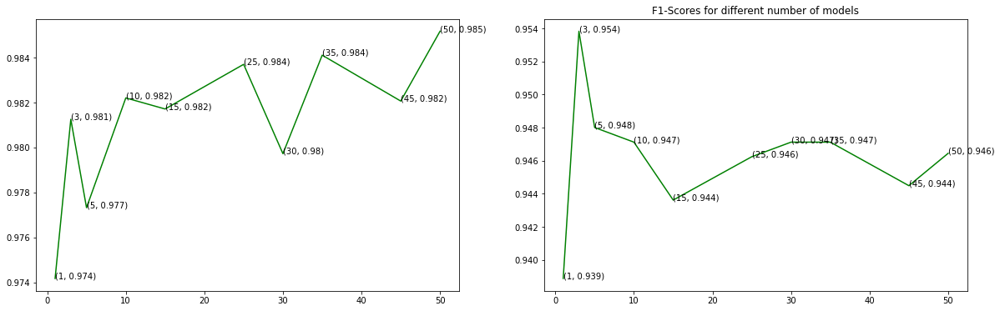

In [123]:
tune_custom_models(D1_, D2_, 'lr', SVC, 4000, [1, 3, 5, 10, 15, 25, 30, 35, 45, 50],  x_test_d_ada_ss,  y_test_d_oe)

#### 3. Trying lightGBM

In [124]:
# creating data
D_lgb = x_train_ada_d
D_lgb['DNAtype'] = y_train_ada_d
D1_lgb, D2_lgb = train_test_split(D_, train_size = 0.5, stratify = D_lgb['DNAtype'])

 [INFO] :   Trying for fitting 1 models
 [INFO] :   Trying for fitting 3 models
 [INFO] :   Trying for fitting 5 models
 [INFO] :   Trying for fitting 10 models
 [INFO] :   Trying for fitting 15 models
 [INFO] :   Trying for fitting 25 models
 [INFO] :   Trying for fitting 30 models
 [INFO] :   Trying for fitting 35 models
 [INFO] :   Trying for fitting 45 models
 [INFO] :   Trying for fitting 50 models


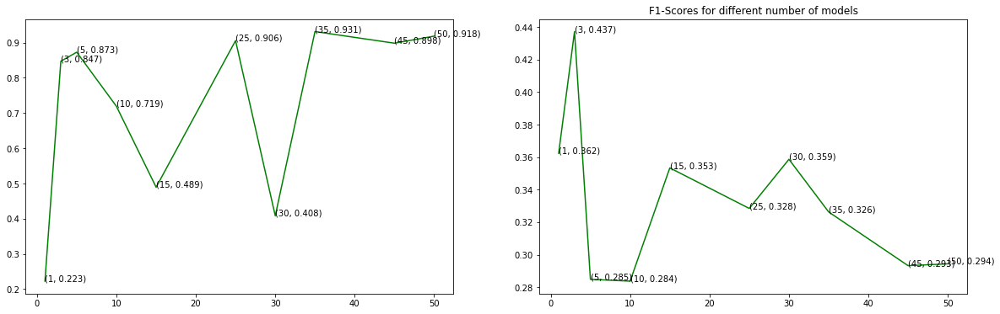

In [125]:
tune_custom_models(D1_lgb, D2_lgb, 'lgb', SVC, 4000, [1, 3, 5, 10, 15, 25, 30, 35, 45, 50],  x_test_d,  y_test_d)

### Still overall LightGBM single is the best model with the F1-score of 0.9956. Our custom models could not surpass the accuracy of Sklearn  models